select subject session FOV

In [117]:
session

'103123'

In [2]:
#%% load data
import os
import BCI_analysis
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from scipy.io import savemat
from sklearn.decomposition import PCA, FactorAnalysis
from scipy.stats import zscore
import shutil
import matplotlib.pyplot as plt

import suite2p
BinaryFile = suite2p.io.BinaryFile

use_scalar_f0 = False
recalculate_f0 = False
remove_PMT_trips = True
remove_masking_flash = False
sessionwise_base_dir = '/home/jupyter/bucket/Data/Calcium_imaging/sessionwise_tba'
s2p_base_dir = '/home/jupyter/bucket/Data/Calcium_imaging/suite2p/Bergamo-2P-Photostim'
raw_scanimage_dir = '/home/jupyter/bucket/Data/Calcium_imaging/raw/Bergamo-2P-Photostim'
bpod_path = '/home/jupyter/bucket/Data/Behavior/BCI_exported/Bergamo-2P-Photostim/'

#next_session_dir = '/home/jupyter/bucket/Data/Calcium_imaging/next_session'

maximum_decrease_in_f0 = .25 # if decreases above this amount will be thrown out
ignore_rundown = True
step_back = 60
step_forward = 300


subject = 'BCI_66'
fov = 'FOV_02'

subject = 'BCI_68'
fov = 'FOV_02'


subject = 'BCI_70'
fov = 'FOV_01'

subject = 'BCI_72'
fov = 'FOV_01'
use_red_channel = False
load_neuropil= True
load_mean_FOV = False
next_session_dir = '/home/jupyter/bucket/Data/Calcium_imaging/next_session/{}-{}/'.format(subject, fov)
files = os.listdir(os.path.join(sessionwise_base_dir,subject))
data_dict = {}
sessions = []
stat = np.load(os.path.join(s2p_base_dir,subject,fov,'stat.npy'),allow_pickle=True).tolist()
stat_rest = np.load(os.path.join(s2p_base_dir,subject,fov,'stat_rest.npy'),allow_pickle=True).tolist()
for file in files: ### NOT ALL FILES?? - 
    
    if fov in file:
        session = file[len(subject)+1:-1*(len(fov)+5)]
        sessions.append(session)
        data_dict[session] = BCI_analysis.io_python.read_sessionwise_npy(os.path.join(sessionwise_base_dir,subject,file))
        meanimages = np.load(os.path.join(s2p_base_dir,subject,fov,'session_mean_images.npy'),allow_pickle = True).tolist()
        data_dict[session]['mean_image'] =  meanimages[session]['meanImg']
        data_dict[session]['max_image'] =  meanimages[session]['maxImg']
        F0 = np.load(os.path.join(s2p_base_dir,subject,fov,session,'F0.npy'))
        data_dict[session]['paAIP2_expression']=  np.load(os.path.join(s2p_base_dir,subject,fov,session,'z_stack_intensities.npy'),allow_pickle = True).tolist()
        try:
            data_dict[session]['stim_data']=  np.load(os.path.join(s2p_base_dir,subject,fov,session,'stim_file.npy'),allow_pickle = True).tolist()
        except:
            data_dict[session]['stim_data'] = []
        data_dict[session]['blue_light_distribution']=  np.load(os.path.join(s2p_base_dir,subject,fov,session,'blue_light_distribution.npy'),allow_pickle = True).tolist()
        
        if remove_PMT_trips:
            F_raw = data_dict[session]['F_sessionwise'].copy()
            F_corrected = F_raw.copy()
            tonan = np.nanstd(F_raw,0)<10 # HARD CODED VARIABLE, ARBITRARY
            tonan = tonan | np.concatenate([[False],np.abs(np.diff(tonan))>0]) | np.concatenate([np.abs(np.diff(tonan))>0,[False]])
            F_corrected[:,tonan] = np.nan
            F = F_corrected
            dff = (F-F0)/F0
            data_dict[session]['dff_sessionwise'] = dff
            data_dict[session]['F_sessionwise'] = F_corrected
        if remove_masking_flash:
            Fneu = np.load(os.path.join(s2p_base_dir,subject,fov,session,'Fneu.npy'))
            nan_vals = np.sum(np.isnan(data_dict[session]['F_sessionwise']),0)
            pca = PCA(n_components=10)
            pcs = pca.fit_transform((Fneu-F0)[:,nan_vals==False].T)#data_dict[session]['F_sessionwise']
            #plt.imshow(data_dict[session]['F_sessionwise'],aspect = 'auto', interpolation = 'none')
            pc0 = pcs[:,0]
            # pf0 = np.polyfit(np.nanmean(F0,0)[nan_vals==False],pc0,1)
            # pc0_ = np.polyval(pf0,np.nanmean(F0,0)[nan_vals==False])
            # pc0 -= pc0_
            F_denoised = []
            for f in data_dict[session]['F_sessionwise']-F0:
                p = np.polyfit(pc0,f[nan_vals==False],1)
                p[1]=0
                f_ = np.polyval(p,pc0)
                f[nan_vals==False]-=f_
                F_denoised.append(f)
            F = np.asarray(F_denoised)
            F+=F0
            dff = (F-F0)/F0
            data_dict[session]['dff_sessionwise'] = dff
            data_dict[session]['F_sessionwise'] = F
        
        
        
            
        if recalculate_f0:
            F_raw = data_dict[session]['F_sessionwise'].copy()
            F0, F_corrected = remove_PMT_trips_calculate_F0(F_raw)
            data_dict[session]['F_sessionwise'] = F_corrected
            dff = (F_corrected-F0)/F0
            data_dict[session]['dff_sessionwise'] = dff
        data_dict[session]['F0_sessionwise'] = F0
        if load_neuropil:
            Fneu = np.load(os.path.join(s2p_base_dir,subject,fov,session,'Fneu.npy'))
            data_dict[session]['Fneu_sessionwise'] = Fneu  
        if load_mean_FOV:
            ops =  np.load(os.path.join(s2p_base_dir,subject,fov,session,'ops.npy'),allow_pickle = True).tolist()
            binaryfile = os.path.join(s2p_base_dir,subject,fov,session,'data.bin')
            with BinaryFile(Ly=ops['Ly'], Lx=ops['Lx'], read_filename=binaryfile) as f:   
                FOV_mean_list = []
                for f_ in f.iter_frames():
                    FOV_mean_list.append(np.mean(f_[1]))
                data_dict[session]['mean_FOV']= np.asarray(FOV_mean_list)

            
         
        if use_red_channel:
            F = np.load(os.path.join(s2p_base_dir,subject,fov,session,'F_chan2.npy'))
            data_dict[session]['F_sessionwise'] =  F
            dff = (F-F0)/F0
            data_dict[session]['dff_sessionwise'] = dff
            
        
        if any(np.nanmean(F0/np.nanmedian(F0[:,:10000],1)[:,np.newaxis],0)<1-maximum_decrease_in_f0):
            throw_out_idx = np.where(np.nanmean(F0/np.nanmedian(F0[:,:10000],1)[:,np.newaxis],0)<1-maximum_decrease_in_f0)[0][0]
        else:
            throw_out_idx = data_dict[session]['dff_sessionwise'].shape[1]
        throw_out_idx = data_dict[session]['dff_sessionwise'].shape[1]
        print('{}% discarded due to f0 rundown'.format(round(100*(1-(throw_out_idx/data_dict[session]['dff_sessionwise'].shape[1])))))
        data_dict[session]['F_sessionwise'] = data_dict[session]['F_sessionwise'][:,:throw_out_idx]
        if ignore_rundown:
            data_dict[session]['dff_sessionwise'] = data_dict[session]['dff_sessionwise'][:,:throw_out_idx]
        if use_scalar_f0:
            data_dict[session]['dff_sessionwise'] = (data_dict[session]['F_sessionwise']-data_dict[session]['f0_scalar'][:,np.newaxis])/data_dict[session]['f0_scalar'][:,np.newaxis]
        data_dict[session]['photon_counts']=np.load(os.path.join(s2p_base_dir,subject,fov,session,'photon_counts.npy'),allow_pickle=True).tolist()
        data_dict[session]['signal_to_noise_trace'] = data_dict[session]['dff_sessionwise']*data_dict[session]['photon_counts']['dprime_1dFF'][:,np.newaxis]
        print(file)
        uniquecns = np.unique(np.asarray(data_dict[session]['cn'])[(np.asarray(data_dict[session]['cn'])==None) ==False])
        
        if len(uniquecns)>1:
            median_index = []
            for ucn in uniquecns:
                median_index.append(np.nanmedian(np.where(np.asarray(data_dict[session]['cn'])==ucn)[0]))
            uniquecns = uniquecns[np.argsort(median_index)] # now they are ordered
        if len(uniquecns)>1:

            cn_prev = uniquecns[0]  
            #cn = uniquecns[1]
            
            closed_loop_indices_needed = (np.asarray(data_dict[session]['cn']) == None) == False
            closed_loop_indices = np.asarray(data_dict[session]['cn'])[closed_loop_indices_needed]==cn_prev
            data_dict[session]['F_trialwise_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'go_cue', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['dff_trialwise_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'go_cue', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['F_trialwise_reward_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'reward', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['dff_trialwise_reward_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'reward', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                             data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            
            data_dict[session]['PMT_off_trialwise_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(np.isnan(data_dict[session]['F_sessionwise'])[0,:][np.newaxis,:],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'go_cue', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['PMT_off_reward_closed_loop_previous_CN'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(np.isnan(data_dict[session]['F_sessionwise'])[0,:][np.newaxis,:],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'reward', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)

            
            
            data_dict[session]['go_cue_times_previous_CN'] = data_dict[session]['go_cue_times'][closed_loop_indices]
            data_dict[session]['reward_times_previous_CN'] = data_dict[session]['reward_times'][closed_loop_indices]
            data_dict[session]['scanimage_filenames_previous_CN'] = data_dict[session]['scanimage_filenames'][closed_loop_indices],
            data_dict[session]['lick_times_previous_CN'] = data_dict[session]['lick_times'][closed_loop_indices]
            data_dict[session]['hit_previous_CN'] = data_dict[session]['hit'][closed_loop_indices]
            data_dict[session]['threshold_crossing_times_previous_CN'] = data_dict[session]['threshold_crossing_times'][closed_loop_indices]
            data_dict[session]['zaber_move_forward_previous_CN'] = data_dict[session]['zaber_move_forward'][closed_loop_indices]
            
            
        elif len(uniquecns)>2:
            print('3 CNs in a single session!!! IMPLEMENT SOMETHING')
        if len(uniquecns)>0:
            cn = uniquecns[-1]
            closed_loop_indices_needed = (np.asarray(data_dict[session]['cn']) == None) == False
            
            try:
                iterator = iter(cn)
                closed_loop_indices = []
                for cn_now in np.asarray(data_dict[session]['cn'])[closed_loop_indices_needed]:
                    if all(np.sort(cn) == np.sort(cn_now)):
                        closed_loop_indices.append(True)
                    else:
                        closed_loop_indices.append(False)
                closed_loop_indices = np.asarray(closed_loop_indices)
                
            except:
                closed_loop_indices = np.asarray(data_dict[session]['cn'])[closed_loop_indices_needed]==cn
                
            
            
            data_dict[session]['F_trialwise_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'go_cue', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['dff_trialwise_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'go_cue', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['F_trialwise_reward_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['F_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'reward', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['dff_trialwise_reward_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(data_dict[session]['dff_sessionwise'],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'reward', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            
            
            data_dict[session]['PMT_off_trialwise_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(np.isnan(data_dict[session]['F_sessionwise'])[0,:][np.newaxis,:],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'go_cue', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            data_dict[session]['PMT_off_reward_closed_loop'] = BCI_analysis.io_suite2p.sessionwise_to_trialwise(np.isnan(data_dict[session]['F_sessionwise'])[0,:][np.newaxis,:],
                                                                                                            data_dict[session]['all_si_filenames'],
                                                                                                            data_dict[session]['scanimage_filenames'][closed_loop_indices],
                                                                                                            data_dict[session]['all_si_frame_nums'],
                                                                                                            data_dict[session]['sampling_rate'],
                                                                                                            'reward', # relative to what (go_cue / reward)
                                                                                                            data_dict[session]['go_cue_times'][closed_loop_indices],
                                                                                                            data_dict[session]['reward_times'][closed_loop_indices],
                                                                                                            max_frames=None,
                                                                                                            frames_after=step_forward,
                                                                                                            frames_before=step_back)
            
            
            
            
            if data_dict[session]['dff_trialwise_closed_loop'].shape[2] == 0:
                asdsa
            data_dict[session]['go_cue_times'] = data_dict[session]['go_cue_times'][closed_loop_indices]
            data_dict[session]['reward_times'] = data_dict[session]['reward_times'][closed_loop_indices]
            data_dict[session]['scanimage_filenames'] = data_dict[session]['scanimage_filenames'][closed_loop_indices]
            data_dict[session]['lick_times'] = data_dict[session]['lick_times'][closed_loop_indices]
            data_dict[session]['hit'] = data_dict[session]['hit'][closed_loop_indices]
            data_dict[session]['threshold_crossing_times'] = data_dict[session]['threshold_crossing_times'][closed_loop_indices]
            data_dict[session]['zaber_move_forward'] = data_dict[session]['zaber_move_forward'][closed_loop_indices]
            
            
            
            
            
            
            
            data_dict[session]['time_since_trial_start'] = np.arange(-step_back,step_forward,1)/data_dict[session]['sampling_rate']
            
        
        # behavior_fname = os.path.join(bpod_path,subject, f"{session}-bpod_zaber.npy")
        # behavior_dict= np.load(behavior_fname,allow_pickle = True).tolist()
        # asdsad
        # data_dict['outputChannelsFunctions'] = behavior_dict['scanimage_roi_outputChannelsFunctions'][int(len(behavior_dict['go_cue_times'])/2)][0]
        # if 'anticorrelate' in data_dict['outputChannelsFunctions']:
        #     data_dict['training_type'] = 'anticorrelate'
        # else:
        #     data_dict['training_type'] = 'correlate'
        # del behavior_dict
        
        
        
        # if len(data_dict.keys())>3:
        #     break

        #%
        #%
sessions = np.sort(list(data_dict.keys()))
cn_list = []
for session in sessions:
    try:
        toadd = None
        i_ = len(data_dict[session]['cn'])-1
        while toadd is None:
            try:
                toadd = np.asarray(data_dict[session]['cn'])[i_]
            except:
                pass
            i_-=1
        #cn_list.append(np.unique(np.asarray(data_dict[session]['cn'])[np.asarray(data_dict[session]['cn'])!=None])) # assuming that the CN is not changing
        cn_list.append(int(toadd))
        print(toadd)
    except: 
        pass
    #%
#cn_list = np.unique(cn_list)
#%


0% discarded due to f0 rundown
BCI_72-111723-FOV_01.npy
0% discarded due to f0 rundown
BCI_72-112223-FOV_01.npy
27
30


In [3]:
#%% calculate event rate and stuff like that

# TODO amplitude should be calculated for each transient separately, then averaged over transients
# this way the long tails of long trials won't interfere
from pathlib import Path


cut_reward_activity = False
ignore_synchronous_events = True
#% calculate event rate
min_event_step = 10 # @20Hz - length of event # 10 for 6s, 5 for 8s
minimum_d_prime = 3# 5 for 6s
time_to_average_after_trial_start = 8 #seconds - 8 for 6s 4? for 8s
baseline_end_t = -.5 # seconds before GO cue
baseline_start_t = -1.5 # seconds before GO cue

file_list_to_copy_over = ['Z-positions.pdf',
                          'session_meanimages.tiff',
                          'ROI_sizes.pdf',
                          'ROIs.pdf',
                          'stat.mat',
                          'XYZ_motion.pdf',
                          'session_refImages.tiff',
                          'ops.mat']
#%

pixel_num_list = []
for s in stat:
    pixel_num_list.append(np.sum(s['soma_crop']))# &(s['overlap']==False)))
    #break
pixel_num_list=np.asarray(pixel_num_list)
    #%
for last_session in sessions: 
    
    mean_activity_matrix_normalized_previous_CN = None
    if 'dff_trialwise_closed_loop_previous_CN' in data_dict[last_session].keys():
        trialwise_matrix_name = 'dff_trialwise_closed_loop_previous_CN'#'dff_trialwise_all'
        trialwise_reward_matrix_name = 'dff_trialwise_reward_closed_loop_previous_CN'#'dff_trialwise_all'
        trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
        if trialwise_dff_until_reward.shape[2]==0:
            trialwise_matrix_name = 'dff_trialwise_all'
            trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
        #trialwise_reward_matrix = np.nan*trialwise_dff_until_reward
        trialwise_reward_matrix = data_dict[last_session][trialwise_reward_matrix_name].copy()
        step_back =np.argmax(data_dict[last_session]['time_since_trial_start']>0) -1
        trial_len = len(data_dict[last_session]['time_since_trial_start'])
        for trial_i, reward_time in enumerate(data_dict[last_session]['reward_times_previous_CN']):
            if len(reward_time)>0:

                reward_idx = np.argmax(data_dict[last_session]['time_since_trial_start']>reward_time[0])
                if reward_idx == 0:
                    reward_idx = len(data_dict[last_session]['time_since_trial_start'])
                #print(['rewarded',reward_idx])
                if cut_reward_activity:
                    trialwise_dff_until_reward[reward_idx:,:,trial_i] = np.nan
                
                #trialwise_reward_matrix[:step_back+trial_len-reward_idx,:,trial_i] = data_dict[last_session][trialwise_matrix_name][reward_idx-step_back:,:,trial_i]
        mean_reward_matrix = np.nanmean(trialwise_reward_matrix,2).T
        std_reward_matrix = np.nanstd(trialwise_reward_matrix,2).T
        mean_activity_matrix = np.nanmean(trialwise_dff_until_reward,2).T
        baseline_length = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times_previous_CN'][0][0])#
        baseline_end = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times_previous_CN'][0][0]+baseline_end_t)#
        baseline_start = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times_previous_CN'][0][0]+baseline_start_t)#
        amplitude_length = np.argmax(data_dict[last_session]['time_since_trial_start']>time_to_average_after_trial_start)
        mean_activity_matrix_normalized_previous_CN = mean_activity_matrix-np.nanmean(mean_activity_matrix[:,baseline_start:baseline_end],1)[:,np.newaxis]#/np.nanmean(mean_activity_matrix[:,:baseline_length],1)[:,np.newaxis] # TODO division is not needed here once real df/f is exported..
        mean_activity_matrix_normalized_previous_CN[np.isnan(mean_activity_matrix_normalized_previous_CN)] = 0
        mean_activity_matrix_normalized_previous_CN[np.isinf(mean_activity_matrix_normalized_previous_CN)] = 0

        data_dict[last_session]['mean_activity_matrix_previous_cn'] = mean_activity_matrix
        data_dict[last_session]['mean_reward_matrix_previous_cn'] = mean_reward_matrix
    
    trialwise_matrix_name = 'dff_trialwise_closed_loop'#'dff_trialwise_all'
    trialwise_reward_matrix_name = 'dff_trialwise_reward_closed_loop'#'dff_trialwise_all'

    trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
    if trialwise_dff_until_reward.shape[2]==0:
        trialwise_matrix_name = 'dff_trialwise_all'
        trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
    #trialwise_reward_matrix = np.nan*trialwise_dff_until_reward
    trialwise_reward_matrix = data_dict[last_session][trialwise_reward_matrix_name].copy()
    step_back =np.argmax(data_dict[last_session]['time_since_trial_start']>0) -1
    trial_len = len(data_dict[last_session]['time_since_trial_start'])
    for trial_i, reward_time in enumerate(data_dict[last_session]['reward_times']):
        if len(reward_time)>0:
            
            reward_idx = np.argmax(data_dict[last_session]['time_since_trial_start']>reward_time[0])
            if reward_idx == 0:
                reward_idx = len(data_dict[last_session]['time_since_trial_start'])
            #print(['rewarded',reward_idx])
            if cut_reward_activity:
                trialwise_dff_until_reward[reward_idx:,:,trial_i] = np.nan
           # trialwise_reward_matrix[:step_back+trial_len-reward_idx,:,trial_i] = data_dict[last_session][trialwise_matrix_name][reward_idx-step_back:,:,trial_i]
    mean_reward_matrix = np.nanmean(trialwise_reward_matrix,2).T
    std_reward_matrix = np.nanstd(trialwise_reward_matrix,2).T
    mean_activity_matrix = np.nanmean(trialwise_dff_until_reward,2).T
    baseline_length = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times'][0][0])#
    baseline_end = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times'][0][0]+baseline_end_t)#
    baseline_start = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times'][0][0]+baseline_start_t)#
    amplitude_length = np.argmax(data_dict[last_session]['time_since_trial_start']>time_to_average_after_trial_start)
    mean_activity_matrix_normalized = mean_activity_matrix-np.nanmean(mean_activity_matrix[:,baseline_start:baseline_end],1)[:,np.newaxis]#/np.nanmean(mean_activity_matrix[:,:baseline_length],1)[:,np.newaxis] # TODO division is not needed here once real df/f is exported..
    mean_activity_matrix_normalized[np.isnan(mean_activity_matrix_normalized)] = 0
    mean_activity_matrix_normalized[np.isinf(mean_activity_matrix_normalized)] = 0
    
    data_dict[last_session]['mean_activity_matrix'] = mean_activity_matrix
    data_dict[last_session]['mean_reward_matrix'] = mean_reward_matrix
    

    amplitude = np.nanmean(mean_activity_matrix_normalized[:,baseline_length:amplitude_length],1)
    # amplitude[amplitude>1] = 1
    # amplitude[amplitude<-1] = -1
    stdev = np.nanstd(mean_activity_matrix_normalized[:,baseline_length:amplitude_length],1)
    #%
    events = data_dict[last_session]['signal_to_noise_trace']>minimum_d_prime
    if ignore_synchronous_events:
        events = events & (np.nanmean(data_dict[last_session]['signal_to_noise_trace'],0)<minimum_d_prime)[np.newaxis,:]
    event_edges = np.diff(np.concatenate([np.zeros([events.shape[0],1]),events,np.zeros([events.shape[0],1])],1))
    events_clean = np.zeros(events.shape)
    event_num = []
    event_amplitude = []
    
    
        
    for i,line in enumerate(event_edges):
        starts = np.where(line==1)[0]
        ends = np.where(line==-1)[0]
        lengths = ends-starts
        amplitudes = []
        for idx in np.where(lengths>=min_event_step)[0]:
            events_clean[i,starts[idx]:ends[idx]]=np.ones(lengths[idx])*np.nanmean(data_dict[last_session]['dff_sessionwise'][i,starts[idx]:ends[idx]])#*data_dict[last_session]['photon_counts']['dprime_1dFF'][i]
            #events_clean[i,starts[idx]:ends[idx]]=data_dict[last_session]['dff_sessionwise'][i,starts[idx]:ends[idx]]
            amplitudes.append(np.max(data_dict[last_session]['dff_sessionwise'][i,starts[idx]:ends[idx]]))
        event_amplitude.append(np.mean(amplitudes))
        event_num.append(len(np.where(lengths>=min_event_step)[0]))
    events_clean[np.isnan(events_clean)] = 0
    events_clean[np.isinf(events_clean)] = 0
    event_rate = np.asarray(event_num)/(events.shape[1]/20/60)
    amplitude_rate = np.sum(events_clean,1)/(events.shape[1]/20)
    amplitude_rate[amplitude_rate<.001] = .001 #avoid zeros
    event_rate[event_rate<.001] = .001 #avoid zeros
    data_dict[last_session]['event_rate'] = event_rate
    data_dict[last_session]['amplitude_rate'] = amplitude_rate
    data_dict[last_session]['events_clean'] = events_clean
    data_dict[last_session]['trial_averaged_amplitude'] = amplitude
    
    go_cue_times = data_dict[last_session]['go_cue_times']
    reward_times = data_dict[last_session]['reward_times']
    threshold_crossing_times = data_dict[last_session]['threshold_crossing_times']
    reward_list = []
    threshold_crossing_list = []
    for g,r,t in zip(go_cue_times,reward_times,threshold_crossing_times):
        if len(r)>0:
            reward_list.append(True)
            threshold_crossing_list.append(t[0])
        else:
            reward_list.append(False)
            threshold_crossing_list.append(np.nan)
    data_dict[last_session]['rewarded_trials'] = np.asarray(reward_list)
    data_dict[last_session]['time_to_reward'] = np.asarray(threshold_crossing_list)
    
    
    try:
        go_cue_times = data_dict[last_session]['go_cue_times_previous_CN']
        reward_times = data_dict[last_session]['reward_times_previous_CN']
        threshold_crossing_times = data_dict[last_session]['threshold_crossing_times_previous_CN']
        reward_list = []
        threshold_crossing_list = []
        for g,r,t in zip(go_cue_times,reward_times,threshold_crossing_times):
            if len(r)>0:
                reward_list.append(True)
                threshold_crossing_list.append(t[0])
            else:
                reward_list.append(False)
                threshold_crossing_list.append(np.nan)
        data_dict[last_session]['rewarded_trials_previous_CN'] = np.asarray(reward_list)
        data_dict[last_session]['time_to_reward_previous_CN'] = np.asarray(threshold_crossing_list)
    except:
        print('no previous_cn')
    

/tmp/ipykernel_12761/706453375.py:115: RuntimeWarning: Mean of empty slice
  events = events & (np.nanmean(data_dict[last_session]['signal_to_noise_trace'],0)<minimum_d_prime)[np.newaxis,:]
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


no previous_cn
no previous_cn


In [165]:
# photostim example
#closed_loop_indices_needed = (np.asarray(cn_idx) == None) == False
#closed_loop_indices = np.asarray(cn_idx)[closed_loop_indices_needed]==cn_prev
all_si_filenames = np.asarray(data_dict[session]['all_si_filenames'])
closed_loop_scanimage_filenames = data_dict[session]['scanimage_filenames'][closed_loop_indices]
all_si_frame_nums = np.asarray(data_dict[session]['all_si_frame_nums'])
closed_loop_filenames = data_dict[session]['scanimage_filenames'][closed_loop_indices]
reward_L = data_dict[session]['reward_times'][closed_loop_indices]
gocue_t = data_dict[session]['go_cue_times'][closed_loop_indices]
lick_L = data_dict[session]['lick_times'][closed_loop_indices]
lickport_steps = data_dict[session]['zaber_move_forward'][closed_loop_indices]

fs = data_dict[session]['sampling_rate']
framenums = []
frame_per_file_now = []
reward_indices = []
go_cue_indices = []
trial_start_indices = []
threshold_crossing_indices = []
lick_indices = []
lickport_step_indices = []
frames_so_far  = 0
for filename_now in closed_loop_filenames:
    idx = np.where(all_si_filenames == filename_now)[0][0]
    start_frame = np.sum(all_si_frame_nums[:idx])
    framenums.append(np.arange(all_si_frame_nums[idx])+start_frame)
    frame_per_file_now.append(all_si_frame_nums[idx])
    idx_behavior = np.where(closed_loop_scanimage_filenames == filename_now)[0][0]
    reward_indices.append(np.asarray(np.asarray(reward_L[idx_behavior])*fs,int)+frames_so_far)
    go_cue_indices.append(np.asarray(np.asarray(gocue_t[idx_behavior])*fs,int)+frames_so_far)
    trial_start_indices.append([frames_so_far])
    #threshold_crossing_indices.append(np.asarray(np.asarray(threshold_crossing_times[idx_behavior])*fs,int)+frames_so_far)
    lick_indices.append(np.asarray(np.asarray(lick_L[idx_behavior])*fs,int)+frames_so_far)
    lickport_step_indices.append(np.asarray(np.asarray(lickport_steps[idx_behavior])*fs,int)+frames_so_far)
    frames_so_far = len(np.concatenate(framenums))
framenums = np.concatenate(framenums)
trial_start_trace = np.zeros_like(framenums)
trial_start_trace[np.concatenate(trial_start_indices)]+=1
reward_trace = np.zeros_like(framenums)
reward_trace[np.concatenate(reward_indices)]+=1
go_cue_trace = np.zeros_like(framenums)
go_cue_trace[np.concatenate(go_cue_indices)]+=1
#threshold_crossing_trace = np.zeros_like(framenums)
#threshold_crossing_trace[np.concatenate(threshold_crossing_indices)]+=1
lick_trace = np.zeros_like(framenums)
lick_trace[np.concatenate(lick_indices)]+=1
lickport_step_trace = np.zeros_like(framenums)
lickport_step_trace[np.concatenate(lickport_step_indices)]+=1

IndexError: boolean index did not match indexed array along dimension 0; dimension is 110 but corresponding boolean dimension is 186

/tmp/ipykernel_3119/3515940902.py:5: RuntimeWarning: Mean of empty slice
  photostim_indices = np.isnan(np.nanmean(data_dict[session]['F_sessionwise'],0))[framenums]


Text(0, 0.5, 'dF/F')

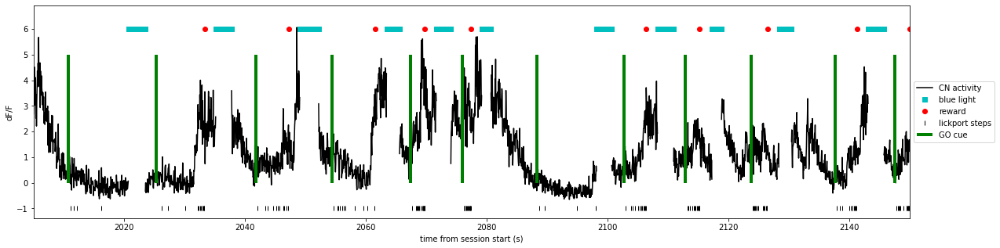

In [228]:
offset = -1
fig = plt.figure(figsize = [20,5])
ax1 = fig.add_subplot(111)
t = framenums/fs
photostim_indices = np.isnan(np.nanmean(data_dict[session]['F_sessionwise'],0))[framenums]
ax1.plot(t,data_dict[session]['dff_sessionwise'][data_dict[session]['cn'][15],framenums],'k-',label = 'CN activity')

ax1.plot(t[photostim_indices],np.ones(sum(photostim_indices))*6,'cs',label = 'blue light')
ax1.plot(t[np.where(reward_trace)[0]],np.ones(sum(reward_trace))*6,'ro',label = 'reward')
ax1.plot(t[np.where(lickport_step_trace)[0]],np.ones(sum(lickport_step_trace))*offset,'k|',label = 'lickport steps')

#ax1.plot(t[np.where(trial_start_trace)[0]],np.ones(sum(trial_start_trace))*offset,'go')
ax1.vlines(t[np.where(trial_start_trace)[0]],0,5,'green',linewidth = 4,label = 'GO cue')

ax1.set_xlim([2780,2850])
ax1.set_xlim([2005,2150])
ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax1.set_xlabel('time from session start (s)')
ax1.set_ylabel('dF/F')

/tmp/ipykernel_12761/235985402.py:18: RuntimeWarning: Mean of empty slice
  photostim_indices = np.isnan(np.nanmean(F,0))


(0.5, 1.5)

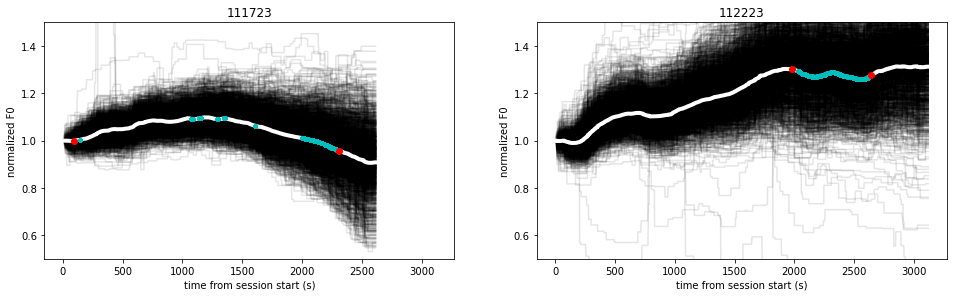

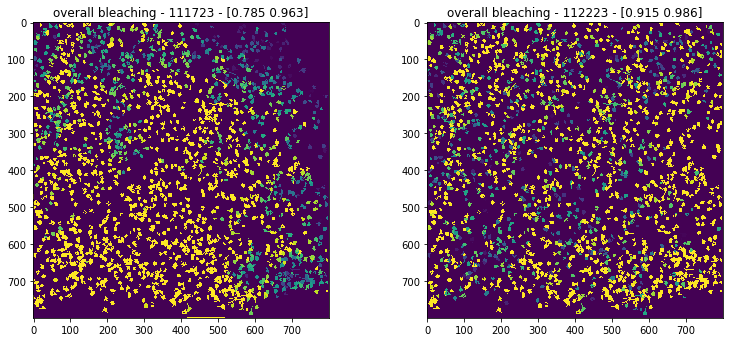

In [4]:
# bleaching
fig =plt.figure(figsize = [25,20])
fig_2d = plt.figure(figsize = [20,25])
bleaching_2d_image_list = []
bleaching_2d_image_list_from_neuropil = []
is_it_photostimmed = []
over_session_F0_bleaching_list = []
over_session_neuropil_bleaching_list = []
for session_i,session in enumerate(sessions):
    F0 = data_dict[session]['F0_sessionwise'] #F0_sessionwise
    F = data_dict[session]['F_sessionwise']
    Fneu = data_dict[session]['Fneu_sessionwise']
    Fneu[:,np.isnan(F[0,:])]=np.nan
    
    F0_norm = F0/np.nanmean(F0[:,:100],1)[:,np.newaxis]
    Fneu_norm = Fneu/np.nanmean(Fneu[:,:100],1)[:,np.newaxis]
    
    photostim_indices = np.isnan(np.nanmean(F,0))
    if session_i == 0:
        ax = fig.add_subplot(4,3,session_i+1)
        ax_orig = ax
    else:
        ax = fig.add_subplot(4,3,session_i+1,sharex = ax_orig,sharey = ax_orig)
    ax_2d = fig_2d.add_subplot(4,3,session_i+1)
    #plt.imshow(F0,aspect = 'auto',interpolation = 'none')
    mean_f0 = np.mean(F0,0)
    mean_f0 = mean_f0/np.nanmean(mean_f0[:100])
    
    
    t = np.arange(len(mean_f0))/data_dict[session]['sampling_rate']
    ax.plot(t,F0_norm.T,'k-',alpha = .1)
    ax.plot(t,mean_f0,'w-',linewidth = 4)
    ax.plot(t[np.where(photostim_indices)[0]],mean_f0[photostim_indices],'c.')
    ax.set_title(session)
    ax.set_xlabel('time from session start (s)')
    ax.set_ylabel('normalized F0')
    
    stds = np.nanstd(data_dict[session]['dff_sessionwise'],1)
    
    is_this_photostimmed = sum(photostim_indices)>10
    if is_this_photostimmed:
        start_index = np.where(photostim_indices)[0][0]-1000
        end_index = np.where(photostim_indices)[0][-1]
        start_value = np.nanmean(F0_norm[:,start_index:start_index+100],1)
        end_value  = np.nanmean(F0_norm[:,end_index:end_index+100],1)
        over_session_bleaching = end_value/start_value
        
        start_value = np.nanmean(Fneu_norm[:,start_index:start_index+100],1)
        end_value  = np.nanmean(Fneu_norm[:,end_index:end_index+100],1)
        over_session_bleaching_neuropil = end_value/start_value
        
    else:
        start_index = 50
        end_index = len(mean_f0)-50
        over_session_bleaching = np.nanmean(F0_norm[:,-100:],1)
        
        over_session_bleaching_neuropil = np.nanmean(Fneu_norm[:,-100:],1)
    over_session_bleaching[np.isinf(over_session_bleaching)] = 0
    over_session_bleaching[np.isnan(over_session_bleaching)] = 0

    over_session_bleaching_neuropil[np.isinf(over_session_bleaching_neuropil)] = 0
    over_session_bleaching_neuropil[np.isnan(over_session_bleaching_neuropil)] = 0
    
    over_session_F0_bleaching_list.append(over_session_bleaching)
    over_session_neuropil_bleaching_list.append(over_session_bleaching_neuropil)
    
    
    ax.plot([t[start_index],t[end_index]],[mean_f0[start_index],mean_f0[end_index]],'ro')
    
    
    ROI_image = np.zeros_like(data_dict[session]['mean_image'])
    neuropil_ROI_image = np.zeros_like(data_dict[session]['mean_image'])
    for i, roi_stat in enumerate(stat):
        ROI_image[roi_stat['ypix'],roi_stat['xpix']] = over_session_bleaching[i]
        neuropil_ROI_image[roi_stat['ypix'],roi_stat['xpix']] = over_session_bleaching_neuropil[i]

    im_2d = ax_2d.imshow(ROI_image,interpolation = 'none')
    
    #im_2d.set_clim([.5,1])
    over_session_bleaching = over_session_bleaching[np.isnan(over_session_bleaching)==False]
    im_2d.set_clim(np.percentile(over_session_bleaching,[5,50]))
    bleaching_2d_image_list.append(ROI_image)
    bleaching_2d_image_list_from_neuropil.append(neuropil_ROI_image)
    is_it_photostimmed.append(is_this_photostimmed)
    
    ax_2d.set_title('overall bleaching - {} - {}'.format(session,np.round(np.percentile(over_session_bleaching,[5,50]),3)))
    # if is_this_photostimmed:
    #     asd
ax.set_ylim([.5,1.5])
    #asd
    

Text(0.5, 1.0, 'mean neuropil bleaching on photostim experiments - [0.874 0.969]')

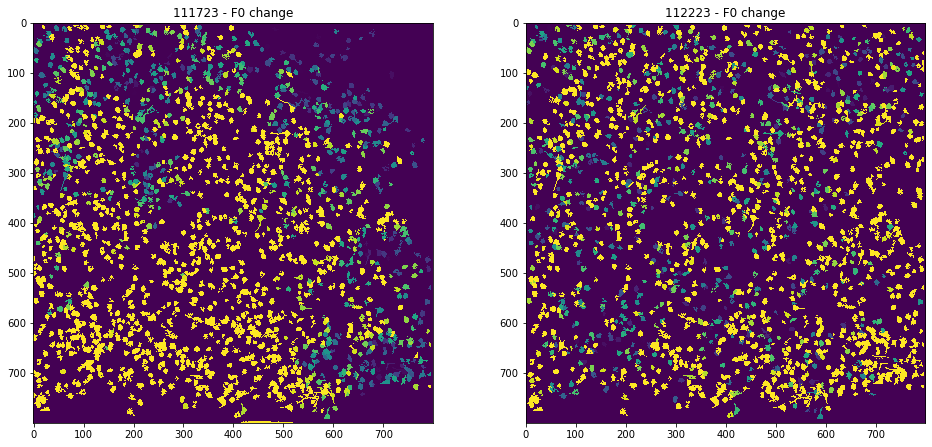

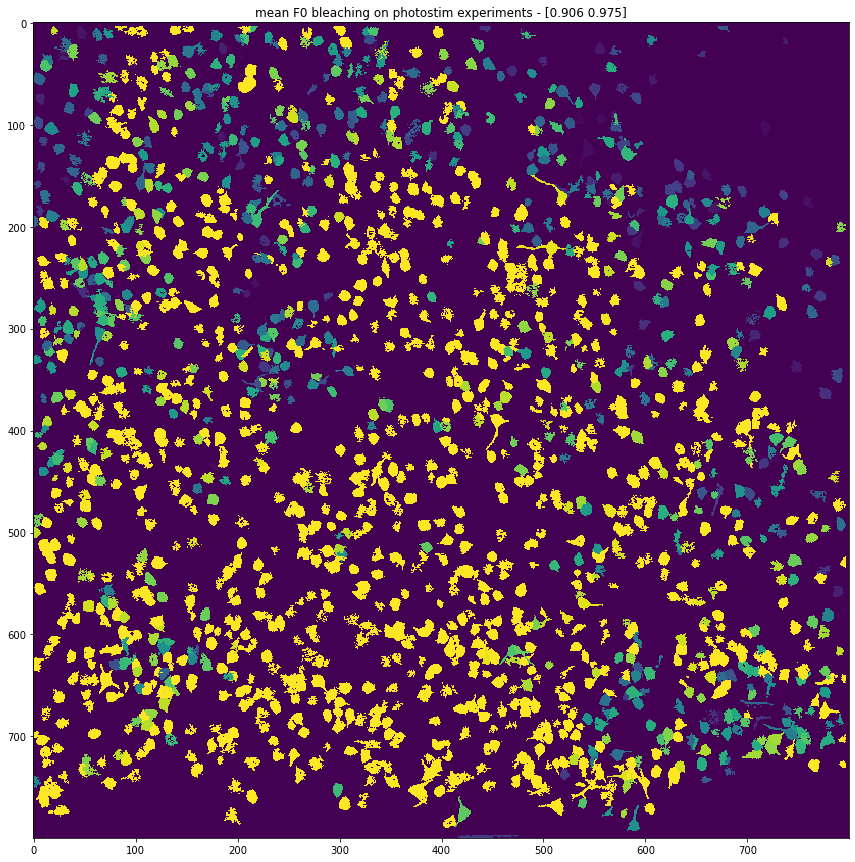

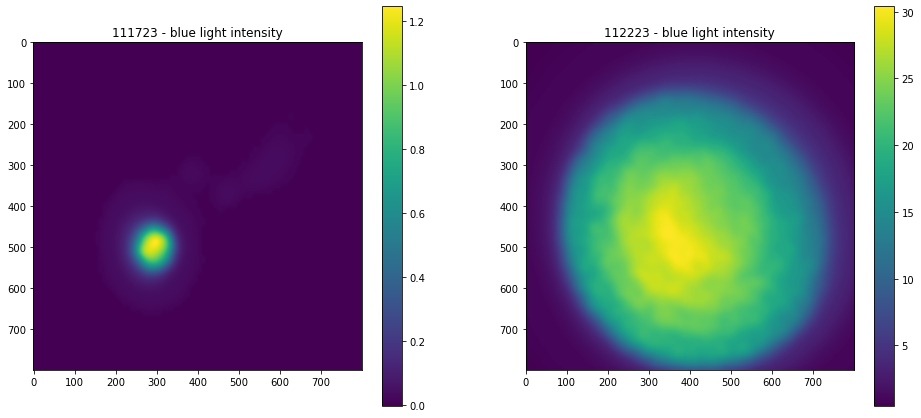

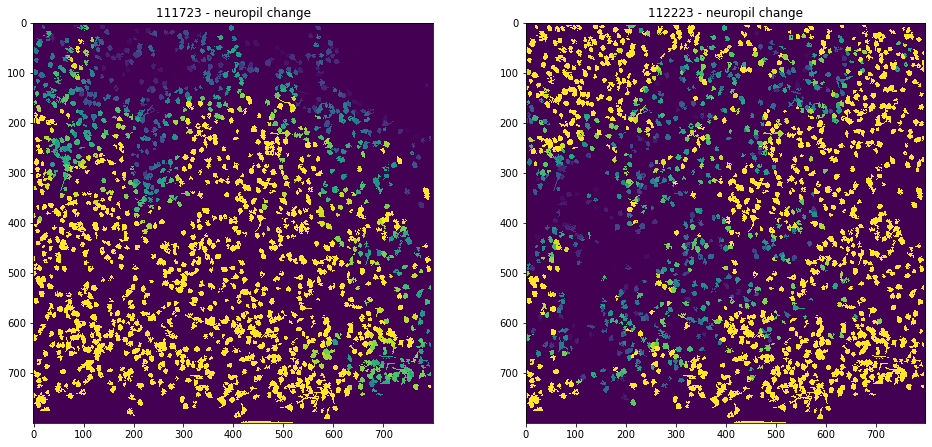

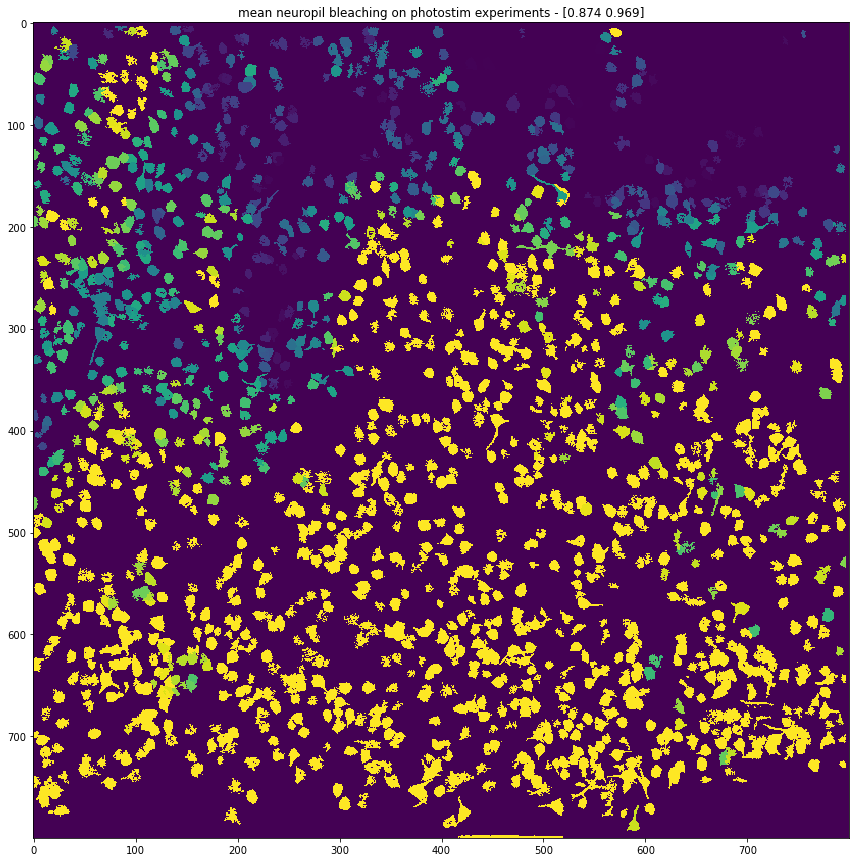

In [5]:
percentiles_to_use =  [10,50]

fig_all = plt.figure(figsize = [25,25])
for i,session_idx in enumerate(np.where(is_it_photostimmed)[0]):
    ax_2d = fig_all.add_subplot(3,3,i+1)
    im_2d = ax_2d.imshow(bleaching_2d_image_list[session_idx],interpolation = 'none')
    clim_v = np.unique(bleaching_2d_image_list[session_idx].flatten())
    clim_v = clim_v[np.isnan(clim_v)==False]
    clim = np.percentile(clim_v,percentiles_to_use)
    im_2d.set_clim(clim)
    ax_2d.set_title('{} - F0 change'.format(sessions[session_idx]))


mean_bleaching = np.nanmean(np.asarray(bleaching_2d_image_list)[np.asarray(is_it_photostimmed)],0)
fig = plt.figure(figsize = [15,15])
ax = fig.add_subplot(1,1,1)
im = ax.imshow(mean_bleaching,interpolation = 'none')
clims =np.percentile(np.unique(mean_bleaching.flatten()),percentiles_to_use)
im.set_clim(clims)
ax.set_title('mean F0 bleaching on photostim experiments - {}'.format(np.round(clims,3)))

fig_spot_position = plt.figure(figsize = [25,25])
for i,session_idx in enumerate(np.where(is_it_photostimmed)[0]):
    ax_2d = fig_spot_position.add_subplot(3,3,i+1)
    im_2d = ax_2d.imshow(data_dict[sessions[session_idx]]['blue_light_distribution']['intensity_mask'])#[::-1,:])
    ax_2d.set_title('{} - blue light intensity'.format(sessions[session_idx]))
    plt.colorbar(im_2d, ax=ax_2d) 


fig_all = plt.figure(figsize = [25,25])
for i,session_idx in enumerate(np.where(is_it_photostimmed)[0]):
    ax_2d = fig_all.add_subplot(3,3,i+1)
    im_2d = ax_2d.imshow(bleaching_2d_image_list_from_neuropil[session_idx],interpolation = 'none')
    clim_v = np.unique(bleaching_2d_image_list_from_neuropil[session_idx].flatten())
    clim_v = clim_v[np.isnan(clim_v)==False]
    clim = np.percentile(clim_v,percentiles_to_use)
    im_2d.set_clim(clim)
    ax_2d.set_title('{} - neuropil change'.format(sessions[session_idx]))
mean_bleaching = np.nanmean(np.asarray(bleaching_2d_image_list_from_neuropil)[np.asarray(is_it_photostimmed)],0)
fig = plt.figure(figsize = [15,15])
ax = fig.add_subplot(1,1,1)
im = ax.imshow(mean_bleaching,interpolation = 'none')
clims =np.percentile(np.unique(mean_bleaching.flatten()),percentiles_to_use)
im.set_clim(clims)
ax.set_title('mean neuropil bleaching on photostim experiments - {}'.format(np.round(clims,3)))



In [61]:
data_dict[sessions[4]]['paAIP2_expression'].keys()

dict_keys(['red_intensity_normalized', 'red_intensity_raw', 'green_intensity_raw', 'green_intensity_activity_corrected'])

In [62]:
cell_idx = 23

data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_raw'][cell_idx]/data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_activity_corrected'][cell_idx]

1.0910189

Text(0.5, 0, 'red/green')

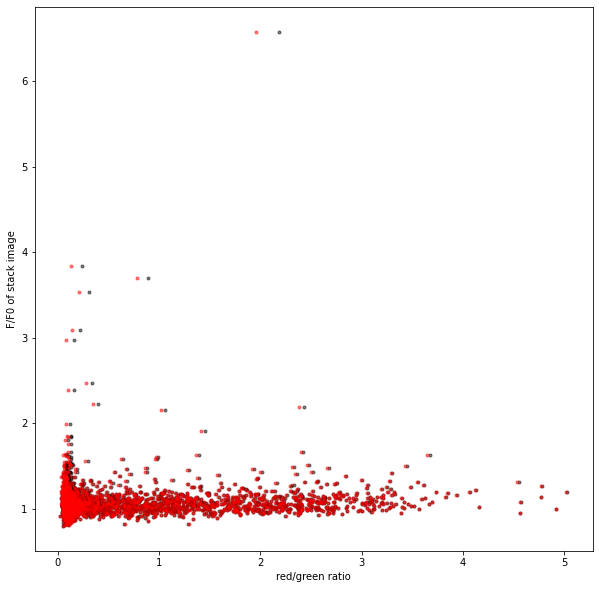

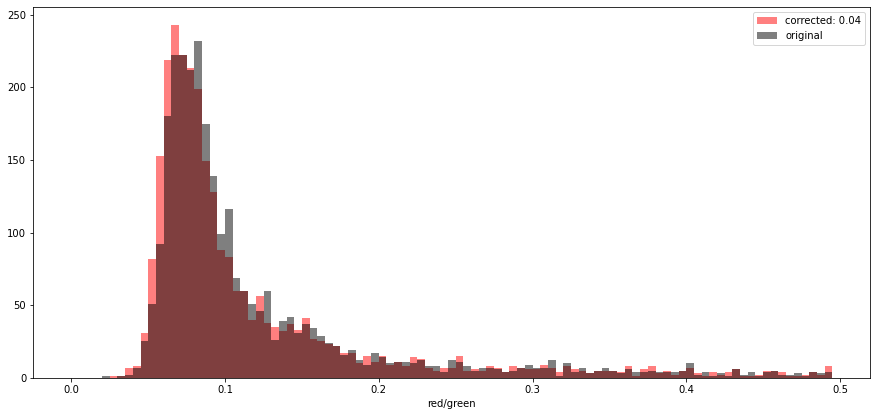

In [8]:
#try to correct for activity-dependent increases in the red channel
all_red_ratios = []
corrected_red_ratios = []
fig = plt.figure(figsize = [10,10])
correction_val = .04
flip_vertically_blue_light_image = True
for session_num,session in enumerate(sessions):
# session_num = 3
# session = sessions[session_num]
    needed = data_dict[session]['paAIP2_expression']['red_intensity_normalized']<222.2
    F = data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_raw']
    F0 = data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_activity_corrected']
    correction = correction_val*(F-F0)/F0
    plt.plot(data_dict[session]['paAIP2_expression']['red_intensity_normalized'][needed],
             data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_raw'][needed]/data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_activity_corrected'][needed],
             'k.',
             alpha = .5)
    plt.plot(data_dict[session]['paAIP2_expression']['red_intensity_normalized'][needed]-correction[needed],
             data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_raw'][needed]/data_dict[sessions[session_num]]['paAIP2_expression']['green_intensity_activity_corrected'][needed],
             'r.',
             alpha = .5)
    corrected_red_ratios.append(data_dict[session]['paAIP2_expression']['red_intensity_normalized'][needed]-correction[needed])
    all_red_ratios.append(data_dict[session]['paAIP2_expression']['red_intensity_normalized'][needed])
plt.xlabel('red/green ratio')
plt.ylabel('F/F0 of stack image')
# plt.yscale('log')
# plt.xscale('log')
# plt.xlim([0.06,.15])
# plt.ylim([.8,1.5])

fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,1,1)
ax1.hist(np.concatenate(corrected_red_ratios).flatten(),np.arange(0,.5,.005),color = 'red',alpha = .5,label = 'corrected: {}'.format(correction_val))
#ax2 = fig.add_subplot(2,1,2)
ax1.hist(np.concatenate(all_red_ratios).flatten(),np.arange(0,.5,.005),color = 'black',alpha = .5,label = 'original')
plt.legend()
ax1.set_xlabel('red/green')

Text(0.5, 0, 'red channel ratio')

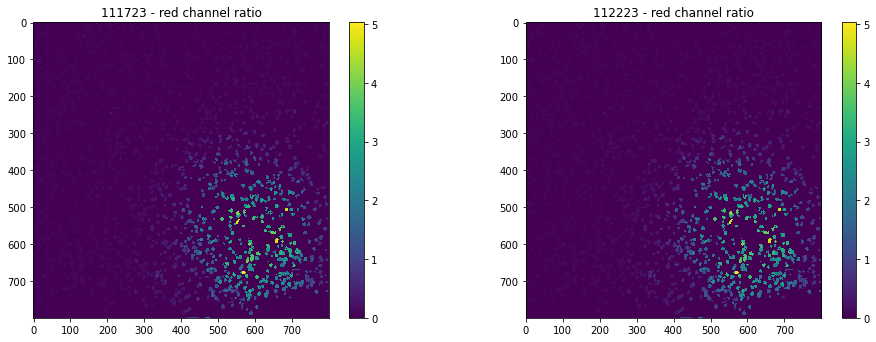

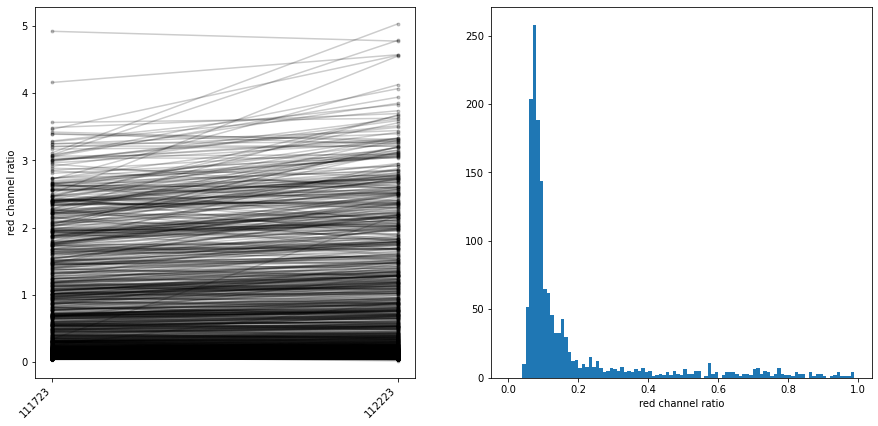

In [15]:
fig_all = plt.figure(figsize = [25,25])
expression_vals = []
for i,session_idx in enumerate(range(len(sessions))):
    ax_2d = fig_all.add_subplot(4,3,i+1)
    red_ch_ratio_now = np.zeros(data_dict[session]['mean_image'].shape)
    for s,ratio in zip(stat,data_dict[session]['paAIP2_expression']['red_intensity_normalized']):#blue_light_dose):#
        red_ch_ratio_now[s['ypix'][s['soma_crop']],s['xpix'][s['soma_crop']]] = ratio
    
    im_2d = ax_2d.imshow(red_ch_ratio_now,interpolation = 'none')
    
    # clim_v = np.unique(red_ch_ratio_now[session_idx].flatten())
    # clim_v = clim_v[np.isnan(clim_v)==False]
    # clim = np.percentile(clim_v,percentiles_to_use)
    # im_2d.set_clim(clim)
    fig_all.colorbar(im_2d, ax=ax_2d,location = 'right')

    ax_2d.set_title('{} - red channel ratio'.format(sessions[session_idx]))
    
    
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
expression_vals = []
for session in sessions:
    expression_vals.append(data_dict[session]['paAIP2_expression']['red_intensity_normalized']) #data_dict[session]['paAIP2_expression']['green_intensity_raw']/data_dict[session]['paAIP2_expression']['red_intensity_raw'])#
expression_vals = np.asarray(expression_vals)
ax1.plot(sessions,expression_vals,'k.-',alpha = .2)
ax1.set_ylabel('red channel ratio')
plt.xticks(rotation=45, ha='right')
ax2 = fig.add_subplot(2,2,2)
ax2.hist(np.nanmean(expression_vals,0),np.arange(0,1,.01))
ax2.set_xlabel('red channel ratio')




In [9]:
# bleaching from the movie 
frames_before = 10
frames_after = 10

BinaryFile = suite2p.io.BinaryFile
session = '101923'
#s2p_base_dir,subject,fov,session
session_dir = os.path.join(s2p_base_dir,subject,fov,session)
photostim_indices = np.isnan(data_dict[session]['F_sessionwise'][0])
photostim_starts = np.where(np.diff(np.asarray(photostim_indices,float))==1)[0]
photostim_ends = np.where(np.diff(np.asarray(photostim_indices,float))==-1)[0]

ops =  np.load(os.path.join(session_dir,'ops.npy'),allow_pickle = True).tolist()
binaryfile = os.path.join(session_dir,'data.bin')

diff_list = []
for s,e in zip(photostim_starts,photostim_ends):
    frames_needed = np.concatenate([np.arange(frames_before)-frames_before+s-1,np.arange(frames_after)+e+1+1])

    with BinaryFile(Ly=ops['Ly'], Lx=ops['Lx'], read_filename=binaryfile) as f:   
        frames  =f.ix(frames_needed)  
    mean_pre = np.nanmean(frames[:frames_before,:,:],0).squeeze()
    mean_post = np.nanmean(frames[frames_before:,:,:],0).squeeze()
    diff_list.append((mean_post-mean_pre))
    
    


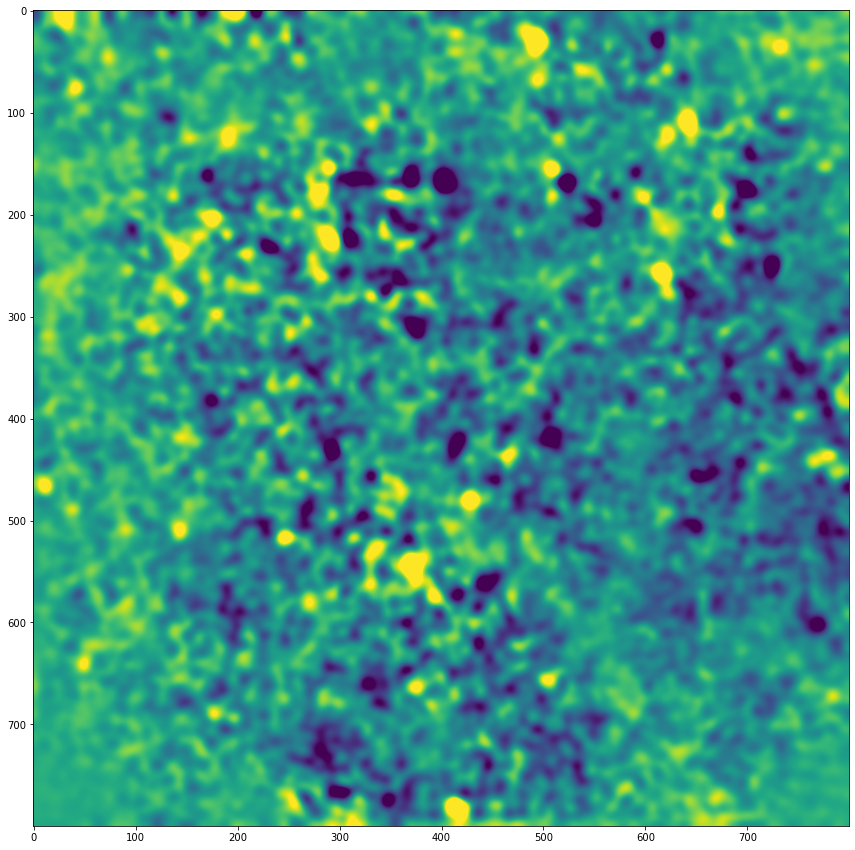

In [10]:
import scipy
mean_diff = np.nanmean(np.asarray(diff_list),0).squeeze()
mean_diff_f = scipy.ndimage.gaussian_filter(mean_diff,5)
fig = plt.figure(figsize = [15,15])
im = plt.imshow(mean_diff_f)
im.set_clim(np.percentile(mean_diff_f.flatten(),[1,99]))

(array([1.156e+03, 2.200e+01, 1.200e+01, 6.000e+00, 2.000e+00, 3.000e+00,
        4.000e+00, 3.000e+00, 4.000e+00, 3.000e+00, 0.000e+00, 1.000e+00,
        2.000e+00, 2.000e+00, 0.000e+00, 2.000e+00, 0.000e+00, 3.000e+00,
        0.000e+00, 0.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 2.000e+00,
        1.000e+00, 1.000e+00, 2.000e+00, 1.000e+00, 0.000e+00, 1.000e+00,
        5.000e+00, 2.000e+00, 1.000e+00, 2.000e+00, 1.000e+00, 1.000e+00,
        2.000e+00, 1.000e+00, 2.000e+00, 1.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([-0.00412537,  0.06112193,  0.12636923,  0.19161653,  0.25686382,
         0.32211112,  0.38735842,  0.45260572,  0.51785301,  0.58310031,
         0.64834761,  0.71359491,  0.7788422 ,  0.8440895 ,  0.9093368 ,
         0.9745841 ,  1.03983139,  1.10507869,  1.17032599,  1.23557329,
         1.30082058,  1.36606788,  1.43131518,  1.49656248,  1.56180977,
         1.

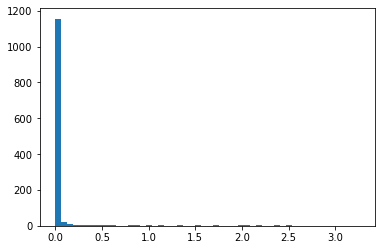

In [47]:
plt.hist(blue_light_dose,50)

In [97]:
session
    
    

'103123'

In [ ]:
plt.imshow(mask)

()

/tmp/ipykernel_28998/185415968.py:6: RuntimeWarning: Mean of empty slice
  mean_dff_trace_during_stim = np.nanmean(dff_during_stim[included_cells,:],0)
/tmp/ipykernel_28998/185415968.py:8: RuntimeWarning: Mean of empty slice
  mean_dff_trace_after_stim = np.nanmean(dff_after_stim[included_cells,:],0)


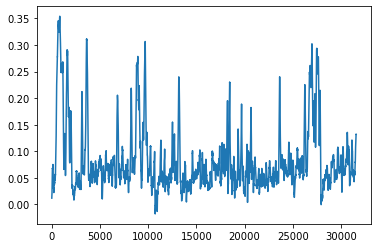

In [87]:
rollingwin = 100

fig = plt.figure()
mean_dff_trace_before_stim = np.nanmean(dff_before_stim[included_cells,:],0)
mean_dff_trace_before_stim = BCI_analysis.plot_utils.rollingfun(mean_dff_trace_before_stim,rollingwin)
mean_dff_trace_during_stim = np.nanmean(dff_during_stim[included_cells,:],0)
mean_dff_trace_during_stim = BCI_analysis.plot_utils.rollingfun(mean_dff_trace_during_stim,rollingwin)
mean_dff_trace_after_stim = np.nanmean(dff_after_stim[included_cells,:],0)
mean_dff_trace_after_stim = BCI_analysis.plot_utils.rollingfun(mean_dff_trace_after_stim,rollingwin)
plt.plot(np.concatenate([mean_dff_trace_before_stim,mean_dff_trace_during_stim,mean_dff_trace_after_stim]))

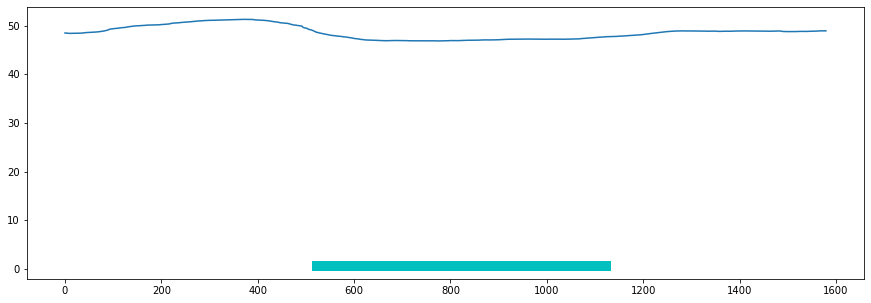

In [113]:
rollingwin = 50

fig = plt.figure(figsize =[ 15,5])
ax1 = fig.add_subplot(1,1,1)
mean_dff_trace_before_stim = np.nanmean(dff_before_stim[included_cells,:],0)
mean_dff_trace_before_stim = BCI_analysis.plot_utils.rollingfun(mean_dff_trace_before_stim,rollingwin)
mean_dff_trace_during_stim = np.nanmean(dff_during_stim[included_cells,:],0)
mean_dff_trace_during_stim = BCI_analysis.plot_utils.rollingfun(mean_dff_trace_during_stim,rollingwin)
mean_dff_trace_after_stim = np.nanmean(dff_after_stim[included_cells,:],0)
mean_dff_trace_after_stim = BCI_analysis.plot_utils.rollingfun(mean_dff_trace_after_stim,rollingwin)
y = np.concatenate([mean_dff_trace_before_stim,mean_dff_trace_during_stim,mean_dff_trace_after_stim])
x = np.arange(len(y))/20
stim_start = len(mean_dff_trace_before_stim)/20
stim_end = len(mean_dff_trace_before_stim)/20+ len(mean_dff_trace_during_stim)/20
ax1.plot(x,y)
ax1.plot([stim_start,stim_end],[0.5,0.5],'c-',linewidth = 10)

In [133]:
hue_range_

(-0.10683012604713438, 0.10683012604713438)

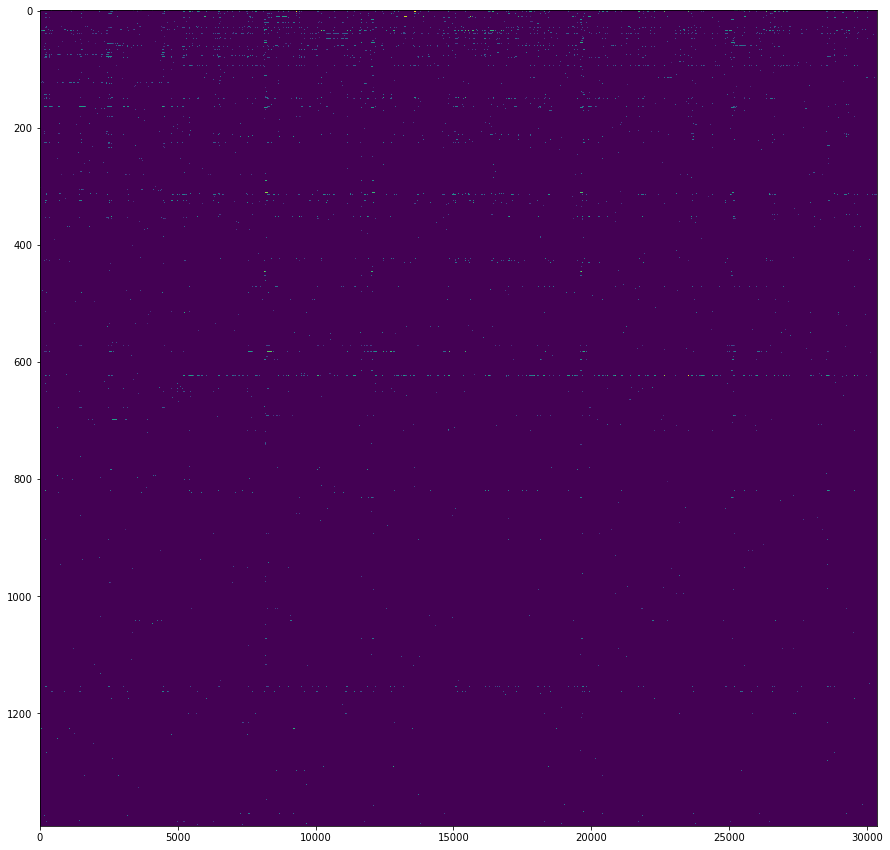

In [142]:
plt.figure(figsize = [15,15])
plt.imshow(data_dict[session]['events_clean'],aspect = 'auto',interpolation = 'none')

0

111723 - [304.76190476190476, 507.0422535211268]
use the stim file to excise stuff


/tmp/ipykernel_12761/2251259405.py:94: RuntimeWarning: Mean of empty slice
  mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_blue_light:end_of_ctrl_after],0)
/home/jupyter/Scripts/BCI_analysis/BCI_analysis/plot/plot_utils.py:32: RuntimeWarning: Mean of empty slice
  out = np.nanmean(ys,0)[window:-window]


112223 - [362.66666666666663, 488.8888888888889]
use the stim file to excise stuff


/tmp/ipykernel_12761/2251259405.py:94: RuntimeWarning: Mean of empty slice
  mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_blue_light:end_of_ctrl_after],0)
/home/jupyter/Scripts/BCI_analysis/BCI_analysis/plot/plot_utils.py:32: RuntimeWarning: Mean of empty slice
  out = np.nanmean(ys,0)[window:-window]


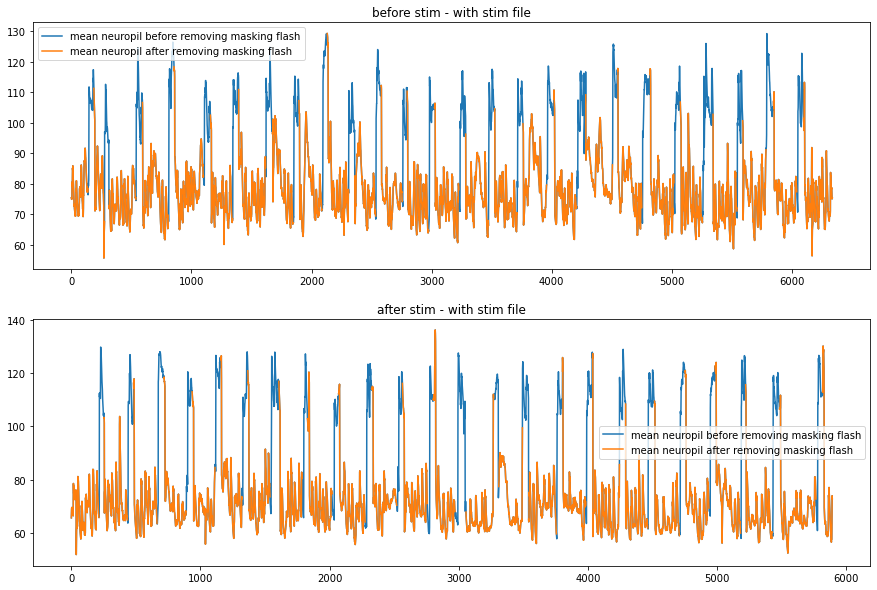

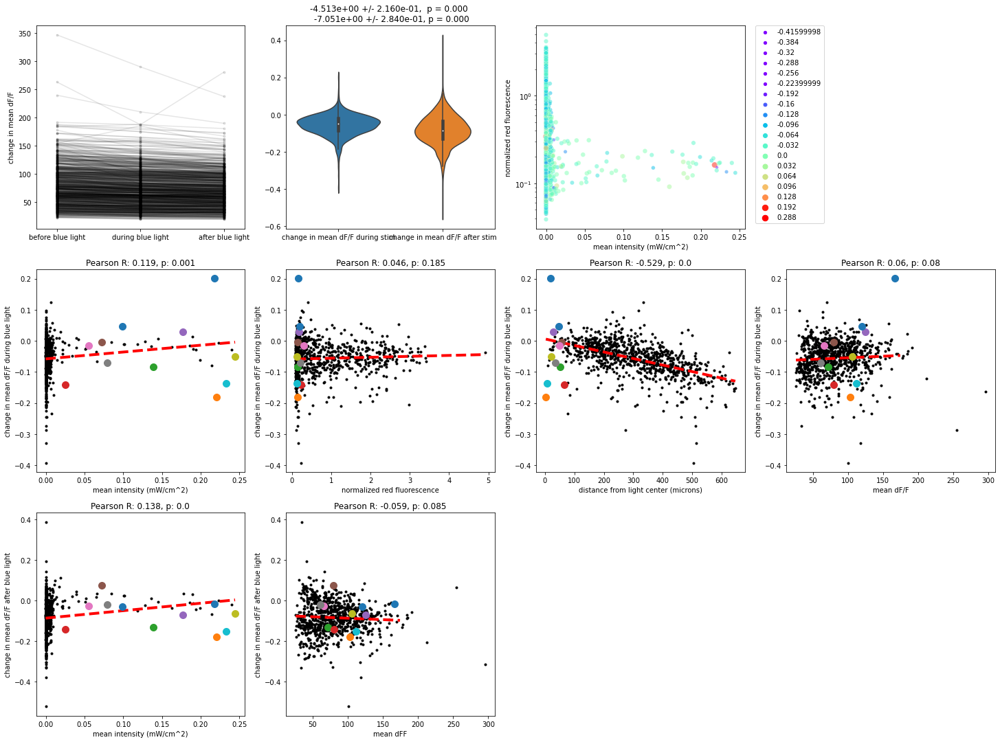

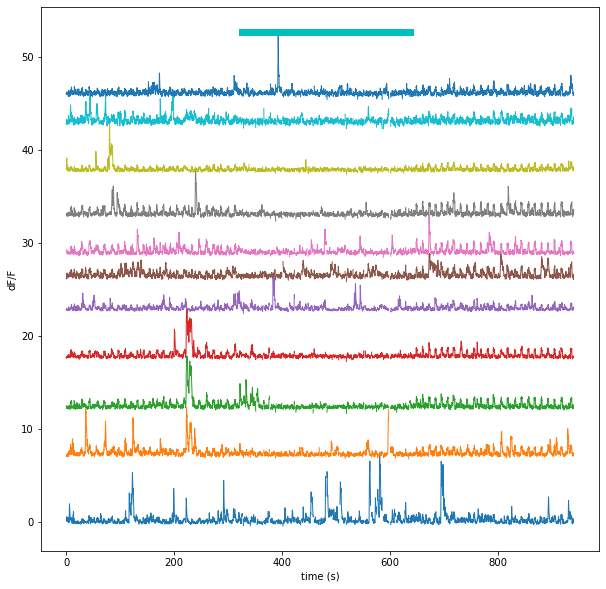

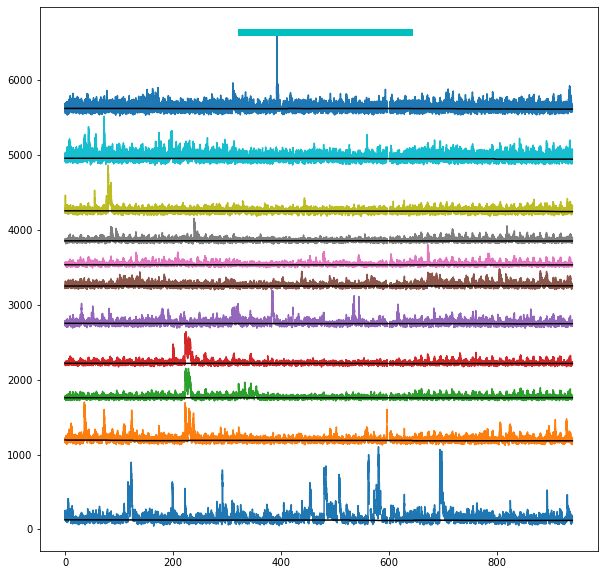

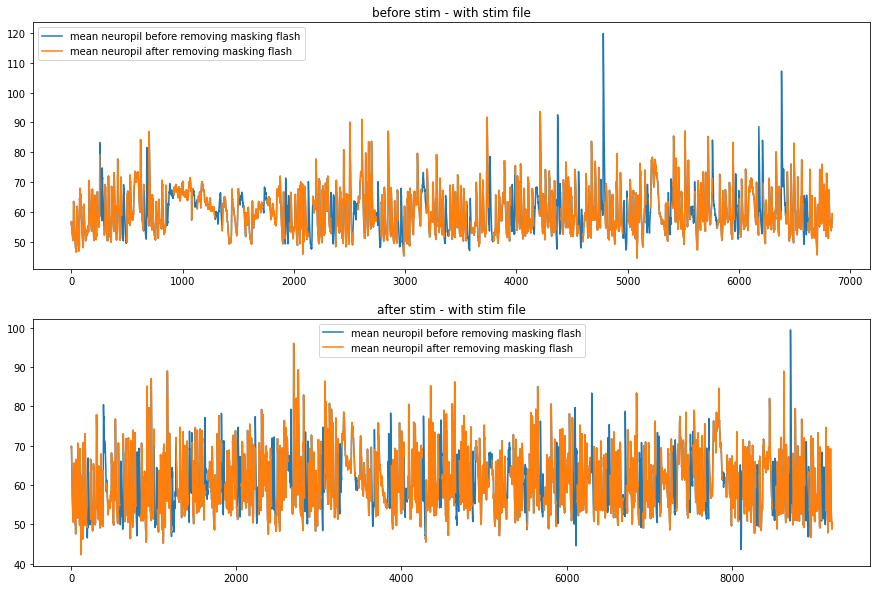

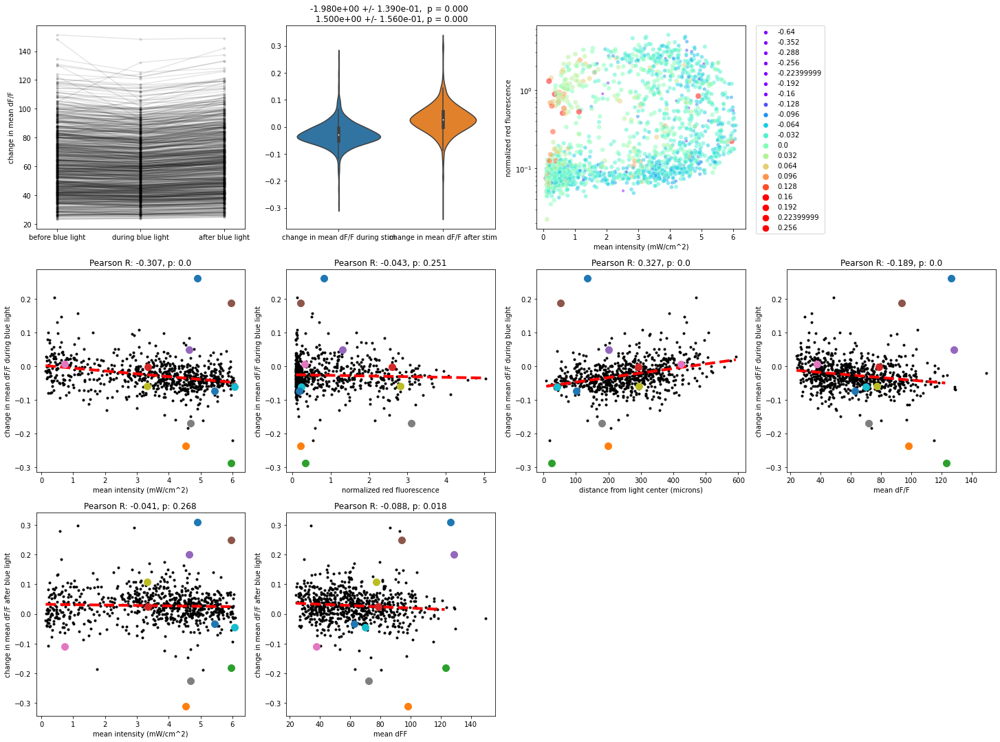

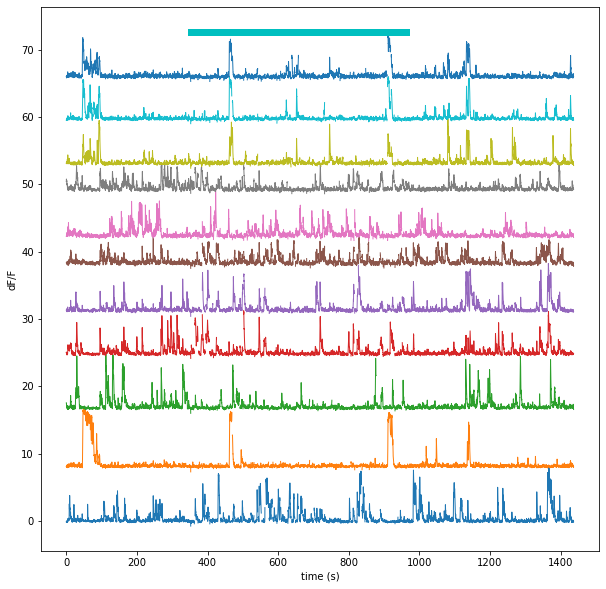

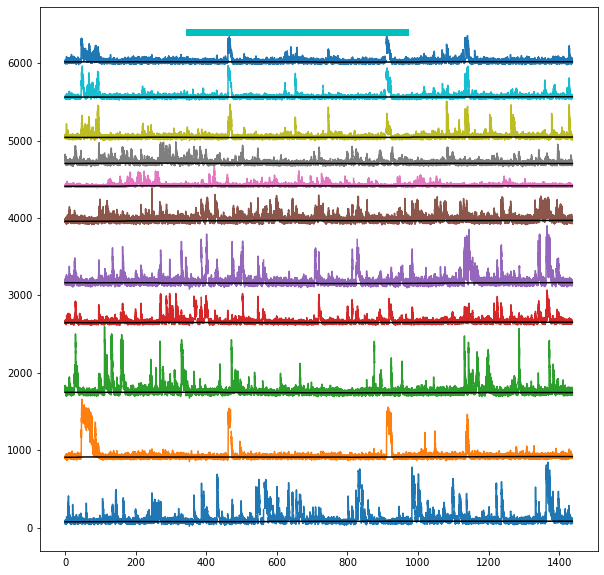

In [42]:
# look at how activity changes in ctrl sessions

# control for activity changes during spontaneous
import scipy
import seaborn as sns
import pandas as pd



file_start_threshold = -10#2.5
masking_flash_threshold = 2
masking_flash_length = 40
dff_to_use = 'F_sessionwise'#'dff_sessionwise'
label_of_trace = dff_to_use[:dff_to_use.find('_')]
function_to_use = 'mean' #'std' 'mean'
diff_function = 'divide'#'subtract'#'divide' 
remove_masking_flash_activity = True
minimum_f0 = 20
minimum_red_expression = 0.1
maximum_red_expression = 55.1
minimum_blue_intensity = -1
needed_example_cells = 10

flip_blue_light_distribution = False # AP direction might be incorrect???

plot_i = 0
duty_cycle = .2
for session_idx in np.where(is_it_photostimmed)[0]:
    session = sessions[session_idx]
    paAIP_expression = data_dict[session]['paAIP2_expression']['red_intensity_normalized']
    
    blue_light_distribution = data_dict[session]['blue_light_distribution']['intensity_mask'].copy()
    if flip_blue_light_distribution:
        blue_light_distribution = blue_light_distribution[::-1,:]
    if np.sum(blue_light_distribution)<.01:
        continue
    blue_light_dose = []
    
    distance_from_light_center = []
    #mask = np.zeros([800,800])
    print('{} - {}'.format(session, data_dict[session]['blue_light_distribution']['center_xy']))
    for s in stat:
        blue_light_dose.append(np.nanmean(blue_light_distribution[s['ypix'][s['soma_crop']],s['xpix'][s['soma_crop']]]))
        blue_light_center = np.asarray(data_dict[session]['blue_light_distribution']['center_xy'])
        if flip_blue_light_distribution:
            blue_light_center[1] = 800 - blue_light_center[1]
        blue_light_center = blue_light_center[::-1]
        distance_from_light_center.append(np.sqrt(sum((blue_light_center-np.asarray(s['med']))**2)))
        #mask[s['ypix'][s['soma_crop']],s['xpix'][s['soma_crop']]] = blue_light_dose[-1]
    blue_light_dose_orig = np.asarray(blue_light_dose)
    distance_from_light_center = np.asarray(distance_from_light_center)
    
    end_of_exp_idx = np.sum(np.asarray(data_dict[session]['all_si_frame_nums'])[:np.where(np.asarray(data_dict[session]['all_si_filenames']) == data_dict[session]['closed_loop_filenames'][-1])[0][0]])

    photostim_start_indices = np.sort(np.where(np.diff((np.isnan(data_dict[session]['F_sessionwise'][0,end_of_exp_idx:]))))[0] +end_of_exp_idx)
    photostim_epoch_starts = np.sort(photostim_start_indices[np.where(np.diff(np.concatenate([[0],photostim_start_indices]))>5*60*20)[0]])
    photostim_epoch_ends = np.sort(photostim_start_indices[np.where(np.diff(np.concatenate([[0],photostim_start_indices]))>5*60*20)[0]-1])
    
    for epoch_i in range(len(photostim_epoch_starts)):
        start_of_ctrl_before = np.concatenate([[end_of_exp_idx],photostim_epoch_ends])[epoch_i]
        start_of_blue_light = photostim_epoch_starts[epoch_i]
        end_of_blue_light = photostim_epoch_ends[epoch_i] 
        end_of_ctrl_after = np.concatenate([photostim_epoch_starts[1:],[data_dict[session]['F_sessionwise'].shape[1]-1]])[epoch_i]
        mean_dff_before_stim = np.nanmean(data_dict[session][dff_to_use][:,start_of_ctrl_before:start_of_blue_light],1) #
        dff_before_stim = data_dict[session][dff_to_use][:,start_of_ctrl_before:start_of_blue_light]#
        dff_after_stim = data_dict[session][dff_to_use][:,end_of_blue_light:end_of_ctrl_after]
        
        
        duty_cycle_now = duty_cycle
        if type(data_dict[session]['stim_data'])== dict:
            if sum(np.diff(data_dict[session]['stim_data']['blue_light'])) <1000:
                duty_cycle_now = np.nanmean(data_dict[session]['stim_data']['blue_light'][start_of_blue_light:end_of_blue_light])
        blue_light_dose = blue_light_dose_orig*duty_cycle_now
                


        # remove file start artefacts & light artefacts


        if remove_masking_flash_activity:
            if type(data_dict[session]['stim_data'])== dict:
                if sum(np.diff(data_dict[session]['stim_data']['blue_light'])) <1000:
                    print('use the stim file to excise stuff')
                    data_dict[session]['stim_data']['blue_light']
                    
                    fig = plt.figure(figsize = [15,10])
                    for condition_now in ['before','after']:
                        if condition_now =='before':
                            dff_before_stim = data_dict[session][dff_to_use][:,start_of_ctrl_before:start_of_blue_light].copy()#
                            mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,start_of_ctrl_before:start_of_blue_light],0)
                            nan_indices = data_dict[session]['stim_data']['blue_light'][start_of_ctrl_before:start_of_blue_light].copy()>0#
                        else:
                            dff_after_stim = data_dict[session][dff_to_use][:,end_of_blue_light:end_of_ctrl_after].copy()#
                            mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_blue_light:end_of_ctrl_after],0)
                            nan_indices = data_dict[session]['stim_data']['blue_light'][end_of_blue_light:end_of_ctrl_after].copy()>0#
                        

                        if condition_now =='before':
                            dff_before_stim[:,nan_indices]=np.nan
                            ax1=fig.add_subplot(2,1,1)
                            ax1.set_title('before stim - with stim file')
                        else:
                            dff_after_stim[:,nan_indices]=np.nan
                            ax1=fig.add_subplot(2,1,2)
                            ax1.set_title('after stim - with stim file')
                        ax1.plot(mean_f0_trace,label = 'mean neuropil before removing masking flash')
                        mean_f0_trace[nan_indices] = np.nan
                        ax1.plot(mean_f0_trace,label = 'mean neuropil after removing masking flash')
                        ax1.legend()
                        
            else:    
                fig = plt.figure(figsize = [15,10])
                for condition_now in ['before','after']:
                    if condition_now =='before':
                        dff_before_stim = data_dict[session][dff_to_use][:,start_of_ctrl_before:start_of_blue_light].copy()#
                        mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,start_of_ctrl_before:start_of_blue_light],0)
                    else:
                        dff_after_stim = data_dict[session][dff_to_use][:,end_of_blue_light:end_of_ctrl_after].copy()#
                        mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_blue_light:end_of_ctrl_after],0)
                    d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,1))
                    tonan_start =  np.where(d_mean_f0_trace<file_start_threshold)[0] # hand_tuned
                    nan_indices=[]
                    for s in tonan_start:
                        nan_indices.append(np.arange(5)+s)
                    nan_indices = np.concatenate(nan_indices)
                    mean_f0_trace[nan_indices] = np.nan    
                    #d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,2))
                    nan_indices = []
                    tonan_start =  np.where(np.diff(mean_f0_trace)>masking_flash_threshold)[0] # hand_tuned
                    for s in tonan_start:
                        nan_indices.append(np.arange(masking_flash_length)+s)
                    nan_indices = np.concatenate(nan_indices)
                    #mean_f0_trace[nan_indices] = np.nan
                    #plt.plot(mean_f0_trace)
                    nan_indices = nan_indices[nan_indices<len(mean_f0_trace)]

                    if condition_now =='before':
                        dff_before_stim[:,nan_indices]=np.nan
                        ax1=fig.add_subplot(2,1,1)
                        ax1.set_title('before stim')
                    else:
                        dff_after_stim[:,nan_indices]=np.nan
                        ax1=fig.add_subplot(2,1,2)
                        ax1.set_title('after stim')
                    ax1.plot(mean_f0_trace,label = 'mean neuropil before removing masking flash')
                    mean_f0_trace[nan_indices] = np.nan
                    ax1.plot(mean_f0_trace,label = 'mean neuropil after removing masking flash')
                    ax1.legend()


        


        dff_during_stim = data_dict[session][dff_to_use][:,start_of_blue_light:end_of_blue_light]
        if function_to_use == 'mean':
            mean_dff_before_stim = np.nanmean(dff_before_stim,1) #
            mean_dff_after_stim = np.nanmean(dff_after_stim,1)
            mean_dff_during_stim = np.nanmean(dff_during_stim,1)
            mean_dff_overall = np.nanmean(data_dict[session][dff_to_use][:,start_of_ctrl_before:end_of_ctrl_after],1)#asasdasasaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        elif function_to_use == 'std':
            mean_dff_before_stim = np.nanstd(dff_before_stim,1) #
            mean_dff_after_stim = np.nanstd(dff_after_stim,1)
            mean_dff_during_stim = np.nanstd(dff_during_stim,1)
            mean_dff_overall = np.nanstd(data_dict[session][dff_to_use][:,start_of_ctrl_before:end_of_ctrl_after],1)#asasdasasaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        mean_above_noise_dff_overall = np.nanmean(data_dict[session]['events_clean'][:,start_of_ctrl_before:end_of_ctrl_after],1)#asasdasasaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        
        if diff_function== 'subtract':
            blue_light_effect = mean_dff_during_stim-mean_dff_before_stim
            blue_light_off_effect = mean_dff_after_stim-mean_dff_before_stim
            blue_light_on_to_off_effect = mean_dff_after_stim-mean_dff_during_stim
        elif diff_function == 'divide':
            blue_light_effect = mean_dff_during_stim/mean_dff_before_stim-1
            blue_light_off_effect = mean_dff_after_stim/mean_dff_before_stim-1
            blue_light_on_to_off_effect = mean_dff_after_stim/mean_dff_during_stim-1
        
        included_cells = (np.nanmean(data_dict[session]['F0_sessionwise'],1)>minimum_f0) & (mean_above_noise_dff_overall>0) & (paAIP_expression>minimum_red_expression) & (paAIP_expression<maximum_red_expression) & (blue_light_dose>minimum_blue_intensity)
    #
        if sum(included_cells)<10:
            print('fewer than 10 cells remaining, skipping')
            continue
        mean_f0 = np.nanmean(data_dict[session]['F0_sessionwise'][:,start_of_ctrl_before:end_of_ctrl_after],1)#asasdasasaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa

        order = np.argsort(mean_above_noise_dff_overall)[::-1]
        example_cell_indices = []
        for i in order:
            if i not in np.where(included_cells)[0]:
                continue
            if len(example_cell_indices)>needed_example_cells:
                continue
            if blue_light_dose[i]<np.max(blue_light_dose)/10:
                continue
            if paAIP_expression[i]<np.percentile(paAIP_expression,50):
                continue
            example_cell_indices.append(i)
        
        

        fig = plt.figure(figsize = [25,25])
        ax1 = fig.add_subplot(4,4,1)
        ax1.plot(['before blue light','during blue light','after blue light'],(np.concatenate([mean_dff_before_stim[:,np.newaxis],mean_dff_during_stim[:,np.newaxis],mean_dff_after_stim[:,np.newaxis]],1).T)[:,included_cells],'k.-',alpha = .1)#-mean_dff_before_stim[np.newaxis,:] - to normalize
        #ax1.set_ylim([-.1,.1])
        ax1.set_xlim([-.25,2.25])
        ax1.set_ylabel('change in mean dF/F')
        #ax1.set_title(blue_light_epoch_titles[epoch_i])
        pd_dict = {'change in mean dF/F during stim':(blue_light_effect)[included_cells],
                   'change in mean dF/F after stim': (blue_light_off_effect)[included_cells]}
        pd_df = pd.DataFrame.from_dict(pd_dict)
        p1 = scipy.stats.ttest_rel(mean_dff_before_stim[included_cells],mean_dff_during_stim[included_cells])[1]
        p2 = scipy.stats.ttest_rel(mean_dff_before_stim[included_cells],mean_dff_after_stim[included_cells])[1]
        ax4 = fig.add_subplot(4,4,2)
        sns.violinplot(data=pd_df,ax = ax4)
        #ax4.set_ylim([-.1,.1])
        mean_during = np.nanmean(mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])
        se_during = np.nanstd(mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])/np.sqrt(sum(included_cells))
        effect_size_mean = np.nanmean((mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])/mean_dff_before_stim[included_cells])
        effect_size_std = np.nanstd((mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])/mean_dff_before_stim[included_cells])
        mean_after = np.nanmean(mean_dff_after_stim[included_cells]-mean_dff_before_stim[included_cells])
        se_after = np.nanstd(mean_dff_after_stim[included_cells]-mean_dff_before_stim[included_cells])/np.sqrt(sum(included_cells))
        ax4.set_title('{:.3e} +/- {:.3e},  p = {:.3f} \n {:.3e} +/- {:.3e}, p = {:.3f}'.format(np.round(mean_during,3),
                                                                     np.round(se_during,3),
                                                                     np.round(p1,3),
                                                                     np.round(mean_after,3),
                                                                     np.round(se_after,3),
                                                                     np.round(p2,3)))
        ax_light_expression = fig.add_subplot(4,4,3)
        #ax_light_expression.plot(blue_light_dose,paAIP_expression,'k.')
        t_ = blue_light_effect
        t_ = t_[np.isnan(t_)==False]
        t_ = t_[np.isnan(t_)==False]
        hue_range_  = tuple(np.percentile(t_,[1,99]))#(-.1,.1)#
        hue_range_  = (-1*np.max(np.abs(hue_range_)),np.max(np.abs(hue_range_)))
        hue_vals = np.arange(500)
        i_ = 200
        while len(np.unique(hue_vals))>20:
            hue_vals = np.round((blue_light_effect)*i_,1)/i_
            i_ =i_/2
            #print([i_,len(np.unique(hue_vals))])
        sns.scatterplot( x=blue_light_dose, #distance_from_light_center,#
                        y=paAIP_expression, 
                        hue=hue_vals,
                        ax = ax_light_expression,
                        hue_norm = hue_range_,
                        size = hue_vals,
                        size_norm = hue_range_,
                       alpha = .5,
                        palette='rainbow',
                       legend = 'full')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
        ax_light_expression.set_xlabel('mean intensity (mW/cm^2)')
        #ax_light_expression.set_xlabel('Distance from spot center')
        ax_light_expression.set_ylabel('normalized red fluorescence')
        ax_light_expression.set_yscale('log')
        #asda







        ax2 = fig.add_subplot(4,4,5)
        x_all = blue_light_dose
        y_all = (blue_light_effect)
        x = x_all[included_cells]
        y = y_all[included_cells]
        needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
        x = x[needed]
        y = y[needed]
        try:
            r = scipy.stats.pearsonr(x,y)
        except:
            r = [np.nan,np.nan]
            
        try:
            p = np.polyfit(x,y,1)
        except:
            p = [0,0]
        ax2.plot(x,y,'k.')
        ends = np.percentile(x,[0,100])
        ax2.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
        for i in example_cell_indices:
            ax2.plot(x_all[i],y_all[i],'o',markersize = 10)
        ax2.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
        ax2.set_xlabel('mean intensity (mW/cm^2)')
        ax2.set_ylabel('change in mean dF/F during blue light')
        #ax2.set_ylim([-.3,.3])
        #ax2.set_xlim([.75,1])
        try:
            distance_steps = np.arange(0,np.max(x),np.max(x)/10)
        except:
            distance_steps = [0,1]
        mean_x_list= []
        mean_y_list =[]
        std_y_list = []

        for s,e in zip(distance_steps[:-1],distance_steps[1:]):
            needed_now = (x>s) & (x<e)
            x_now = x[needed_now]
            y_now = y[needed_now]
            mean_x_list.append(np.nanmean(x_now))
            mean_y_list.append(np.nanmean(y_now))
            std_y_list.append(np.nanstd(y_now)/np.sqrt(len(y_now)))

        
        
        ax222 = fig.add_subplot(4,4,6)
        x_all = paAIP_expression
        y_all = (blue_light_effect)
        x = x_all[included_cells]
        y = y_all[included_cells]
        needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
        x = x[needed]
        y = y[needed]
        r = scipy.stats.pearsonr(x,y)
        p = np.polyfit(x,y,1)
        ax222.plot(x,y,'k.')
        ends = np.percentile(x,[0,100])
        ax222.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
        for i in example_cell_indices:
            ax222.plot(x_all[i],y_all[i],'o',markersize = 10)
        ax222.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
        ax222.set_xlabel('normalized red fluorescence')
        ax222.set_ylabel('change in mean dF/F during blue light')
        #ax2.set_ylim([-.3,.3])
        #ax2.set_xlim([.75,1])
        

        ax2222 = fig.add_subplot(4,4,7)
        x_all = distance_from_light_center
        y_all = (blue_light_effect)
        x = x_all[included_cells]
        y = y_all[included_cells]
        needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
        x = x[needed]
        y = y[needed]
        r = scipy.stats.pearsonr(x,y)
        p = np.polyfit(x,y,1)
        ax2222.plot(x,y,'k.')
        ends = np.percentile(x,[0,100])
        ax2222.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
        for i in example_cell_indices:
            ax2222.plot(x_all[i],y_all[i],'o',markersize = 10)
        ax2222.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
        ax2222.set_xlabel('distance from light center (microns)')
        ax2222.set_ylabel('change in mean dF/F during blue light')
        #ax2.set_ylim([-.3,.3])
        #ax2.set_xlim([.75,1])


        ax22 = fig.add_subplot(4,4,8)
        x_all = mean_dff_overall
        y_all = (blue_light_effect)
        x = x_all[included_cells]
        y = y_all[included_cells]
        needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
        x = x[needed]
        y = y[needed]
        r = scipy.stats.pearsonr(x,y)
        p = np.polyfit(x,y,1)
        ax22.plot(x,y,'k.')
        ends = np.percentile(x,np.arange(0,100))
        ax22.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
        for i in example_cell_indices:
            ax22.plot(x_all[i],y_all[i],'o',markersize = 10)
        ax22.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
        ax22.set_xlabel('mean dF/F')
        ax22.set_ylabel('change in mean dF/F during blue light')
        #ax22.set_ylim([-.05,.05])
        #ax22.set_xlim([0,.2])
        #ax22.set_xscale('log')


        ax3 = fig.add_subplot(4,4,9)
        x_all = blue_light_dose
        y_all = (blue_light_off_effect)
        x = x_all[included_cells]
        y = y_all[included_cells]
        needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
        x = x[needed]
        y = y[needed]
        r = scipy.stats.pearsonr(x,y)
        try:
            p = np.polyfit(x,y,1)
        except:
            p = [0,0]
        ax3.plot(x,y,'k.')
        ends = np.percentile(x,[0,100])
        ax3.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
        for i in example_cell_indices:
            ax3.plot(x_all[i],y_all[i],'o',markersize = 10)
        ax3.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
        ax3.set_xlabel('mean intensity (mW/cm^2)')
        ax3.set_ylabel('change in mean dF/F after blue light')
        #ax3.set_ylim([-.05,.05])
        #ax3.set_xlim([.75,1])

        ax33 = fig.add_subplot(4,4,10)
        x_all = mean_dff_overall
        y_all = (blue_light_off_effect)
        x = x_all[included_cells]
        y = y_all[included_cells]
        needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
        x = x[needed]
        y = y[needed]
        r = scipy.stats.pearsonr(x,y)
        p = np.polyfit(x,y,1)
        ax33.plot(x,y,'k.')
        ends = np.percentile(x,np.arange(0,100))
        ax33.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
        for i in example_cell_indices:
            ax33.plot(x_all[i],y_all[i],'o',markersize = 10)
        ax33.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
        ax33.set_xlabel('mean dFF')
        ax33.set_ylabel('change in mean dF/F after blue light')
        #ax33.set_ylim([-.05,.05])
        #ax33.set_xlim([0,.2])
        #ax33.set_xscale('log')

        
        
        
        fig_example_trace = plt.figure(figsize = [10,10])
        ax = fig_example_trace.add_subplot(1,1,1)
        offset = 0
        t = np.arange(end_of_ctrl_after-start_of_ctrl_before)/data_dict[session]['sampling_rate']
        for i in example_cell_indices:

            y = data_dict[session]['dff_sessionwise'][i,start_of_ctrl_before:end_of_ctrl_after]#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
            y = BCI_analysis.plot_utils.rollingfun(y,10)
            ax.plot(t,y+offset,linewidth = 1)
            offset+=np.nanmax(y)

        photostim_indices = np.isnan(data_dict[session]['F_sessionwise'][0,start_of_ctrl_before:end_of_ctrl_after])#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        ax.plot(t[photostim_indices],offset*np.ones(sum(photostim_indices)),'cs',linewidth = 6)
        ax.set_xlabel('time (s)')
        ax.set_ylabel('dF/F')


        fig_example_trace = plt.figure(figsize = [10,10])
        ax = fig_example_trace.add_subplot(1,1,1)
        offset = 0
        #t = np.arange(data_dict[session]['dff_sessionwise'].shape[1]-start_of_ctrl_before)/data_dict[session]['sampling_rate']
        for i in example_cell_indices:
            y = data_dict[session]['F_sessionwise'][i,start_of_ctrl_before:end_of_ctrl_after]#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
            y0 = data_dict[session]['F0_sessionwise'][i,start_of_ctrl_before:end_of_ctrl_after]#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
            ax.plot(t,y+offset)
            ax.plot(t,y0+offset,'k-')

            offset+=np.nanmax(y)

        photostim_indices = np.isnan(data_dict[session]['F_sessionwise'][0,start_of_ctrl_before:end_of_ctrl_after])#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        ax.plot(t[photostim_indices],offset*np.ones(sum(photostim_indices)),'cs',linewidth = 6)

        # im = plt.imshow(data_dict[session]['events_clean'],aspect ='auto',interpolation = 'none')
        # im.set_clim([-1,5])
        # plt.xlim([end_of_exp_idx,data_dict[session]['dff_sessionwise'].shape[1]])



In [76]:


mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_exp_idx:start_of_blue_light],0)
d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,1))
tonan_start =  np.where(d_mean_f0_trace<-10)[0] # hand_tuned
nan_indices=[]
for s in tonan_start:
    nan_indices.append(np.arange(5)+s)
nan_indices = np.concatenate(nan_indices)
mean_f0_trace[nan_indices] = np.nan    
d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,2))

plt.plot(d_mean_f0_trace)
#plt.xlim([0,2000])

ValueError: need at least one array to concatenate

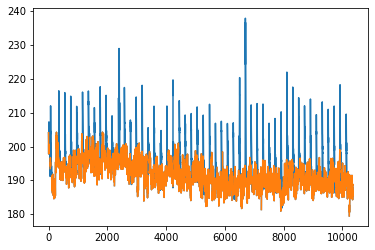

In [101]:
mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_exp_idx:start_of_blue_light],0)

dff_before_stim = data_dict[session][dff_to_use][:,end_of_exp_idx:start_of_blue_light]#

mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_exp_idx:start_of_blue_light],0)
d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,1))
tonan_start =  np.where(d_mean_f0_trace<-20)[0] # hand_tuned
nan_indices=[]
for s in tonan_start:
    nan_indices.append(np.arange(5)+s)
nan_indices = np.concatenate(nan_indices)
mean_f0_trace[nan_indices] = np.nan    
#d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,2))


nan_indices = []
tonan_start =  np.where(np.diff(mean_f0_trace)>7)[0] # hand_tuned
for s in tonan_start:
    nan_indices.append(np.arange(40)+s)
nan_indices = np.concatenate(nan_indices)
#mean_f0_trace[nan_indices] = np.nan
#plt.plot(mean_f0_trace)
nan_indices = nan_indices[nan_indices<len(mean_f0_trace)]
dff_before_stim[:,nan_indices]=np.nan


plt.plot(mean_f0_trace)
mean_f0_trace[nan_indices] = np.nan
plt.plot(mean_f0_trace)
#plt.xlim([2000,5000])

/tmp/ipykernel_3217/3214128741.py:2: RuntimeWarning: Mean of empty slice
  plt.plot(np.nanmean(data_dict[session]['dff_sessionwise'],0))
/tmp/ipykernel_3217/3214128741.py:3: RuntimeWarning: Mean of empty slice
  plt.plot(np.nanmean(data_dict[session]['F_sessionwise'],0))


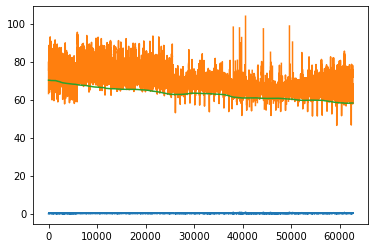

In [10]:
fig = plt.figure()
plt.plot(np.nanmean(data_dict[session]['dff_sessionwise'],0))
plt.plot(np.nanmean(data_dict[session]['F_sessionwise'],0))
plt.plot(np.nanmean(data_dict[session]['F0_sessionwise'],0))

In [11]:
mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_blue_light:end_of_ctrl_after],0)
d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,1))
fig = plt.figure()
ax1=fig.add_subplot(1,1,1)
ax2 =ax1.twinx()

ax1.plot(d_mean_f0_trace,'k-')
ax2.plot(data_dict[session]['dff_sessionwise'][5,end_of_blue_light:end_of_ctrl_after],'g-')
ylims = list(ax2.get_ylim())
ylims[0] = ylims[0]-np.diff(ylims)[0]
ax2.set_ylim(ylims)
ax1.set_xlim([2000,3000])

NameError: name 'end_of_blue_light' is not defined

/tmp/ipykernel_11842/624653377.py:4: RuntimeWarning: Mean of empty slice
  plt.plot(BCI_analysis.plot_utils.rollingfun(np.nanmean(dff_during_stim[included_cells,:],0),1000))#-mean_dff_before_stim[included_cells,np.newaxis]


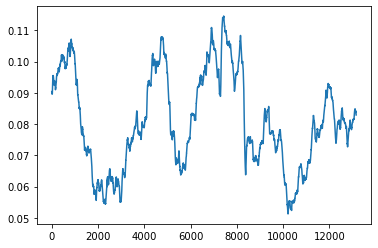

In [112]:
mean_dff_before_stim.shape

(678,)

/tmp/ipykernel_11842/3902043293.py:10: RuntimeWarning: Mean of empty slice
  ax2.plot(BCI_analysis.plot_utils.rollingfun(np.nanmean(dff_during_stim[included_cells,:]-mean_dff_before_stim[included_cells,np.newaxis],0),1000))#
/tmp/ipykernel_11842/3902043293.py:12: RuntimeWarning: Mean of empty slice
  ax3.plot(BCI_analysis.plot_utils.rollingfun(np.nanmean(dff_after_stim[included_cells,:]-mean_dff_before_stim[included_cells,np.newaxis],0),1000))#


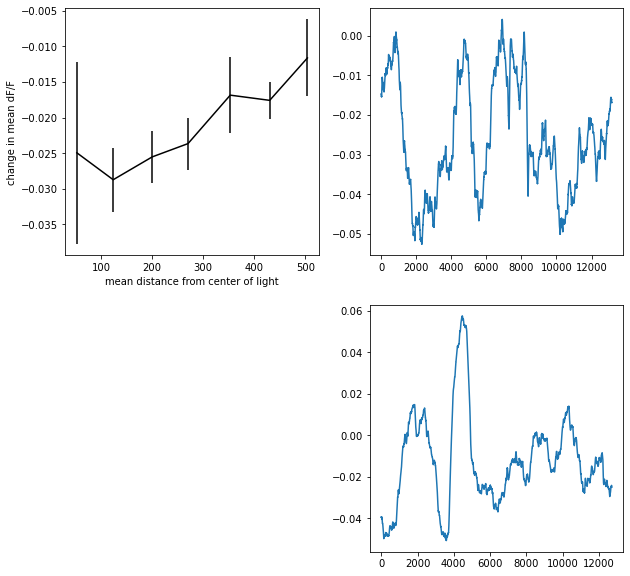

In [142]:
fig = plt.figure(figsize = [10,10])
ax1 = fig.add_subplot(2,2,1)
ax1.errorbar(mean_x_list,mean_y_list,std_y_list,color = 'black')
ax1.set_xlabel('mean distance from center of light')
ax1.set_ylabel('change in mean dF/F')

included_cells = (np.nanmean(data_dict[session]['F0_sessionwise'],1)>minimum_f0) & (mean_above_noise_dff_overall>0) & (neuron_distance_list<300)

ax2  = fig.add_subplot(2,2,2)
ax2.plot(BCI_analysis.plot_utils.rollingfun(np.nanmean(dff_during_stim[included_cells,:]-mean_dff_before_stim[included_cells,np.newaxis],0),1000))#
ax3  = fig.add_subplot(2,2,4)
ax3.plot(BCI_analysis.plot_utils.rollingfun(np.nanmean(dff_after_stim[included_cells,:]-mean_dff_before_stim[included_cells,np.newaxis],0),1000))#

#plt.ylim([-.2,.2])
#dff_during_stim

/home/jupyter/Scripts/BCI_analysis/BCI_analysis/plot/plot_utils.py:32: RuntimeWarning: Mean of empty slice
  out = np.nanmean(ys,0)[window:-window]


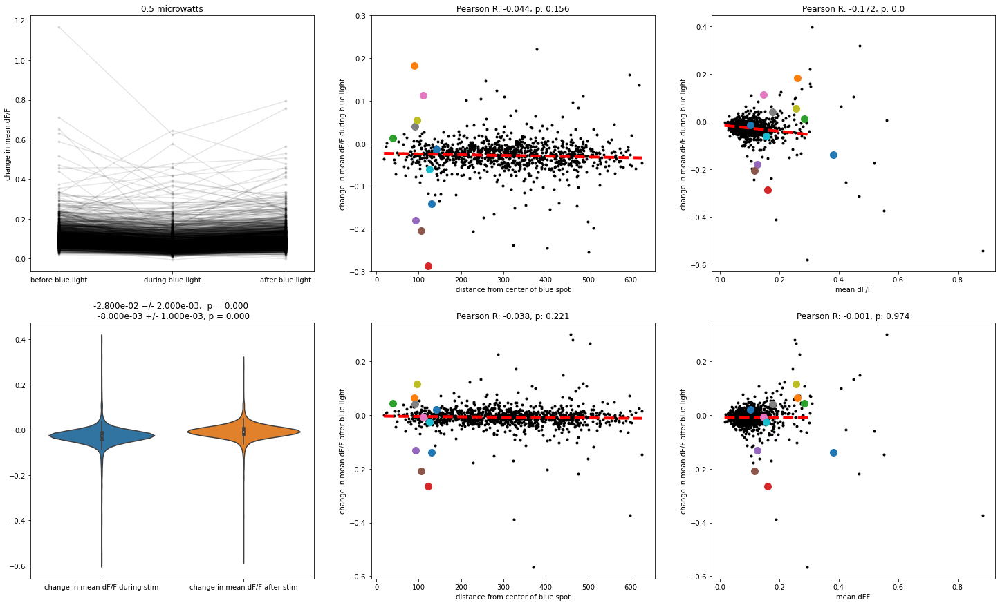

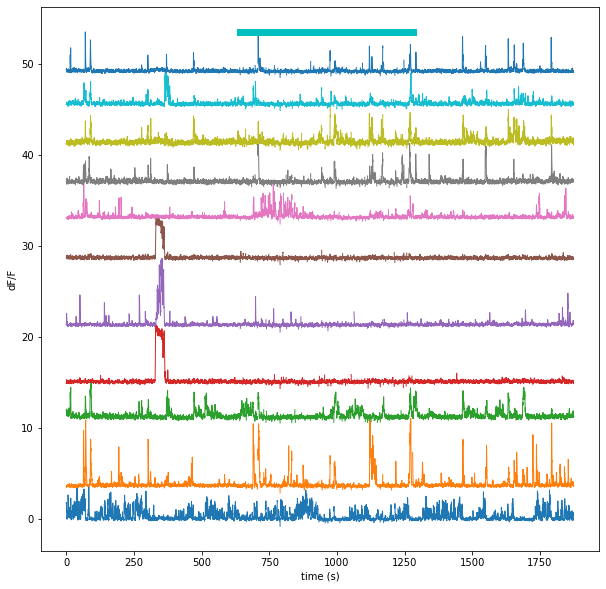

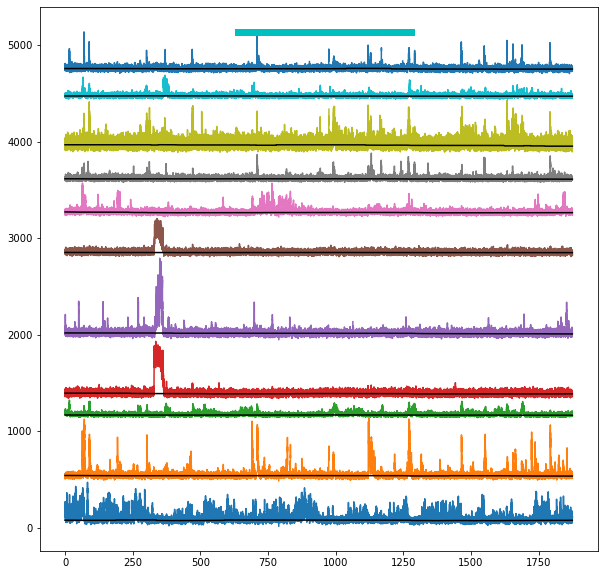

In [ ]:
# control for activity changes during spontaneous
import scipy
import seaborn as sns
import pandas as pd
session = '100523'
blue_light_location = [500,400]


remove_masking_flash_activity = False

# # BCI66
# file_start_threshold = -20
# masking_flash_threshold = 7
# masking_flash_length = 40
# dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
# session = '101323'
# #blue_light_location = [100,700]
# blue_light_location = [500,400]
# blue_light_epoch_titles = ['35 microwatts','115 microwatts','300 microwatts']

# # BCI66
# file_start_threshold = -15
# masking_flash_threshold = 10
# masking_flash_length = 40
# dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
# session = '101923'
# #blue_light_location = [100,700]
# blue_light_location = [400,400]
# blue_light_epoch_titles = ['12 microwatts','75 microwatts']


# # BCI68 parameters not set yet
# file_start_threshold = -20
# masking_flash_threshold = 7
# masking_flash_length = 40
# dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
# session = '101323'
# blue_light_location = [500,400]
# blue_light_epoch_titles = ['35 microwatts','115 microwatts','300 microwatts']

# # BCI68 
# file_start_threshold = -2.5
# masking_flash_threshold = 2
# masking_flash_length = 40
# dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
# session = '101923'
# blue_light_location = [400,400]
# blue_light_epoch_titles = ['75 microwatts']

# # BCI68   parameters not set yet
# file_start_threshold = -2.5
# masking_flash_threshold = 2
# masking_flash_length = 40
# dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
# session = '102523'
# blue_light_location = [500,400]
# blue_light_epoch_titles = ['0.65 microwatts']

# BCI68   parameters not set yet
file_start_threshold = -2.5
masking_flash_threshold = 2
masking_flash_length = 40
dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
session = '102723'
blue_light_location = [486,329]
blue_light_radius = 156/2
blue_light_epoch_titles = ['0.05 microwatts']

# BCI68   parameters not set yet
file_start_threshold = -10#2.5
masking_flash_threshold = 2
masking_flash_length = 40
dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
session = '103123'
blue_light_location = [478,320]
blue_light_radius = 156/2
blue_light_epoch_titles = ['0.5 microwatts']



# # BCI70   parameters not set yet
# file_start_threshold = -2.5
# masking_flash_threshold = 2
# masking_flash_length = 40
# dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
# session = '102723'
# blue_light_location = [486,329]
# blue_light_radius = 156/2
# blue_light_epoch_titles = ['0.05 microwatts']


# BCI70   parameters not set yet
file_start_threshold = -10#2.5
masking_flash_threshold = 2
masking_flash_length = 40
dff_to_use = 'dff_sessionwise'#'events_clean'#'dff_sessionwise'
session = '103123'
blue_light_location = [478,320]
blue_light_radius = 156/2
blue_light_epoch_titles = ['0.5 microwatts']


session_idx = np.where(np.asarray(sessions)==session)[0][0]

minimum_f0 = 20
needed_example_cells = 10
max_bleaching_for_example_cells = 150# distance from bleaching center!!


neuron_distance_list = []
for s in stat:
    neuron_distance_list.append(np.sqrt(sum((blue_light_location-np.asarray(s['med']))**2)))
neuron_distance_list = np.asarray(neuron_distance_list)




#bleaching_values_to_use  = over_session_neuropil_bleaching_list[session_idx]##over_session_F0_bleaching_list[session_idx]# over_session_neuropil_bleaching_list[session_idx]#
bleaching_values_to_use = neuron_distance_list
end_of_exp_idx = np.sum(np.asarray(data_dict[session]['all_si_frame_nums'])[:np.where(np.asarray(data_dict[session]['all_si_filenames']) == data_dict[session]['closed_loop_filenames'][-1])[0][0]])

photostim_start_indices = np.sort(np.where(np.diff((np.isnan(data_dict[session]['F_sessionwise'][0,end_of_exp_idx:]))))[0] +end_of_exp_idx)
photostim_epoch_starts = np.sort(photostim_start_indices[np.where(np.diff(np.concatenate([[0],photostim_start_indices]))>5*60*20)[0]])
photostim_epoch_ends = np.sort(photostim_start_indices[np.where(np.diff(np.concatenate([[0],photostim_start_indices]))>5*60*20)[0]-1])

for epoch_i in range(len(photostim_epoch_starts)):

    # start_of_blue_light = np.argmax(np.isnan(data_dict[session]['F_sessionwise'][0,end_of_exp_idx:])) + end_of_exp_idx
    # end_of_blue_light = np.where(np.isnan(data_dict[session]['F_sessionwise'][0,end_of_exp_idx:]))[0][-1] + end_of_exp_idx
    # end_of_ctrl_after = -1 # need to be defined TODO TODO TODO TODO
    
    start_of_ctrl_before = np.concatenate([[end_of_exp_idx],photostim_epoch_ends])[epoch_i]
    start_of_blue_light = photostim_epoch_starts[epoch_i]
    end_of_blue_light = photostim_epoch_ends[epoch_i] 
    end_of_ctrl_after = np.concatenate([photostim_epoch_starts[1:],[data_dict[session]['F_sessionwise'].shape[1]-1]])[epoch_i]
    


    mean_dff_before_stim = np.nanmean(data_dict[session][dff_to_use][:,start_of_ctrl_before:start_of_blue_light],1) #


    dff_before_stim = data_dict[session][dff_to_use][:,start_of_ctrl_before:start_of_blue_light]#
    dff_after_stim = data_dict[session][dff_to_use][:,end_of_blue_light:end_of_ctrl_after]





    # remove file start artefacts & light artefacts


    if remove_masking_flash_activity:
        fig = plt.figure(figsize = [15,10])
        for condition_now in ['before','after']:
            if condition_now =='before':
                dff_before_stim = data_dict[session][dff_to_use][:,start_of_ctrl_before:start_of_blue_light].copy()#
                mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,start_of_ctrl_before:start_of_blue_light],0)
            else:
                dff_after_stim = data_dict[session][dff_to_use][:,end_of_blue_light:end_of_ctrl_after].copy()#
                mean_f0_trace = np.nanmean(data_dict[session]['Fneu_sessionwise'][:,end_of_blue_light:end_of_ctrl_after],0)
            d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,1))
            tonan_start =  np.where(d_mean_f0_trace<file_start_threshold)[0] # hand_tuned
            nan_indices=[]
            for s in tonan_start:
                nan_indices.append(np.arange(5)+s)
            nan_indices = np.concatenate(nan_indices)
            mean_f0_trace[nan_indices] = np.nan    
            #d_mean_f0_trace = np.diff(BCI_analysis.plot_utils.rollingfun(mean_f0_trace,2))
            nan_indices = []
            tonan_start =  np.where(np.diff(mean_f0_trace)>masking_flash_threshold)[0] # hand_tuned
            for s in tonan_start:
                nan_indices.append(np.arange(masking_flash_length)+s)
            nan_indices = np.concatenate(nan_indices)
            #mean_f0_trace[nan_indices] = np.nan
            #plt.plot(mean_f0_trace)
            nan_indices = nan_indices[nan_indices<len(mean_f0_trace)]

            if condition_now =='before':
                dff_before_stim[:,nan_indices]=np.nan
                ax1=fig.add_subplot(2,1,1)
                ax1.set_title('before stim')
            else:
                dff_after_stim[:,nan_indices]=np.nan
                ax1=fig.add_subplot(2,1,2)
                ax1.set_title('after stim')
            ax1.plot(mean_f0_trace,label = 'mean neuropil before removing masking flash')
            mean_f0_trace[nan_indices] = np.nan
            ax1.plot(mean_f0_trace,label = 'mean neuropil after removing masking flash')
            ax1.legend()
            





        #plt.xlim([2000,5000])
        # remove file start artefacts & light artefacts


    dff_during_stim = data_dict[session][dff_to_use][:,start_of_blue_light:end_of_blue_light]
    mean_dff_before_stim = np.nanmean(dff_before_stim,1) #
    mean_dff_after_stim = np.nanmean(dff_after_stim,1)
    mean_dff_during_stim = np.nanmean(dff_during_stim,1)
    mean_dff_overall = np.nanmean(data_dict[session][dff_to_use][:,start_of_ctrl_before:end_of_ctrl_after],1)#asasdasasaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
    mean_above_noise_dff_overall = np.nanmean(data_dict[session]['events_clean'][:,start_of_ctrl_before:end_of_ctrl_after],1)#asasdasasaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa

    included_cells = (np.nanmean(data_dict[session]['F0_sessionwise'],1)>minimum_f0) & (mean_above_noise_dff_overall>0)
#
    mean_f0 = np.nanmean(data_dict[session]['F0_sessionwise'][:,start_of_ctrl_before:end_of_ctrl_after],1)#asasdasasaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa

    order = np.argsort(mean_above_noise_dff_overall)[::-1]
    example_cell_indices = []
    for i in order:
        if i not in np.where(included_cells)[0]:
            continue
        if len(example_cell_indices)>needed_example_cells:
            continue
        if bleaching_values_to_use[i]>max_bleaching_for_example_cells:
            continue
        example_cell_indices.append(i)

    fig = plt.figure(figsize = [25,15])
    ax1 = fig.add_subplot(2,3,1)
    ax1.plot(['before blue light','during blue light','after blue light'],(np.concatenate([mean_dff_before_stim[:,np.newaxis],mean_dff_during_stim[:,np.newaxis],mean_dff_after_stim[:,np.newaxis]],1).T)[:,included_cells],'k.-',alpha = .1)#-mean_dff_before_stim[np.newaxis,:] - to normalize
    #ax1.set_ylim([-.1,.1])
    ax1.set_xlim([-.25,2.25])
    ax1.set_ylabel('change in mean dF/F')
    ax1.set_title(blue_light_epoch_titles[epoch_i])
    pd_dict = {'change in mean dF/F during stim':(mean_dff_during_stim-mean_dff_before_stim)[included_cells],
               'change in mean dF/F after stim': (mean_dff_after_stim-mean_dff_before_stim)[included_cells]}
    pd_df = pd.DataFrame.from_dict(pd_dict)
    p1 = scipy.stats.ttest_rel(mean_dff_before_stim[included_cells],mean_dff_during_stim[included_cells])[1]
    p2 = scipy.stats.ttest_rel(mean_dff_before_stim[included_cells],mean_dff_after_stim[included_cells])[1]
    ax4 = fig.add_subplot(2,3,4)
    sns.violinplot(data=pd_df,ax = ax4)
    #ax4.set_ylim([-.1,.1])
    mean_during = np.nanmean(mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])
    se_during = np.nanstd(mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])/np.sqrt(sum(included_cells))
    effect_size_mean = np.nanmean((mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])/mean_dff_before_stim[included_cells])
    effect_size_std = np.nanstd((mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])/mean_dff_before_stim[included_cells])
    mean_after = np.nanmean(mean_dff_after_stim[included_cells]-mean_dff_before_stim[included_cells])
    se_after = np.nanstd(mean_dff_after_stim[included_cells]-mean_dff_before_stim[included_cells])/np.sqrt(sum(included_cells))
    ax4.set_title('{:.3e} +/- {:.3e},  p = {:.3f} \n {:.3e} +/- {:.3e}, p = {:.3f}'.format(np.round(mean_during,3),
                                                                 np.round(se_during,3),
                                                                 np.round(p1,3),
                                                                 np.round(mean_after,3),
                                                                 np.round(se_after,3),
                                                                 np.round(p2,3)))
    #asda

    
    
               
                               
                               
                               
    ax2 = fig.add_subplot(2,3,2)
    x_all = bleaching_values_to_use
    y_all = (mean_dff_during_stim-mean_dff_before_stim)
    x = x_all[included_cells]
    y = y_all[included_cells]
    needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
    x = x[needed]
    y = y[needed]
    r = scipy.stats.pearsonr(x,y)
    p = np.polyfit(x,y,1)
    ax2.plot(x,y,'k.')
    ends = np.percentile(x,[0,100])
    ax2.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
    for i in example_cell_indices:
        ax2.plot(x_all[i],y_all[i],'o',markersize = 10)
    ax2.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
    ax2.set_xlabel('distance from center of blue spot')
    ax2.set_ylabel('change in mean dF/F during blue light')
    ax2.set_ylim([-.3,.3])
    #ax2.set_xlim([.75,1])

    distance_steps = np.arange(0,np.max(x),blue_light_radius)
    mean_x_list= []
    mean_y_list =[]
    std_y_list = []
    
    for s,e in zip(distance_steps[:-1],distance_steps[1:]):
        needed_now = (x>s) & (x<e)
        x_now = x[needed_now]
        y_now = y[needed_now]
        mean_x_list.append(np.nanmean(x_now))
        mean_y_list.append(np.nanmean(y_now))
        std_y_list.append(np.nanstd(y_now)/np.sqrt(len(y_now)))
        
                    
            
            
            

    ax22 = fig.add_subplot(2,3,3)
    x_all = mean_dff_overall
    y_all = (mean_dff_during_stim-mean_dff_before_stim)
    x = x_all[included_cells]
    y = y_all[included_cells]
    needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
    x = x[needed]
    y = y[needed]
    r = scipy.stats.pearsonr(x,y)
    p = np.polyfit(x,y,1)
    ax22.plot(x,y,'k.')
    ends = np.percentile(x,np.arange(0,100))
    ax22.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
    for i in example_cell_indices:
        ax22.plot(x_all[i],y_all[i],'o',markersize = 10)
    ax22.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
    ax22.set_xlabel('mean dF/F')
    ax22.set_ylabel('change in mean dF/F during blue light')
    #ax22.set_ylim([-.05,.05])
    #ax22.set_xlim([0,.2])
    #ax22.set_xscale('log')


    ax3 = fig.add_subplot(2,3,5)
    x_all = bleaching_values_to_use
    y_all = (mean_dff_after_stim-mean_dff_before_stim)
    x = x_all[included_cells]
    y = y_all[included_cells]
    needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
    x = x[needed]
    y = y[needed]
    r = scipy.stats.pearsonr(x,y)
    p = np.polyfit(x,y,1)
    ax3.plot(x,y,'k.')
    ends = np.percentile(x,[0,100])
    ax3.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
    for i in example_cell_indices:
        ax3.plot(x_all[i],y_all[i],'o',markersize = 10)
    ax3.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
    ax3.set_xlabel('distance from center of blue spot')
    ax3.set_ylabel('change in mean dF/F after blue light')
    #ax3.set_ylim([-.05,.05])
    #ax3.set_xlim([.75,1])

    ax33 = fig.add_subplot(2,3,6)
    x_all = mean_dff_overall
    y_all = (mean_dff_after_stim-mean_dff_before_stim)
    x = x_all[included_cells]
    y = y_all[included_cells]
    needed = (np.isinf(x+y) ==False) &(np.isnan(x+y) ==False)
    x = x[needed]
    y = y[needed]
    r = scipy.stats.pearsonr(x,y)
    p = np.polyfit(x,y,1)
    ax33.plot(x,y,'k.')
    ends = np.percentile(x,np.arange(0,100))
    ax33.plot(ends,np.polyval(p,ends),'r--',linewidth = 4)
    for i in example_cell_indices:
        ax33.plot(x_all[i],y_all[i],'o',markersize = 10)
    ax33.set_title('Pearson R: {}, p: {}'.format(np.round(r[0],3),np.round(r[1],3)))
    ax33.set_xlabel('mean dFF')
    ax33.set_ylabel('change in mean dF/F after blue light')
    #ax33.set_ylim([-.05,.05])
    #ax33.set_xlim([0,.2])
    #ax33.set_xscale('log')

    fig_example_trace = plt.figure(figsize = [10,10])
    ax = fig_example_trace.add_subplot(1,1,1)
    offset = 0
    t = np.arange(end_of_ctrl_after-start_of_ctrl_before)/data_dict[session]['sampling_rate']
    for i in example_cell_indices:

        y = data_dict[session]['dff_sessionwise'][i,start_of_ctrl_before:end_of_ctrl_after]#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        y = BCI_analysis.plot_utils.rollingfun(y,10)
        ax.plot(t,y+offset,linewidth = 1)
        offset+=np.nanmax(y)
    
    photostim_indices = np.isnan(data_dict[session]['F_sessionwise'][0,start_of_ctrl_before:end_of_ctrl_after])#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
    ax.plot(t[photostim_indices],offset*np.ones(sum(photostim_indices)),'cs',linewidth = 6)
    ax.set_xlabel('time (s)')
    ax.set_ylabel('dF/F')


    fig_example_trace = plt.figure(figsize = [10,10])
    ax = fig_example_trace.add_subplot(1,1,1)
    offset = 0
    #t = np.arange(data_dict[session]['dff_sessionwise'].shape[1]-start_of_ctrl_before)/data_dict[session]['sampling_rate']
    for i in example_cell_indices:
        y = data_dict[session]['F_sessionwise'][i,start_of_ctrl_before:end_of_ctrl_after]#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        y0 = data_dict[session]['F0_sessionwise'][i,start_of_ctrl_before:end_of_ctrl_after]#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
        ax.plot(t,y+offset)
        ax.plot(t,y0+offset,'k-')

        offset+=np.nanmax(y)

    photostim_indices = np.isnan(data_dict[session]['F_sessionwise'][0,start_of_ctrl_before:end_of_ctrl_after])#aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa
    ax.plot(t[photostim_indices],offset*np.ones(sum(photostim_indices)),'cs',linewidth = 6)

    # im = plt.imshow(data_dict[session]['events_clean'],aspect ='auto',interpolation = 'none')
    # im.set_clim([-1,5])
    # plt.xlim([end_of_exp_idx,data_dict[session]['dff_sessionwise'].shape[1]])

In [45]:
mean_dff_before_stim

array([0.17017134, 0.09956878, 0.2748072 , ..., 0.15255326, 0.09315617,
       0.02715915], dtype=float32)

as


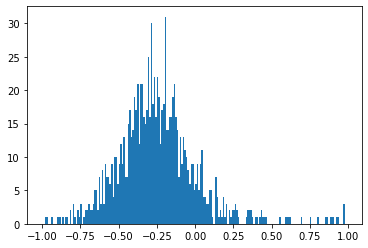

In [14]:
plt.hist((mean_dff_during_stim[included_cells]-mean_dff_before_stim[included_cells])/mean_dff_before_stim[included_cells],np.arange(-1,1,.01))
print('as')

In [28]:
sum(included_cells)

1097

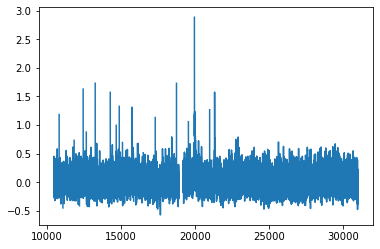

In [197]:
plt.plot(data_dict[session]['dff_sessionwise'][i,start_of_ctrl_before:end_of_ctrl_after])

In [178]:
t

array([0.00000000e+00, 5.14903893e-02, 1.02980779e-01, ...,
       1.59826168e+03, 1.59831317e+03, 1.59836467e+03])

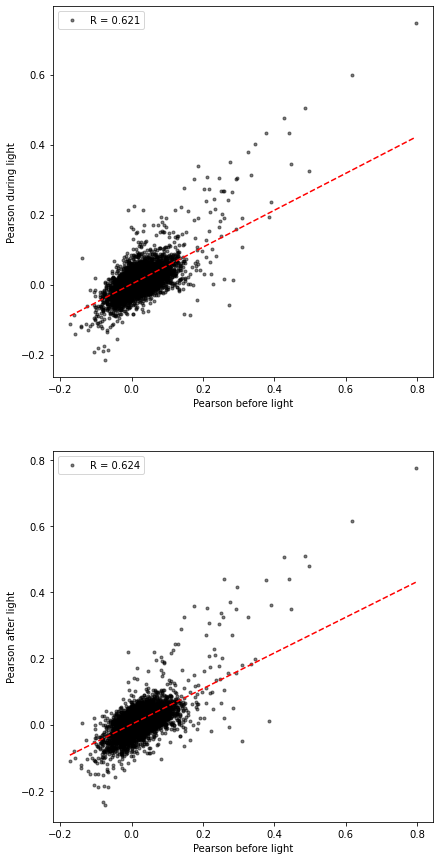

In [317]:
r_list_before_light = []
r_list_during_light = []
r_list_after_light = []
moving_window =10
for i,x in enumerate(data_dict[session][dff_to_use][:,end_of_exp_idx:start_of_blue_light]):
    for ii,y in enumerate(data_dict[session][dff_to_use][i+1:,end_of_exp_idx:start_of_blue_light]):
        index2 = ii+i+1
        if i in np.where(included_cells)[0] and index2 in np.where(included_cells)[0]:
            r = scipy.stats.pearsonr(x,y)
            r_list_before_light.append(r[0])
            x_light = data_dict[session][dff_to_use][i,start_of_blue_light:end_of_blue_light]
            y_light = data_dict[session][dff_to_use][index2,start_of_blue_light:end_of_blue_light]
            x_light = x_light[np.isnan(x_light)==False]
            y_light = y_light[np.isnan(y_light)==False]
            r = scipy.stats.pearsonr(x_light,y_light)
            r_list_during_light.append(r[0])
            
            x_after_light = data_dict[session][dff_to_use][i,end_of_blue_light+1:]
            y_after_light = data_dict[session][dff_to_use][index2,end_of_blue_light+1:]
            r = scipy.stats.pearsonr(x_after_light,y_after_light)
            r_list_after_light.append(r[0])
fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
r = scipy.stats.pearsonr(r_list_before_light,r_list_during_light)
ax1.plot(r_list_before_light,r_list_during_light,'k.',alpha = .5,label = 'R = {}'.format(np.round(r[0],3)))
p = np.polyfit(r_list_before_light,r_list_during_light,1)
xvals = np.percentile(r_list_before_light,[0,100])
ax1.plot(xvals,np.polyval(p,xvals),'r--')

ax1.set_xlabel('Pearson before light')
ax1.set_ylabel('Pearson during light')
ax1.legend()
ax2 = fig.add_subplot(2,2,3)
r = scipy.stats.pearsonr(r_list_before_light,r_list_after_light)
ax2.plot(r_list_before_light,r_list_after_light,'k.',alpha = .5,label = 'R = {}'.format(np.round(r[0],3)))
p = np.polyfit(r_list_before_light,r_list_after_light,1)
xvals = np.percentile(r_list_before_light,[0,100])
ax2.plot(xvals,np.polyval(p,xvals),'r--')
ax2.set_xlabel('Pearson before light')
ax2.set_ylabel('Pearson after light')
ax2.legend()

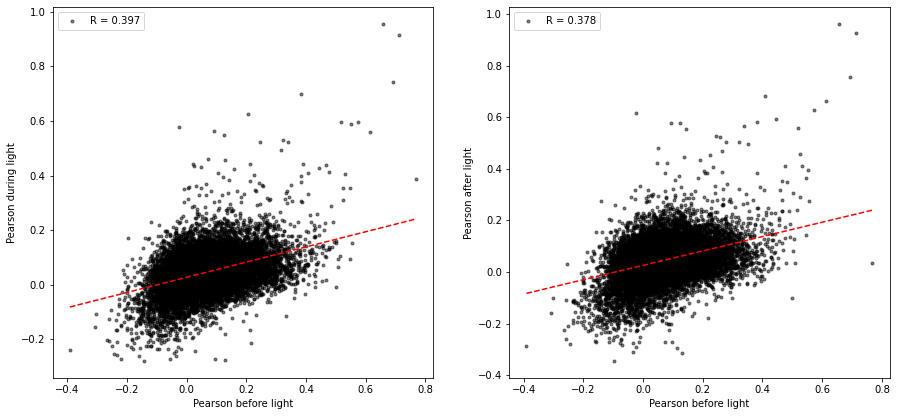

In [307]:
r_list_before_light = []
r_list_during_light = []
r_list_after_light = []
moving_window =10
for i,x in enumerate(data_dict[session][dff_to_use][:,end_of_exp_idx:start_of_blue_light]):
    for ii,y in enumerate(data_dict[session][dff_to_use][i+1:,end_of_exp_idx:start_of_blue_light]):
        index2 = ii+i+1
        if i in np.where(included_cells)[0] and index2 in np.where(included_cells)[0]:
            
            x = BCI_analysis.plot_utils.rollingfun(x,moving_window)
            y = BCI_analysis.plot_utils.rollingfun(y,moving_window)
            r = scipy.stats.pearsonr(x,y)
            r_list_before_light.append(r[0])
            x_light = data_dict[session][dff_to_use][i,start_of_blue_light:end_of_blue_light]
            y_light = data_dict[session][dff_to_use][index2,start_of_blue_light:end_of_blue_light]
            x_light = BCI_analysis.plot_utils.rollingfun(x_light,moving_window)
            y_light = BCI_analysis.plot_utils.rollingfun(y_light,moving_window)
            x_light = x_light[np.isnan(x_light)==False]
            y_light = y_light[np.isnan(y_light)==False]
            r = scipy.stats.pearsonr(x_light,y_light)
            r_list_during_light.append(r[0])
            
            x_after_light = data_dict[session][dff_to_use][i,end_of_blue_light+1:]
            y_after_light = data_dict[session][dff_to_use][index2,end_of_blue_light+1:]
            x_after_light = BCI_analysis.plot_utils.rollingfun(x_after_light,moving_window)
            y_after_light = BCI_analysis.plot_utils.rollingfun(y_after_light,moving_window)
            r = scipy.stats.pearsonr(x_after_light,y_after_light)
            r_list_after_light.append(r[0])

fig = plt.figure(figsize = [15,15])
ax1 = fig.add_subplot(2,2,1)
r = scipy.stats.pearsonr(r_list_before_light,r_list_during_light)
ax1.plot(r_list_before_light,r_list_during_light,'k.',alpha = .5,label = 'R = {}'.format(np.round(r[0],3)))
p = np.polyfit(r_list_before_light,r_list_during_light,1)
xvals = np.percentile(r_list_before_light,[0,100])
ax1.plot(xvals,np.polyval(p,xvals),'r--')

ax1.set_xlabel('Pearson before light')
ax1.set_ylabel('Pearson during light')
ax1.legend()
ax2 = fig.add_subplot(2,2,2)
r = scipy.stats.pearsonr(r_list_before_light,r_list_after_light)
ax2.plot(r_list_before_light,r_list_after_light,'k.',alpha = .5,label = 'R = {}'.format(np.round(r[0],3)))
p = np.polyfit(r_list_before_light,r_list_after_light,1)
xvals = np.percentile(r_list_before_light,[0,100])
ax2.plot(xvals,np.polyval(p,xvals),'r--')
ax2.set_xlabel('Pearson before light')
ax2.set_ylabel('Pearson after light')
ax2.legend()

In [234]:
scipy.stats.ttest_rel(mean_dff_before_stim[included_cells],mean_dff_during_stim[included_cells])[1]
#scipy.stats.ttest_rel(mean_dff_before_stim[included_cells],mean_dff_after_stim[included_cells])

0.18402601357231602

/tmp/ipykernel_15820/2596226640.py:42: RuntimeWarning: Mean of empty slice
  normalized_trial_locked_activity = trial_locked_activity-np.nanmean(trial_locked_activity[:,baseline_indices[0]:baseline_indices[1]],1)[:,np.newaxis]
/tmp/ipykernel_15820/2596226640.py:43: RuntimeWarning: Mean of empty slice
  mean_photostim_trace = np.nanmean(normalized_trial_locked_activity[photostim_trials,:],0)
/tmp/ipykernel_15820/2596226640.py:44: RuntimeWarning: Mean of empty slice
  mean_non_photostim_trace = np.nanmean(normalized_trial_locked_activity[non_photostim_trials,:],0)
/tmp/ipykernel_15820/2596226640.py:48: RuntimeWarning: Mean of empty slice
  previous_session_activity_list[cn_i] = np.nanmean(normalized_trial_locked_activity,0)


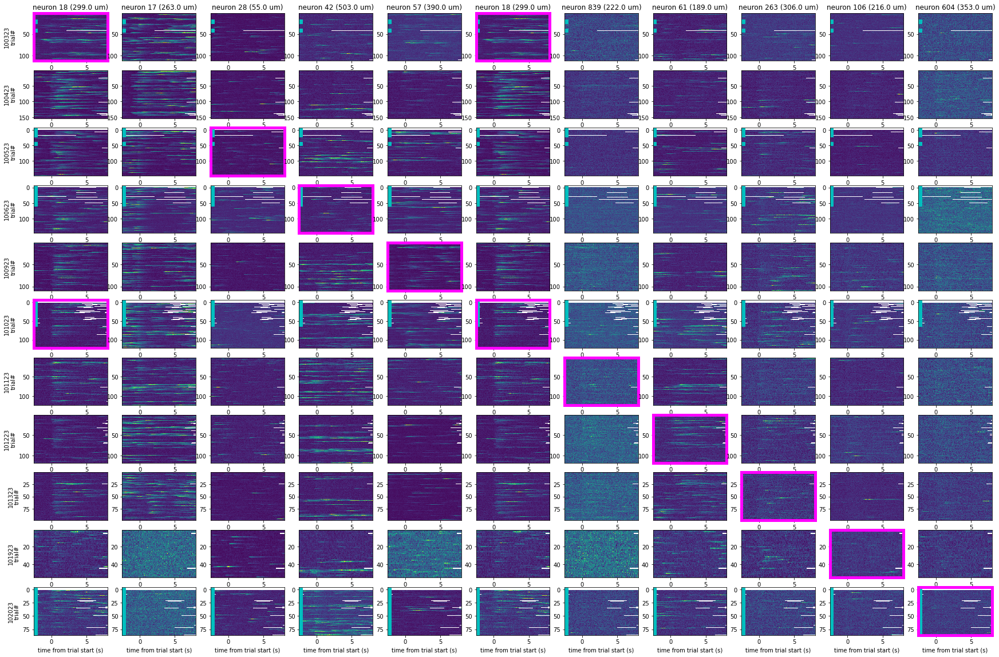

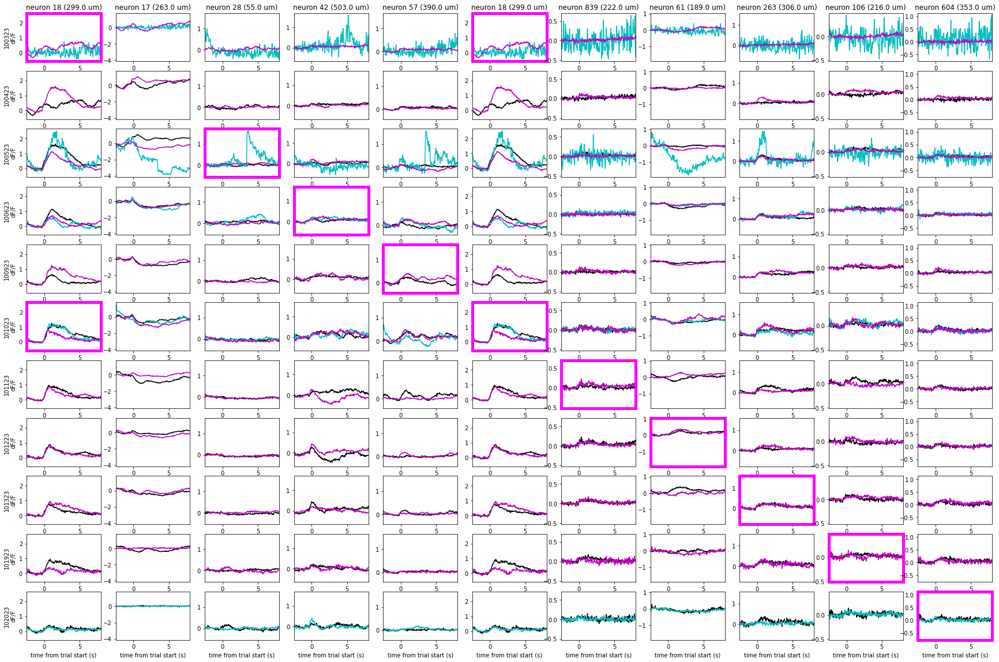

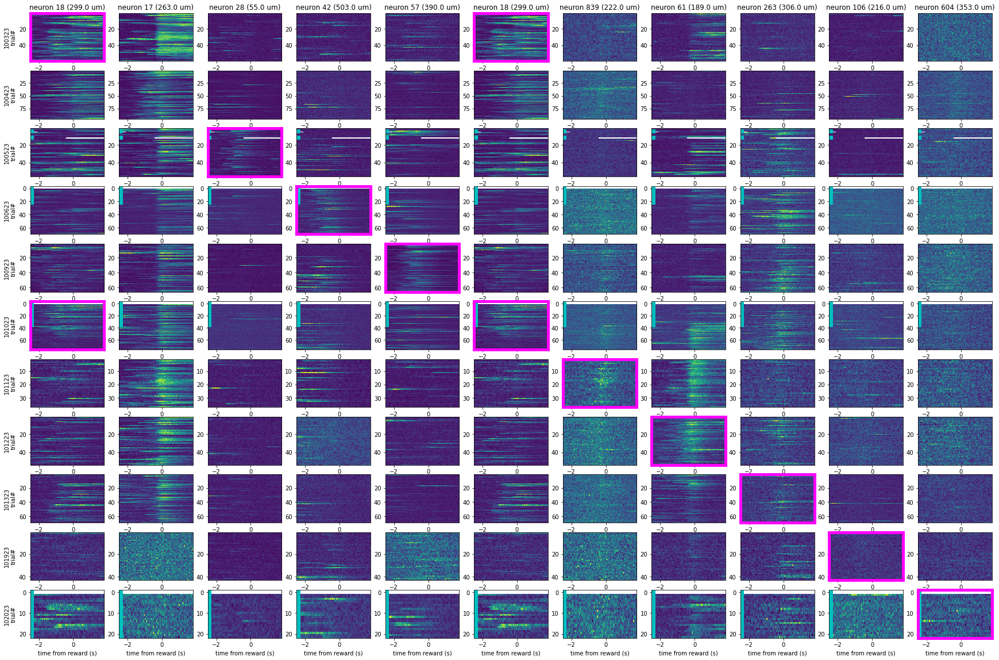

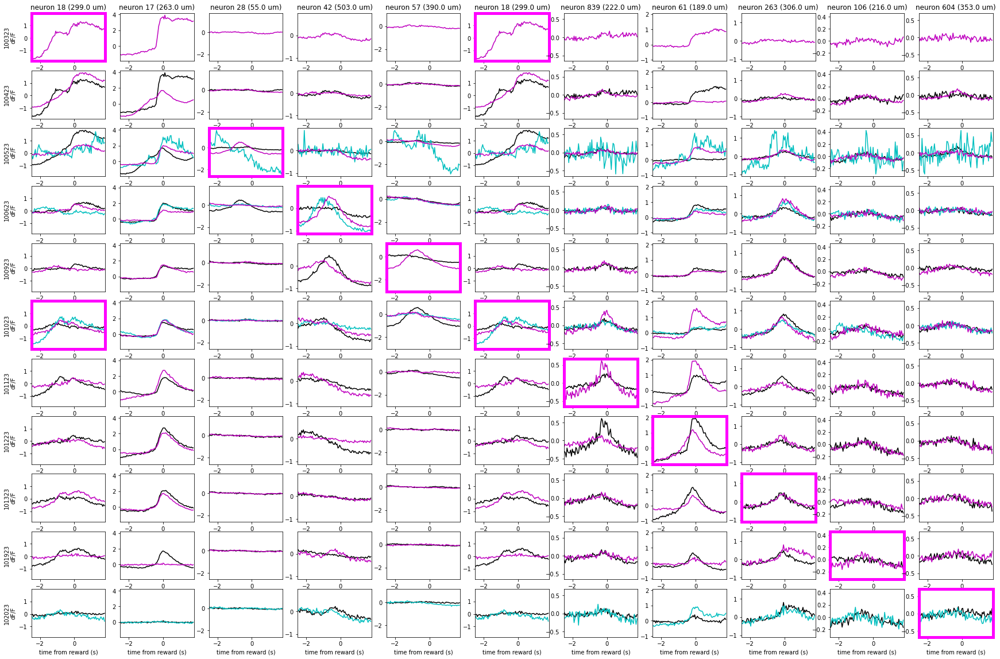

In [6]:
# Tuning changes of the CNs over multiple sessions
blue_light_location = [500,400]


def plot_cn_photostim_sessions(trial_locked_matrix_name,
                               trial_locked_photostim_name,
                               cn_list,
                               sessions,
                               xlabel,
                               data_dict,
                               stat,
                               blue_light_location,
                               baseline_ends,
                               xlimits):
    neuron_distance_list = []
    for s in stat:
        neuron_distance_list.append(np.sqrt(sum((blue_light_location-np.asarray(s['med']))**2)))
    neuron_distance_list = np.asarray(neuron_distance_list)
    fig = plt.figure(figsize = [30,20])
    ax_idx = 0
    fig_average = plt.figure(figsize = [30,20])
    average_ax_list = []
    session = sessions[0]
    previous_session_activity_list = []
    for cn_i,cn in enumerate(cn_list):
        previous_session_activity_list.append(np.zeros_like(data_dict[session]['time_since_trial_start'])*np.nan)
    for session_i,session in enumerate(sessions):
        
        for cn_i,cn in enumerate(cn_list):
            ax_idx+=1
            trial_locked_activity = data_dict[session][trial_locked_matrix_name][:,cn,:].squeeze().T
            photostim_trials = np.where(np.nanmax(data_dict[session][trial_locked_photostim_name].squeeze(),0)==1)[0]
            non_photostim_trials = np.where(np.nanmax(data_dict[session][trial_locked_photostim_name].squeeze(),0)==0)[0]
            ax_trial_locked_activity = fig.add_subplot(len(sessions),len(cn_list),ax_idx)
            if session_i ==0:
                ax_trial_locked_mean_activity = fig_average.add_subplot(len(sessions),len(cn_list),ax_idx)
                average_ax_list.append(ax_trial_locked_mean_activity)
            else:
                ax_trial_locked_mean_activity = fig_average.add_subplot(len(sessions),len(cn_list),ax_idx,sharey = average_ax_list[cn_i])
            
            baseline_indices = [np.argmax(data_dict[session]['time_since_trial_start']>baseline_ends[0]),np.argmax(data_dict[session]['time_since_trial_start']>baseline_ends[1])]
            normalized_trial_locked_activity = trial_locked_activity-np.nanmean(trial_locked_activity[:,baseline_indices[0]:baseline_indices[1]],1)[:,np.newaxis]
            mean_photostim_trace = np.nanmean(normalized_trial_locked_activity[photostim_trials,:],0)
            mean_non_photostim_trace = np.nanmean(normalized_trial_locked_activity[non_photostim_trials,:],0)
            needed_indices = (data_dict[session]['time_since_trial_start']>xlimits[0]) & (data_dict[session]['time_since_trial_start']<xlimits[1])
            
            ax_trial_locked_mean_activity.plot(data_dict[session]['time_since_trial_start'][needed_indices],previous_session_activity_list[cn_i][needed_indices],'k-')    
            previous_session_activity_list[cn_i] = np.nanmean(normalized_trial_locked_activity,0)
            ax_trial_locked_mean_activity.plot(data_dict[session]['time_since_trial_start'][needed_indices],mean_photostim_trace[needed_indices],'c-')    
            ax_trial_locked_mean_activity.plot(data_dict[session]['time_since_trial_start'][needed_indices],mean_non_photostim_trace[needed_indices],'m-')    
            
            ax_trial_locked_activity.imshow(trial_locked_activity,
                                            aspect = 'auto',
                                            extent = [data_dict[session]['time_since_trial_start'][0],data_dict[session]['time_since_trial_start'][-1],trial_locked_activity.shape[0],1],
                                            interpolation = 'none')
            ax_trial_locked_activity.plot(np.ones(len(photostim_trials))*xlimits[0]+.02*np.diff(xlimits)[0],photostim_trials,'cs')
            if cn_i == 0:
                ax_trial_locked_activity.set_ylabel('{}\ntrial#'.format(session))
                ax_trial_locked_mean_activity.set_ylabel('{}\ndF/F'.format(session))
            if session_i == 0:
                ax_trial_locked_activity.set_title('neuron {} ({} um)'.format(cn,np.round(neuron_distance_list[cn])))
                ax_trial_locked_mean_activity.set_title('neuron {} ({} um)'.format(cn,np.round(neuron_distance_list[cn])))
                
            if cn == data_dict[session]['cn'][10]:
                ax_trial_locked_activity.spines['bottom'].set_color('magenta')
                ax_trial_locked_activity.spines['top'].set_color('magenta') 
                ax_trial_locked_activity.spines['right'].set_color('magenta')
                ax_trial_locked_activity.spines['left'].set_color('magenta')
                ax_trial_locked_activity.spines['bottom'].set_linewidth(5)
                ax_trial_locked_activity.spines['top'].set_linewidth(5)
                ax_trial_locked_activity.spines['right'].set_linewidth(5)
                ax_trial_locked_activity.spines['left'].set_linewidth(5)
                ax_trial_locked_mean_activity.spines['bottom'].set_color('magenta')
                ax_trial_locked_mean_activity.spines['top'].set_color('magenta') 
                ax_trial_locked_mean_activity.spines['right'].set_color('magenta')
                ax_trial_locked_mean_activity.spines['left'].set_color('magenta')
                ax_trial_locked_mean_activity.spines['bottom'].set_linewidth(5)
                ax_trial_locked_mean_activity.spines['top'].set_linewidth(5)
                ax_trial_locked_mean_activity.spines['right'].set_linewidth(5)
                ax_trial_locked_mean_activity.spines['left'].set_linewidth(5)
                
                
            if session_i == len(sessions)-1:
                ax_trial_locked_activity.set_xlabel(xlabel)
                ax_trial_locked_mean_activity.set_xlabel(xlabel)
            ax_trial_locked_activity.set_xlim(xlimits)
            ax_trial_locked_mean_activity.set_xlim(xlimits)
trial_locked_matrix_name = 'dff_trialwise_closed_loop'
trial_locked_photostim_name = 'PMT_off_trialwise_closed_loop'
plot_cn_photostim_sessions(trial_locked_matrix_name,
                           trial_locked_photostim_name,
                           cn_list,
                           sessions,
                          'time from trial start (s)',
                          data_dict,
                           stat,
                           blue_light_location,
                          [-2,0],
                          [-2.5,8])
trial_locked_matrix_name = 'dff_trialwise_reward_closed_loop'
trial_locked_photostim_name = 'PMT_off_reward_closed_loop'
plot_cn_photostim_sessions(trial_locked_matrix_name,
                           trial_locked_photostim_name,
                           cn_list,
                           sessions,
                           'time from reward (s)',
                          data_dict,
                           stat,
                           blue_light_location,
                           [-2,0],
                           [-2.5,1.8])

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [2]:
from rastermap import Rastermap
import scipy
model = Rastermap(n_components=2, n_X=50, nPC=100, init='pca')
a = scipy.stats.zscore(data_dict[session]['dff_sessionwise'],1)
model.fit(a)


#im_events = ax.imshow(events_zscore[model.isort,:],aspect = 'auto', interpolation = 'none')  

nmin 100
0.29870009422302246
7.314893960952759
7.504754304885864
7.510336875915527
(2400, 2500)
(80,)
1.0
time; iteration;  explained PC variance
0.93s     0        0.2002      8
2.77s    10        0.4257      24
4.62s    20        0.5173      80
6.49s    30        0.6534      360
8.74s    40        0.7443      840
10.71s    50        0.8135      1520
12.81s    60        0.8859      2400
14.94s    70        0.8865      2400
16.86s   final      0.8865
25.68s upsampled    0.8865


In [54]:
#%% calculate event rate and stuff like that

# TODO amplitude should be calculated for each transient separately, then averaged over transients
# this way the long tails of long trials won't interfere
from pathlib import Path


cut_reward_activity = False
ignore_synchronous_events = True
#% calculate event rate
min_event_step = 5 # @20Hz - length of event # 10 for 6s, 5 for 8s
minimum_d_prime = 3# 5 for 6s
time_to_average_after_trial_start = 8 #seconds
baseline_end_t = -.5 # seconds before GO cue
baseline_start_t = -1.5 # seconds before GO cue

file_list_to_copy_over = ['Z-positions.pdf',
                          'session_meanimages.tiff',
                          'ROI_sizes.pdf',
                          'ROIs.pdf',
                          'stat.mat',
                          'XYZ_motion.pdf',
                          'session_refImages.tiff',
                          'ops.mat']
#%

pixel_num_list = []
for s in stat:
    pixel_num_list.append(np.sum(s['soma_crop']))# &(s['overlap']==False)))
    #break
pixel_num_list=np.asarray(pixel_num_list)
    #%
for last_session in sessions: 
    
    mean_activity_matrix_normalized_previous_CN = None
    if 'dff_trialwise_closed_loop_previous_CN' in data_dict[last_session].keys():
        trialwise_matrix_name = 'dff_trialwise_closed_loop_previous_CN'#'dff_trialwise_all'
        trialwise_reward_matrix_name = 'dff_trialwise_reward_closed_loop_previous_CN'#'dff_trialwise_all'
        trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
        if trialwise_dff_until_reward.shape[2]==0:
            trialwise_matrix_name = 'dff_trialwise_all'
            trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
        #trialwise_reward_matrix = np.nan*trialwise_dff_until_reward
        trialwise_reward_matrix = data_dict[last_session][trialwise_reward_matrix_name].copy()
        step_back =np.argmax(data_dict[last_session]['time_since_trial_start']>0) -1
        trial_len = len(data_dict[last_session]['time_since_trial_start'])
        for trial_i, reward_time in enumerate(data_dict[last_session]['reward_times_previous_CN']):
            if len(reward_time)>0:

                reward_idx = np.argmax(data_dict[last_session]['time_since_trial_start']>reward_time[0])
                if reward_idx == 0:
                    reward_idx = len(data_dict[last_session]['time_since_trial_start'])
                #print(['rewarded',reward_idx])
                if cut_reward_activity:
                    trialwise_dff_until_reward[reward_idx:,:,trial_i] = np.nan
                
                #trialwise_reward_matrix[:step_back+trial_len-reward_idx,:,trial_i] = data_dict[last_session][trialwise_matrix_name][reward_idx-step_back:,:,trial_i]
        mean_reward_matrix = np.nanmean(trialwise_reward_matrix,2).T
        std_reward_matrix = np.nanstd(trialwise_reward_matrix,2).T
        mean_activity_matrix = np.nanmean(trialwise_dff_until_reward,2).T
        baseline_length = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times_previous_CN'][0][0])#
        baseline_end = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times_previous_CN'][0][0]+baseline_end_t)#
        baseline_start = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times_previous_CN'][0][0]+baseline_start_t)#
        amplitude_length = np.argmax(data_dict[last_session]['time_since_trial_start']>time_to_average_after_trial_start)
        mean_activity_matrix_normalized_previous_CN = mean_activity_matrix-np.nanmean(mean_activity_matrix[:,baseline_start:baseline_end],1)[:,np.newaxis]#/np.nanmean(mean_activity_matrix[:,:baseline_length],1)[:,np.newaxis] # TODO division is not needed here once real df/f is exported..
        mean_activity_matrix_normalized_previous_CN[np.isnan(mean_activity_matrix_normalized_previous_CN)] = 0
        mean_activity_matrix_normalized_previous_CN[np.isinf(mean_activity_matrix_normalized_previous_CN)] = 0

        data_dict[last_session]['mean_activity_matrix_previous_cn'] = mean_activity_matrix
        data_dict[last_session]['mean_reward_matrix_previous_cn'] = mean_reward_matrix
    
    trialwise_matrix_name = 'dff_trialwise_closed_loop'#'dff_trialwise_all'
    trialwise_reward_matrix_name = 'dff_trialwise_reward_closed_loop'#'dff_trialwise_all'

    trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
    if trialwise_dff_until_reward.shape[2]==0:
        trialwise_matrix_name = 'dff_trialwise_all'
        trialwise_dff_until_reward = data_dict[last_session][trialwise_matrix_name].copy()
    #trialwise_reward_matrix = np.nan*trialwise_dff_until_reward
    trialwise_reward_matrix = data_dict[last_session][trialwise_reward_matrix_name].copy()
    step_back =np.argmax(data_dict[last_session]['time_since_trial_start']>0) -1
    trial_len = len(data_dict[last_session]['time_since_trial_start'])
    for trial_i, reward_time in enumerate(data_dict[last_session]['reward_times']):
        if len(reward_time)>0:
            
            reward_idx = np.argmax(data_dict[last_session]['time_since_trial_start']>reward_time[0])
            if reward_idx == 0:
                reward_idx = len(data_dict[last_session]['time_since_trial_start'])
            #print(['rewarded',reward_idx])
            if cut_reward_activity:
                trialwise_dff_until_reward[reward_idx:,:,trial_i] = np.nan
           # trialwise_reward_matrix[:step_back+trial_len-reward_idx,:,trial_i] = data_dict[last_session][trialwise_matrix_name][reward_idx-step_back:,:,trial_i]
    mean_reward_matrix = np.nanmean(trialwise_reward_matrix,2).T
    std_reward_matrix = np.nanstd(trialwise_reward_matrix,2).T
    mean_activity_matrix = np.nanmean(trialwise_dff_until_reward,2).T
    baseline_length = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times'][0][0])#
    baseline_end = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times'][0][0]+baseline_end_t)#
    baseline_start = np.argmax(data_dict[last_session]['time_since_trial_start']>data_dict[last_session]['go_cue_times'][0][0]+baseline_start_t)#
    amplitude_length = np.argmax(data_dict[last_session]['time_since_trial_start']>time_to_average_after_trial_start)
    mean_activity_matrix_normalized = mean_activity_matrix-np.nanmean(mean_activity_matrix[:,baseline_start:baseline_end],1)[:,np.newaxis]#/np.nanmean(mean_activity_matrix[:,:baseline_length],1)[:,np.newaxis] # TODO division is not needed here once real df/f is exported..
    mean_activity_matrix_normalized[np.isnan(mean_activity_matrix_normalized)] = 0
    mean_activity_matrix_normalized[np.isinf(mean_activity_matrix_normalized)] = 0
    
    data_dict[last_session]['mean_activity_matrix'] = mean_activity_matrix
    data_dict[last_session]['mean_reward_matrix'] = mean_reward_matrix
    

    amplitude = np.nanmean(mean_activity_matrix_normalized[:,baseline_length:amplitude_length],1)
    # amplitude[amplitude>1] = 1
    # amplitude[amplitude<-1] = -1
    stdev = np.nanstd(mean_activity_matrix_normalized[:,baseline_length:amplitude_length],1)
    #%
    events = data_dict[last_session]['signal_to_noise_trace']>minimum_d_prime
    if ignore_synchronous_events:
        events = events & (np.nanmean(data_dict[last_session]['signal_to_noise_trace'],0)<minimum_d_prime)[np.newaxis,:]
    event_edges = np.diff(np.concatenate([np.zeros([events.shape[0],1]),events,np.zeros([events.shape[0],1])],1))
    events_clean = np.zeros(events.shape)
    event_num = []
    event_amplitude = []
    
    
        
    for i,line in enumerate(event_edges):
        starts = np.where(line==1)[0]
        ends = np.where(line==-1)[0]
        lengths = ends-starts
        amplitudes = []
        for idx in np.where(lengths>=min_event_step)[0]:
            events_clean[i,starts[idx]:ends[idx]]=np.ones(lengths[idx])*np.nanmean(data_dict[last_session]['dff_sessionwise'][i,starts[idx]:ends[idx]])#*data_dict[last_session]['photon_counts']['dprime_1dFF'][i]
            #events_clean[i,starts[idx]:ends[idx]]=data_dict[last_session]['dff_sessionwise'][i,starts[idx]:ends[idx]]
            amplitudes.append(np.max(data_dict[last_session]['dff_sessionwise'][i,starts[idx]:ends[idx]]))
        event_amplitude.append(np.mean(amplitudes))
        event_num.append(len(np.where(lengths>=min_event_step)[0]))
    events_clean[np.isnan(events_clean)] = 0
    events_clean[np.isinf(events_clean)] = 0
    event_rate = np.asarray(event_num)/(events.shape[1]/20/60)
    amplitude_rate = np.sum(events_clean,1)/(events.shape[1]/20)
    amplitude_rate[amplitude_rate<.001] = .001 #avoid zeros
    event_rate[event_rate<.001] = .001 #avoid zeros
    data_dict[last_session]['event_rate'] = event_rate
    data_dict[last_session]['amplitude_rate'] = amplitude_rate
    data_dict[last_session]['events_clean'] = events_clean
    data_dict[last_session]['trial_averaged_amplitude'] = amplitude
    
    go_cue_times = data_dict[last_session]['go_cue_times']
    reward_times = data_dict[last_session]['reward_times']
    threshold_crossing_times = data_dict[last_session]['threshold_crossing_times']
    reward_list = []
    threshold_crossing_list = []
    for g,r,t in zip(go_cue_times,reward_times,threshold_crossing_times):
        if len(r)>0:
            reward_list.append(True)
            threshold_crossing_list.append(t[0])
        else:
            reward_list.append(False)
            threshold_crossing_list.append(np.nan)
    data_dict[last_session]['rewarded_trials'] = np.asarray(reward_list)
    data_dict[last_session]['time_to_reward'] = np.asarray(threshold_crossing_list)
    
    
    try:
        go_cue_times = data_dict[last_session]['go_cue_times_previous_CN']
        reward_times = data_dict[last_session]['reward_times_previous_CN']
        threshold_crossing_times = data_dict[last_session]['threshold_crossing_times_previous_CN']
        reward_list = []
        threshold_crossing_list = []
        for g,r,t in zip(go_cue_times,reward_times,threshold_crossing_times):
            if len(r)>0:
                reward_list.append(True)
                threshold_crossing_list.append(t[0])
            else:
                reward_list.append(False)
                threshold_crossing_list.append(np.nan)
        data_dict[last_session]['rewarded_trials_previous_CN'] = np.asarray(reward_list)
        data_dict[last_session]['time_to_reward_previous_CN'] = np.asarray(threshold_crossing_list)
    except:
        print('no previous_cn')
    

/tmp/ipykernel_3217/2233604163.py:93: RuntimeWarning: Mean of empty slice
  mean_reward_matrix = np.nanmean(trialwise_reward_matrix,2).T
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/envs/bci_with_suite2p/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


no previous_cn


/tmp/ipykernel_3217/2233604163.py:115: RuntimeWarning: Mean of empty slice
  events = events & (np.nanmean(data_dict[last_session]['signal_to_noise_trace'],0)<minimum_d_prime)[np.newaxis,:]


no previous_cn
no previous_cn
no previous_cn


In [45]:
data_dict_big.keys()

dict_keys(['BCI_59', 'BCI_60'])

In [70]:
#Add to master dict 
#data_dict_big = {}
data_dict_big[subject] = data_dict.copy()
data_dict_big[subject].keys()

dict_keys(['092523', '092623', '092723', '092823', '092923'])

In [49]:
# add session comment

metadata_dir = '/home/jupyter/bucket/Metadata'
import datetime
import pandas as pd
for subject in data_dict_big.keys():
    try:
        subject_metadata = pd.read_csv(os.path.join(metadata_dir,subject.replace('_','')+'.csv'))
    except:
        try:
            subject_metadata = pd.read_csv(os.path.join(metadata_dir,subject+'.csv'))
        except:
            print('no metadata found')
            continue
    print(subject)


    sessions = list(data_dict_big[subject].keys())
    session_date_dict = {}
    for session in sessions:
        try:
            session_date = datetime.datetime.strptime(session,'%m%d%y')
        except:
            try:
                session_date = datetime.datetime.strptime(session,'%Y-%m-%d')
            except:
                try:
                    session_date = datetime.datetime.strptime(session[:6],'%m%d%y')
                except:
                    print('cannot understand date for session dir: {}'.format(session))
                    continue
        if session_date.date() in session_date_dict.keys():
            print('there were multiple sessions on {}'.format(session_date.date()))
            session_date_dict[session_date.date()] = [session_date_dict[session_date.date()],session]
        else:
            session_date_dict[session_date.date()] = session
        data_dict_big[subject][session]['session_comment'] = subject_metadata.loc[subject_metadata['Date']==str(session_date.date()).replace('-','/')]['Comment'].values[0]

BCI_59
BCI_60
BCI_58


In [208]:
data_dict_big[subject][session]['session_comment']

'original task - return to previous CN in the beginning'

In [70]:
#### calculate behavioral stuff.

is_it_previous_cn = False
if is_it_previous_cn:
    extra_txt = '_previous_CN'
else:
    extra_txt = ''
def movingaverage(DFF,win,function = 'mean'):
    taper = np.ones(win)*np.nan
    DFF = np.concatenate([DFF,taper])
    dff_list = []
    for i in range(win):
        dff_list.append(np.roll(DFF,i*-1,axis = 0))
    if function == 'mean':
        DFF_averaged = np.nanmean(np.asarray(dff_list),0).squeeze()
    elif function == 'median':
        DFF_averaged = np.nanmedian(np.asarray(dff_list),0).squeeze()
    DFF_averaged = DFF_averaged[:-win]
    return DFF_averaged


needed_comments = ['original']#['anti','pair']#['pair']
excluded_comments = []#['anti']

trials_needed = 100
averaging_window = 10
rewarded_trials_list = []
time_to_reward_list = []
for subject in data_dict_big.keys():
    print(subject)
    sessions = data_dict_big[subject].keys()
    for session in sessions:
        #print(data_dict_big[subject][session]['session_comment'])
        session_is_needed =True
        for c in needed_comments:
            session_is_needed = session_is_needed and c in data_dict_big[subject][session]['session_comment']
        for c in excluded_comments:
            session_is_needed = session_is_needed and c not in data_dict_big[subject][session]['session_comment']
        #print([data_dict_big[subject][session]['session_comment'],session_is_needed])
        if not session_is_needed:
            continue
        print(session)
        try:
            rewarded_trials_now = data_dict_big[subject][session]['rewarded_trials'+extra_txt]
            if averaging_window>1:
                rewarded_trials_now = movingaverage(rewarded_trials_now,averaging_window)
            rewarded_trials_now_ = np.ones(trials_needed)*np.nan
            rewarded_trials_now_[:min([len(rewarded_trials_now),len(rewarded_trials_now_)])] = rewarded_trials_now[:min([len(rewarded_trials_now),len(rewarded_trials_now_)])]
            rewarded_trials_list.append(rewarded_trials_now_)

            time_to_reward_now = data_dict_big[subject][session]['time_to_reward'+extra_txt]
            if averaging_window>1:
                time_to_reward_now = movingaverage(time_to_reward_now,averaging_window,function = 'mean')
            time_to_reward_now_ = np.ones(trials_needed)*np.nan
            time_to_reward_now_[:min([len(time_to_reward_now),len(time_to_reward_now_)])] = time_to_reward_now[:min([len(time_to_reward_now),len(time_to_reward_now_)])]
            time_to_reward_list.append(time_to_reward_now_)
        except:
            pass
        #asda
        
        
rewarded_trials_list = np.asarray(rewarded_trials_list)
time_to_reward_list = np.asarray(time_to_reward_list)

order = np.argsort(np.nanmean(rewarded_trials_list[:,:5],1)) #np.nanmean(rewarded_trials_list[:,30:60],1)-
rewarded_trials_list = rewarded_trials_list[order,:]
time_to_reward_list = time_to_reward_list[order,:]

    
    #plt.plot(movingaverage(data_dict[session]['rewarded_trials'],5))
    

BCI_59
070323
070523
070623
070723
BCI_60
070323
070523
070623
070723
071023
071123
071223
071323
BCI_58
070323
070523
070623
070723
071023
071123
071223
071323


/tmp/ipykernel_32069/435318682.py:15: RuntimeWarning: Mean of empty slice
  DFF_averaged = np.nanmean(np.asarray(dff_list),0).squeeze()


In [197]:
rewarded_trials_list

array([], dtype=float64)

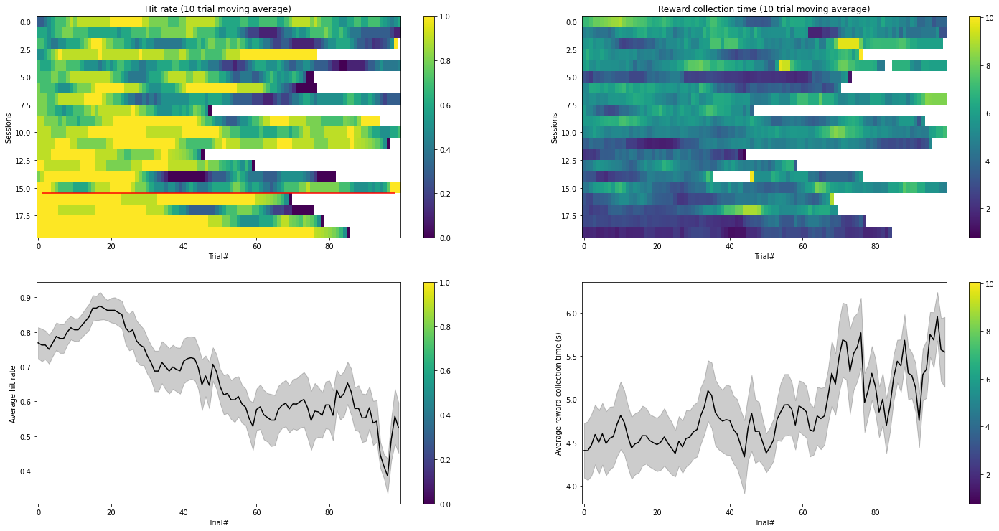

In [71]:
# behavior plot

fig  = plt.figure(figsize = [25,12.5])
baseline_trial_num = 0 # subtract the average of this many trial
max_reward_rate_start  = .99 # if reward rate is higher than this, skip session from plot


ax_im_rewrate  = fig.add_subplot(2,2,1)
needed = np.nanmean(rewarded_trials_list[:,:5],1)<=max_reward_rate_start
if baseline_trial_num==0:
    im = ax_im_rewrate.imshow(rewarded_trials_list[:,:],aspect = 'auto', interpolation = 'none') #-np.nanmean(rewarded_trials_list[:,:5],1)[:,np.newaxis]
else:
    im = ax_im_rewrate.imshow(rewarded_trials_list[:,:]-np.nanmean(rewarded_trials_list[:,:baseline_trial_num],1)[:,np.newaxis],aspect = 'auto', interpolation = 'none') #
ax_im_rewrate.hlines(np.argmin(needed)-.5,1,rewarded_trials_list.shape[1]-2,color = 'red')
ax_im_rewrate.set_ylabel('Sessions')
ax_im_rewrate.set_xlabel('Trial#')
ax_im_rewrate.set_title('Hit rate ({} trial moving average)'.format(averaging_window))
fig.colorbar(im, ax=ax_im_rewrate,location = 'right')


ax_plt_rewrate = fig.add_subplot(2,2,3,sharex = ax_im_rewrate)
x = np.arange(rewarded_trials_list.shape[1])
y = np.nanmean(rewarded_trials_list[needed,:],0)
yerr = np.nanstd(rewarded_trials_list[needed,:],0)/np.sqrt(sum(needed))
ax_plt_rewrate.plot(x,y,'k-')

ax_plt_rewrate.fill_between(x, y-yerr, y+yerr,color = 'black',alpha = .2)
fig.colorbar(im, ax=ax_plt_rewrate,location = 'right')

ax_plt_rewrate.set_ylabel('Average hit rate')
ax_plt_rewrate.set_xlabel('Trial#')


needed = rewarded_trials_list[:,0]<=max_reward_rate_start+100
ax_im_rewrtime  = fig.add_subplot(2,2,2)
if baseline_trial_num==0:
    im = ax_im_rewrtime.imshow(time_to_reward_list[needed,:],aspect = 'auto', interpolation = 'none') #-np.nanmean(time_to_reward_list[:,:20],1)[:,np.newaxis]
else:
    im = ax_im_rewrtime.imshow(time_to_reward_list[needed,:]-np.nanmean(time_to_reward_list[needed,:baseline_trial_num],1)[:,np.newaxis],aspect = 'auto', interpolation = 'none') #

ax_im_rewrtime.set_ylabel('Sessions')
ax_im_rewrtime.set_xlabel('Trial#')
ax_im_rewrtime.set_title('Reward collection time ({} trial moving average)'.format(averaging_window))
fig.colorbar(im, ax=ax_im_rewrtime,location = 'right')
    
    
ax_plt_rewtime = fig.add_subplot(2,2,4,sharex = ax_im_rewrtime)


x = np.arange(time_to_reward_list.shape[1])
y = np.nanmean(time_to_reward_list[:,:],0)
yerr = np.nanstd(time_to_reward_list[:,:],0)/np.sqrt(len(needed))
ax_plt_rewtime.plot(x,y,'k-')
ax_plt_rewtime.fill_between(x, y-yerr, y+yerr,color = 'black',alpha = .2)


ax_plt_rewtime.set_ylabel('Average reward collection time (s)')
ax_plt_rewtime.set_xlabel('Trial#')
fig.colorbar(im, ax=ax_plt_rewtime,location = 'right')

In [9]:
data_dict.keys()

dict_keys(['032023', '032123', '032223', '032423', '032723', '032823', '032923', '033123', '040323', '040423'])

In [148]:
data_dict[last_session].keys()

dict_keys(['file_path', 'file_name', 'subject', 'F_sessionwise', 'F_trialwise_all', 'F_trialwise_closed_loop', 'dff_sessionwise', 'dff_trialwise_all', 'dff_trialwise_closed_loop', 'cn', 'roiX', 'roiY', 'dist', 'FOV', 'session_date', 'session_path', 'mouse', 'mean_image', 'max_image', 'time_since_trial_start', 'go_cue_times', 'lick_times', 'reward_times', 'trial_times', 'hit', 'threshold_crossing_times', 'zaber_move_forward', 'sampling_rate', 'all_si_filenames', 'closed_loop_filenames', 'all_si_frame_nums', 'scanimage_filenames', 'photon_counts', 'f0_scalar', 'signal_to_noise_trace', 'F_trialwise_closed_loop_previous_CN', 'dff_trialwise_closed_loop_previous_CN', 'go_cue_times_previous_CN', 'reward_times_previous_CN', 'scanimage_filenames_previous_CN', 'lick_times_previous_CN', 'hit_previous_CN', 'threshold_crossing_times_previous_CN', 'zaber_move_forward_previous_CN', 'mean_activity_matrix_previous_cn', 'mean_reward_matrix_previous_cn', 'mean_activity_matrix', 'mean_reward_matrix', 'eve

In [68]:
pdf_obj.close()

nmin 50
0.026047945022583008
1.6180322170257568
1.6705529689788818
1.6718437671661377
(80, 100)
(32,)
1.0
time; iteration;  explained PC variance
0.01s     0        0.2275      8
0.08s    10        0.5995      48
0.15s    20        0.7226      80
0.21s    30        0.7225      80
0.22s   final      0.7225
1.69s upsampled    0.7225


/tmp/ipykernel_1352/2215930234.py:161: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = [16,8])


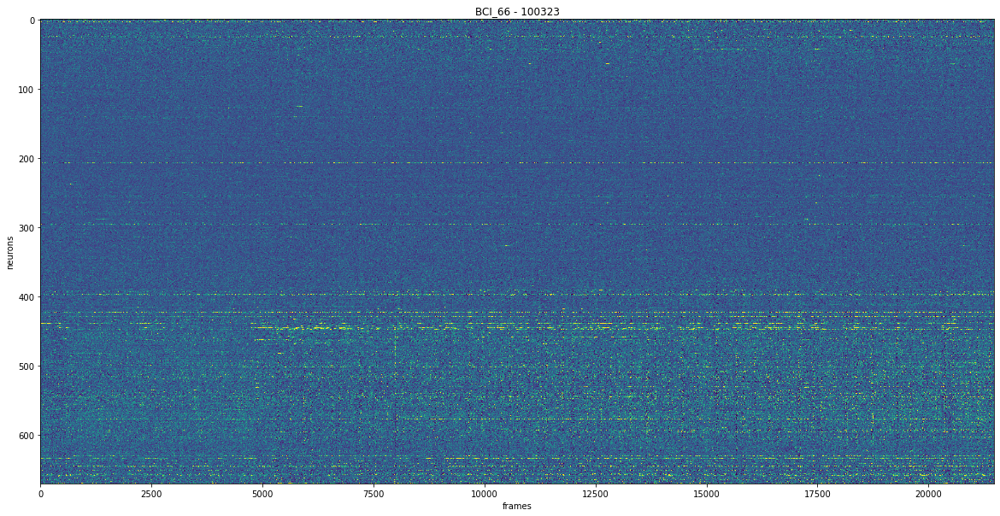

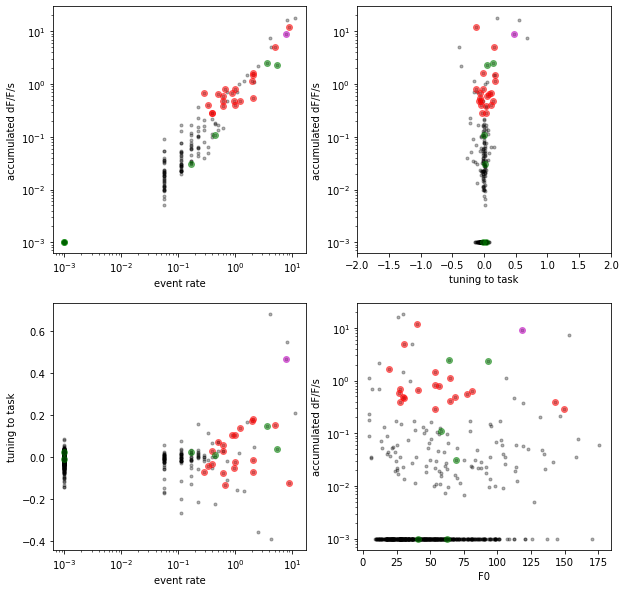

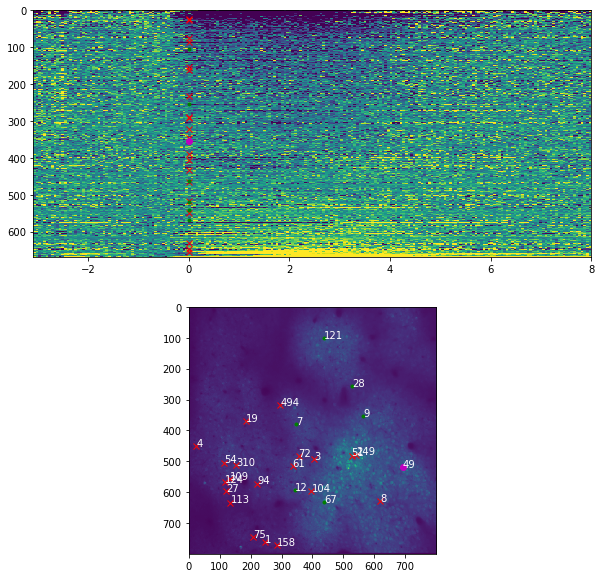

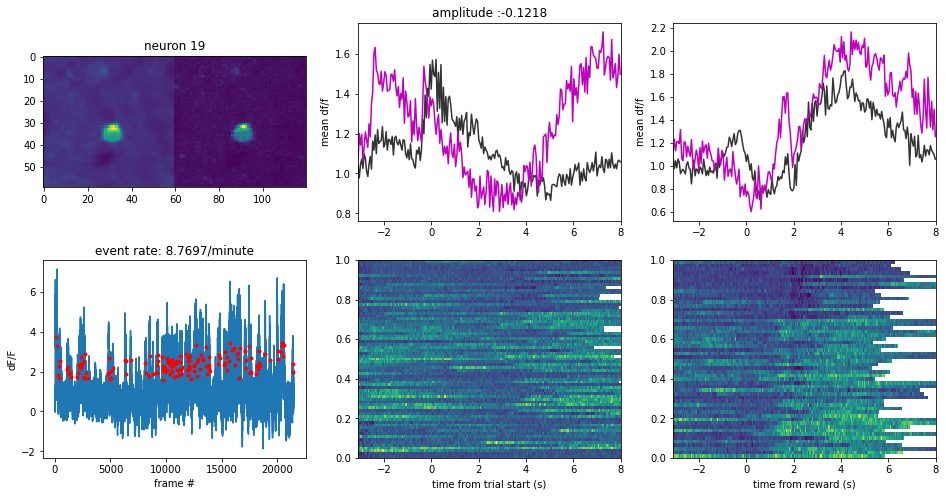

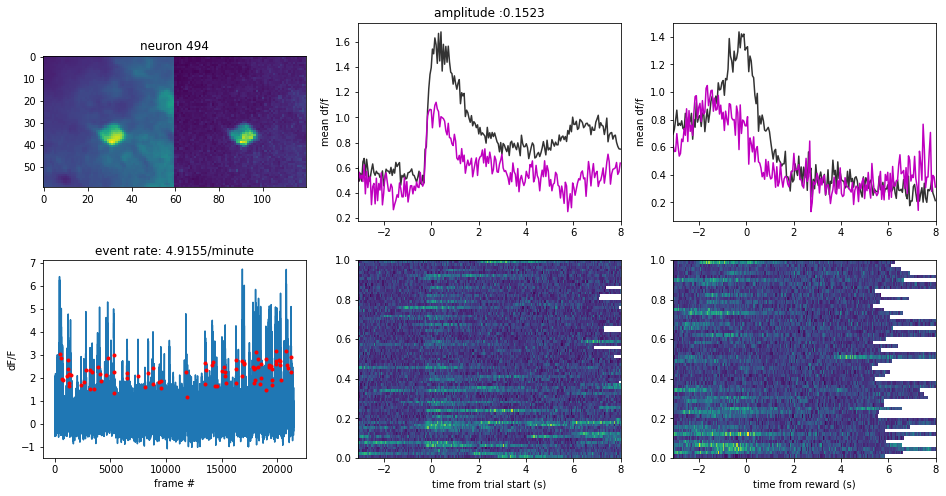

...

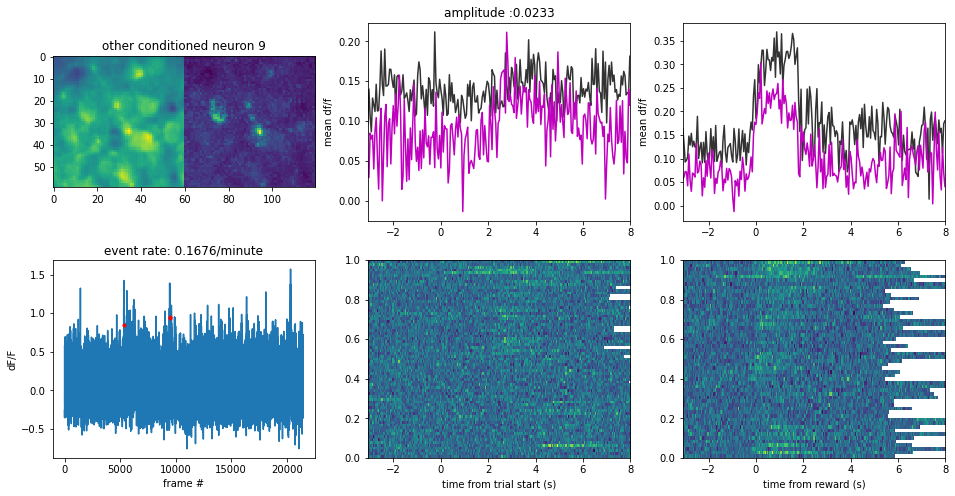

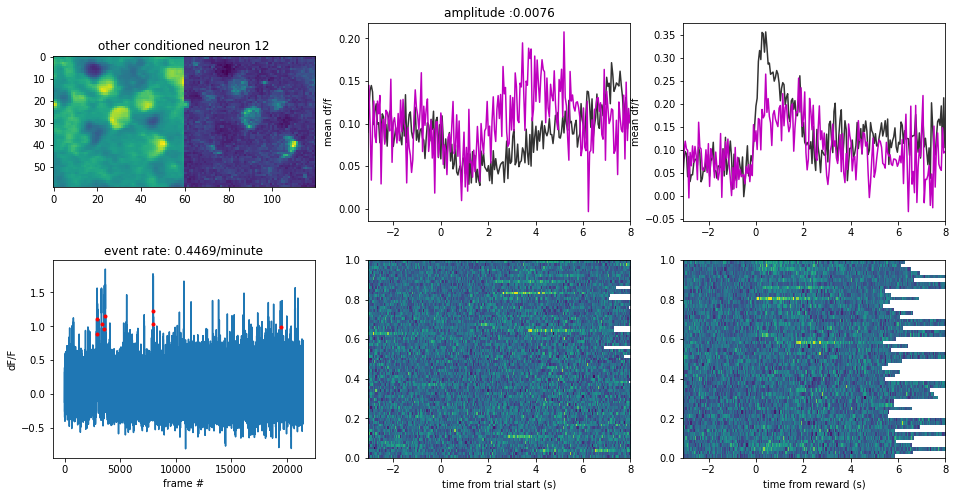

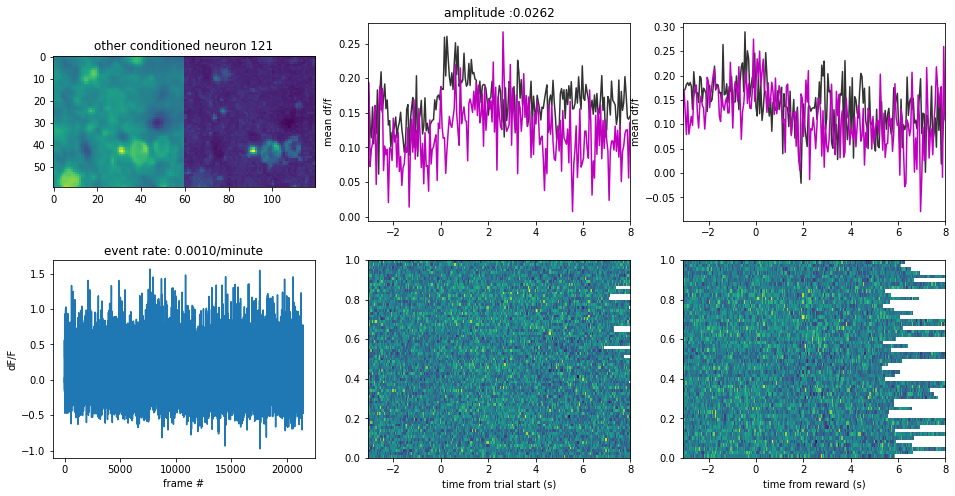

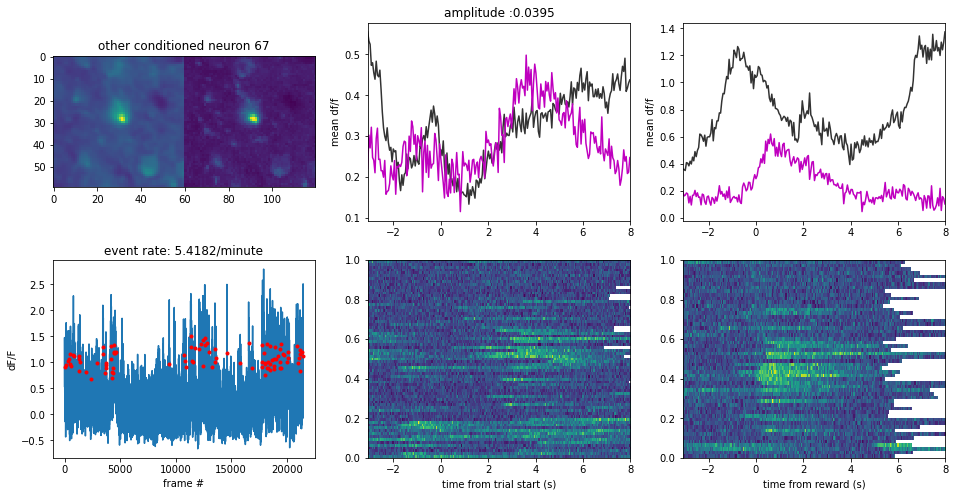

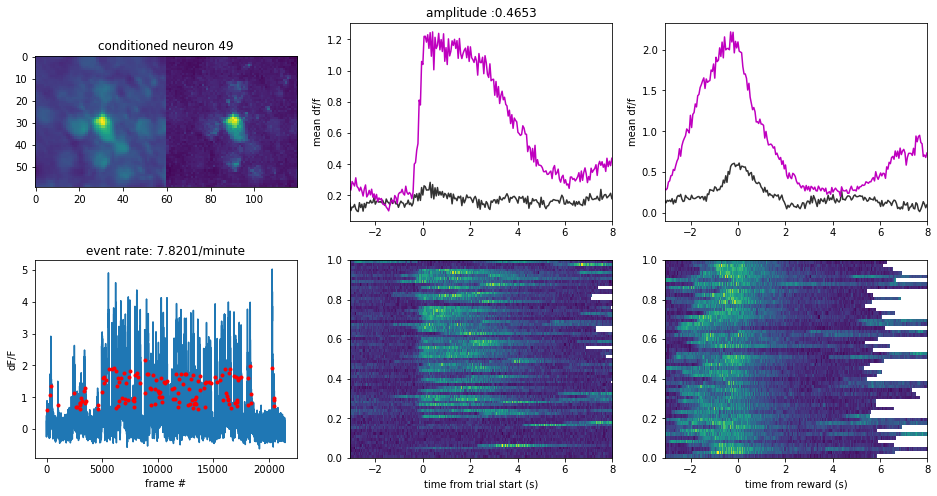

In [10]:
# plotting
# #cn_list = np.concatenate(cn_list)
# cn_list_ = []
# for cn_ in cn_list:
#     if type(cn_)==np.int64:
#         cn_list_.append(cn_)
# cn_list = cn_list_.copy()
from rastermap import Rastermap
save_pdf_copy_files = True
needed_neuron_num = 20
target_amplitude = np.nan
max_abs_amplitude = .2
minimum_pixel_num = 60 # 60 for 6s
min_event_rate = .5
target_amplitude_rate_percentile = 100#95
minimum_f0_percentile = 10
target_event_rate = 10

roi_pixel_range = 30 # display purposes
last_session = sessions[-1]
if len(sessions)>1:
    previous_session = sessions[-2]
else:
    previous_session = sessions[-1]
cn = np.median(np.asarray(data_dict[last_session]['cn'])[np.asarray(data_dict[last_session]['cn'])!=None])
try:
    if len(cn)>1:
        cn = np.nan
except:
    pass
if save_pdf_copy_files:
    Path(next_session_dir).mkdir(parents = True, exist_ok = True)
    pdf_obj = PdfPages(os.path.join(next_session_dir,'conditioned_neuron_suggestions.pdf'))
    
    
%matplotlib inline
    
fig = plt.figure(figsize = [20,10])
ax = fig.add_subplot(111)
#events_zscore = zscore(data_dict[last_session]['events_clean'],1)
#events_zscore = zscore(data_dict[last_session]['dff_sessionwise'],1)
events_zscore = data_dict[last_session]['dff_sessionwise'].copy()
events_zscore[np.isnan(events_zscore)] = -3
events_zscore[np.isinf(events_zscore)] = -3

model = Rastermap(n_components=2, n_X=10, nPC=50, init='pca')
model.fit(events_zscore)


im_events = ax.imshow(events_zscore[model.isort,:],aspect = 'auto', interpolation = 'none')  
ax.set_ylabel('neurons')    
ax.set_xlabel('frames')    
#im_events.set_clim(np.percentile(data_dict[last_session]['dff_sessionwise'].flatten(),[5,90])) 
im_events.set_clim([-1,3])
ax.set_title('{} - {}'.format(subject,last_session))

if save_pdf_copy_files:
    pdf_obj.savefig(fig) 
    #break
#%
from scipy.stats import zscore
fig = plt.figure(figsize = [10,10])
ax_1 = fig.add_subplot(2,2,1)
ax_1.plot(data_dict[last_session]['event_rate'],data_dict[last_session]['amplitude_rate'],'k.',alpha = .3)
ax_1.set_yscale('log')
ax_1.set_xlabel('event rate')
ax_1.set_xscale('log')  
ax_1.set_ylabel('accumulated dF/F/s')
#%
ax_2 = fig.add_subplot(2,2,2,sharey = ax_1)
ax_2.plot( data_dict[last_session]['trial_averaged_amplitude'],data_dict[last_session]['amplitude_rate'],'k.',alpha = .3)
ax_2.set_yscale('log')
ax_2.set_ylabel('accumulated dF/F/s')
ax_2.set_xlabel('tuning to task')
ax_2.set_xlim([-2,2])
ax_3 = fig.add_subplot(2,2,3,sharex = ax_1)
ax_3.plot(data_dict[last_session]['event_rate'], data_dict[last_session]['trial_averaged_amplitude'],'k.',alpha = .3)
ax_3.set_xlabel('event rate')
ax_3.set_xscale('log') 
ax_3.set_ylabel('tuning to task')

ax_4 = fig.add_subplot(2,2,4)
ax_4.plot(data_dict[last_session]['f0_scalar'],data_dict[last_session]['amplitude_rate'],'k.',alpha = .3)
ax_4.set_xlabel('F0')
ax_4.set_yscale('log') 
ax_4.set_ylabel('accumulated dF/F/s')




target_amplitude_rate = np.percentile(data_dict[last_session]['amplitude_rate'],target_amplitude_rate_percentile)
amplitude_rate_log = np.log(data_dict[last_session]['amplitude_rate'])
event_rate_log = np.log(data_dict[last_session]['event_rate'])
event_rate_log

f0 = data_dict[last_session]['f0_scalar']
minimum_f0 = np.percentile(f0,minimum_f0_percentile)

amplitudes_zscore = (np.asarray( data_dict[last_session]['trial_averaged_amplitude'])-np.nanmedian( data_dict[last_session]['trial_averaged_amplitude']))/np.nanstd( data_dict[last_session]['trial_averaged_amplitude'])
amplitude_rate_zscore = (amplitude_rate_log-np.nanmedian(amplitude_rate_log))/np.nanstd(amplitude_rate_log)
event_rate_zscore = (event_rate_log-np.nanmedian(event_rate_log))/np.nanstd(event_rate_log)
f0_zscore = (f0-np.median(f0))/np.std(f0)
if np.isnan(target_amplitude):
    distances = np.sqrt((np.asarray(amplitude_rate_zscore)-(np.log(target_amplitude_rate)-np.nanmedian(amplitude_rate_log))/np.nanstd(amplitude_rate_log))**2 + 
                        (np.asarray(event_rate_zscore)-(np.log(target_event_rate)-np.nanmedian(event_rate_log))/np.nanstd(event_rate_log))**2)
                        #(np.asarray(f0_zscore)-(target_f0-np.nanmedian(f0))/np.nanstd(f0))**2)# + (amplitudes-target_amplitude)**2)
else:
    distances = np.sqrt((np.asarray(amplitudes_zscore)-(target_amplitude-np.nanmedian(amplitude))/np.nanstd(amplitude))**2 +
                        (np.asarray(amplitude_rate_zscore)-(np.log(target_amplitude_rate)-np.nanmedian(amplitude_rate_log))/np.nanstd(amplitude_rate_log))**2 + 
                        (np.asarray(event_rate_zscore)-(np.log(target_event_rate)-np.nanmedian(event_rate_log))/np.nanstd(event_rate_log))**2)
                        #(np.asarray(f0_zscore)-(target_f0-np.nanmedian(f0))/np.nanstd(f0))**2)# + (amplitudes-target_amplitude)**2)
distances[np.abs( data_dict[last_session]['trial_averaged_amplitude'])>max_abs_amplitude] += np.inf
#distances[data_dict[last_session]['event_rate']<min_event_rate] += np.inf
distances[data_dict[last_session]['f0_scalar']<minimum_f0] += np.inf
distances[pixel_num_list<minimum_pixel_num] += np.inf
potential_cn_list_ = list(np.argsort(distances))#[:needed_neuron_num]
potential_cn_list = []
while len(potential_cn_list)<needed_neuron_num:
    pot_cn_now = potential_cn_list_.pop(0)
    if pot_cn_now not in cn_list:
        potential_cn_list.append(pot_cn_now)
potential_cn_list = np.concatenate([potential_cn_list,cn_list])
potential_cn_list = np.asarray(potential_cn_list,int)
for idx in potential_cn_list:
    if idx == cn:
        color = 'mo'
    elif idx in cn_list:
        color = 'go'
    else:
        color = 'ro'
    ax_1.plot(data_dict[last_session]['event_rate'][idx],data_dict[last_session]['amplitude_rate'][idx],color,alpha = .5)
    ax_2.plot( data_dict[last_session]['trial_averaged_amplitude'][idx],data_dict[last_session]['amplitude_rate'][idx],color,alpha = .5)
    ax_3.plot(data_dict[last_session]['event_rate'][idx], data_dict[last_session]['trial_averaged_amplitude'][idx],color,alpha = .5)
    ax_4.plot(data_dict[last_session]['f0_scalar'][idx],data_dict[last_session]['amplitude_rate'][idx],color,alpha = .5)
if save_pdf_copy_files:
    pdf_obj.savefig(fig) 
#%

fig_meanimage = plt.figure(figsize = [10,10])
ax_mean_activity = fig_meanimage.add_subplot(2,1,1)
ax_mean_image_ = fig_meanimage.add_subplot(2,1,2)
ax_mean_image_.imshow(data_dict[last_session]['mean_image'], interpolation = 'none')
detectable_event_ratio = np.mean(data_dict[last_session]['signal_to_noise_trace']>minimum_d_prime,1)
order = np.argsort( data_dict[last_session]['trial_averaged_amplitude'])
im_mean_activity = ax_mean_activity.imshow(mean_activity_matrix_normalized[order,:],aspect= 'auto', interpolation = 'none',extent = [data_dict[last_session]['time_since_trial_start'][0],data_dict[last_session]['time_since_trial_start'][-1],mean_activity_matrix_normalized.shape[0]-.5,-.5])
ax_mean_activity.set_xlim([data_dict[last_session]['time_since_trial_start'][0],time_to_average_after_trial_start])
# =============================================================================
# ticks = np.arange(0,len(data_dict[last_session]['time_since_trial_start']),np.argmax(data_dict[last_session]['time_since_trial_start']>0)-1)#np.asarray(ax_mean_activity.get_xticks(),int)[1:-1]
# ax_mean_activity.set_xticks(ticks)
# ax_mean_activity.set_xticklabels(np.round(data_dict[last_session]['time_since_trial_start'][ticks],2))
# =============================================================================

im_mean_activity.set_clim(np.percentile(mean_activity_matrix_normalized.flatten(),[5,95]))
#%





for idx in potential_cn_list:#cn_list:#potential_cn_list:
    fig = plt.figure(figsize = [16,8])
    ax_mean_image = fig.add_subplot(2,3,1)
    ax_trial_average = fig.add_subplot(2,3,2)
    ax_whole_session = fig.add_subplot(2,3,4)
    ax_trial_locked_activity = fig.add_subplot(2,3,5,sharex = ax_trial_average)
    
    ax_reward_average = fig.add_subplot(2,3,3,sharex = ax_trial_average)
    ax_reward_locked_activity = fig.add_subplot(2,3,6,sharex = ax_trial_average)
    
    y= int(data_dict[last_session]['roiY'][idx])
    x= int(data_dict[last_session]['roiX'][idx])
    
    s = data_dict[last_session]['mean_image'].shape
    mean_image_cutout = data_dict[last_session]['mean_image'][np.max([0,y-roi_pixel_range]):np.min([s[0],roi_pixel_range+y]),
                                                              np.max([0,x- roi_pixel_range]):np.min([s[1],roi_pixel_range+x])]
    mean_image_cutout = mean_image_cutout/np.max(mean_image_cutout)
    max_image_cutout = data_dict[last_session]['max_image'][np.max([0,y-roi_pixel_range]):np.min([s[0],roi_pixel_range+y]),
                                                              np.max([0,x- roi_pixel_range]):np.min([s[1],roi_pixel_range+x])]
    max_image_cutout = max_image_cutout/np.max(max_image_cutout)
    ax_mean_image.imshow(np.concatenate([mean_image_cutout,max_image_cutout],1), interpolation = 'none')
    if idx == cn:
        color = 'mo'
        ax_mean_image.set_title('conditioned neuron {}'.format(idx))
    elif idx in cn_list:
        color = 'g.'
        ax_mean_image.set_title('other conditioned neuron {}'.format(idx))
    else:
        color = 'rx'
        ax_mean_image.set_title('neuron {}'.format(idx))
    ax_mean_image_.plot(data_dict[last_session]['roiX'][idx],data_dict[last_session]['roiY'][idx],color)
    ax_mean_image_.text(data_dict[last_session]['roiX'][idx],data_dict[last_session]['roiY'][idx], str(idx),color = 'white')
    ax_mean_activity.plot(0,order[idx],color)
    needed_frames_prev= data_dict[previous_session]['time_since_trial_start']<time_to_average_after_trial_start
    needed_frames= data_dict[last_session]['time_since_trial_start']<time_to_average_after_trial_start
    ax_trial_average.plot(data_dict[previous_session]['time_since_trial_start'][needed_frames_prev],data_dict[previous_session]['mean_activity_matrix'][idx,needed_frames_prev],'k-',alpha =.8)
    
    
    try:
        ax_trial_average.plot(data_dict[last_session]['time_since_trial_start'][needed_frames],data_dict[last_session]['mean_activity_matrix_previous_cn'][idx,needed_frames],'r-',alpha =.8)
    except:
        pass
    
    ax_trial_average.plot(data_dict[last_session]['time_since_trial_start'][needed_frames],data_dict[last_session]['mean_activity_matrix'][idx,needed_frames],'m-')
    
    ax_trial_locked_activity.set_xlabel('time from trial start (s)')
    ax_trial_average.set_ylabel('mean df/f')
    ax_trial_average.set_title('amplitude :{0:.4f}'.format( data_dict[last_session]['trial_averaged_amplitude'][idx]))
    ax_trial_average.set_xlim([data_dict[last_session]['time_since_trial_start'][0],time_to_average_after_trial_start])
    ax_trial_locked_activity.imshow(trialwise_dff_until_reward[:,idx,:].squeeze().T,aspect = 'auto', interpolation = 'none',extent = [data_dict[last_session]['time_since_trial_start'][0],data_dict[last_session]['time_since_trial_start'][-1],0,1])
    
    ax_reward_average.plot(data_dict[previous_session]['time_since_trial_start'][needed_frames_prev],data_dict[previous_session]['mean_reward_matrix'][idx,needed_frames_prev],'k-',alpha =.8)
    try:
        ax_reward_average.plot(data_dict[last_session]['time_since_trial_start'][needed_frames],data_dict[last_session]['mean_reward_matrix_previous_cn'][idx,needed_frames],'r-',alpha =.8)
    except:
        pass
    ax_reward_average.plot(data_dict[last_session]['time_since_trial_start'][needed_frames],mean_reward_matrix[idx,needed_frames],'m-')
    ax_reward_locked_activity.set_xlabel('time from reward (s)')
    ax_reward_average.set_ylabel('mean df/f')
    ax_reward_locked_activity.imshow(trialwise_reward_matrix[:,idx,:].squeeze().T,
                                     aspect = 'auto',
                                     extent = [data_dict[last_session]['time_since_trial_start'][0],data_dict[last_session]['time_since_trial_start'][-1],0,1],
                                     interpolation = 'none')
    ax_trial_average.set_xlim([data_dict[last_session]['time_since_trial_start'][0],time_to_average_after_trial_start])
    
# =============================================================================
#     xticks = ax_trial_locked_activity.get_xticks()
#     xticks = np.asarray(xticks[(xticks>0)&(xticks<len(data_dict[last_session]['time_since_trial_start']))],int)
#     ax_trial_locked_activity.set_xticks(xticks)
#     ax_trial_locked_activity.set_xticklabels(np.round(data_dict[last_session]['time_since_trial_start'][xticks],2))
# =============================================================================
    
    ax_whole_session.plot(data_dict[last_session]['dff_sessionwise'][idx,:])
    #%:30 a.m. to 5:30 p.m.
    for start_,end_ in  zip(np.where(np.diff(np.concatenate([[0],data_dict[last_session]['events_clean'][idx,:],[0]]))>0)[0],
                            np.where(np.diff(np.concatenate([[0],data_dict[last_session]['events_clean'][idx,:],[0]]))<0)[0]):
        center_idx = int(np.mean([start_,end_]))
        ax_whole_session.plot(center_idx,data_dict[last_session]['events_clean'][idx,center_idx],'r.')
                            
# =============================================================================
#     ax_whole_session.plot(np.where(data_dict[last_session]['events_clean'][idx,:]>0)[0],data_dict[last_session]['dff_sessionwise'][idx,data_dict[last_session]['events_clean'][idx,:]>0],'r.')
# =============================================================================
    ax_whole_session.set_xlabel('frame #')
    ax_whole_session.set_ylabel('dF/F')
    ax_whole_session.set_title('event rate: {0:.4f}/minute'.format(data_dict[last_session]['event_rate'][idx]))
    if save_pdf_copy_files:
        pdf_obj.savefig(fig) 
    #plt.close()
    #break
if save_pdf_copy_files:    
    pdf_obj.savefig(fig_meanimage) 
    pdf_obj.close()
    
    #% save selected roi indices
    mdict = mdict={'potential_cn_list': potential_cn_list.tolist(),
                   'meanImg': data_dict[last_session]['mean_image']}
    savemat(file_name=os.path.join(s2p_base_dir,subject, fov,'ops.mat'),
            mdict = mdict)
    # copy files over
    for file in file_list_to_copy_over:
        shutil.copyfile(os.path.join(s2p_base_dir,subject,fov,file),os.path.join(next_session_dir,file))

In [86]:
data_dict[last_session]['mean_activity_matrix'].shape

(492, 500)